# ***Telco customer churn***

امامة عوير - امل رجب- راما الحسين - راما يزبك - فراس طيب


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from scipy.stats import boxcox
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.utils import resample
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
import warnings
warnings.filterwarnings('ignore')

**About the data**
(As provided in the overview/description)
* Customers who left within the last month – the column is called **Churn**
* Services that each customer has signed up for – phone, multiple lines, internet, online security, online backup, device protection, tech support, and streaming TV and movies
* Customer account information – how long they’ve been a customer, contract, payment method, paperless billing, monthly charges, and total charges
* Demographic info about customers – gender, age range, and if they have partners and dependents


Each row represents a customer, each column contains customer’s attributes described on the column Metadata above.


# **Goals**
Perform an Exploratory Data Analysis (EDA) to visualize and understand:
* The distribution of values of the target and features;
* The relationship between each feature and the likelihood of customer churn.

Predict churn using 20% of data as test set using the following models:
* Logistic Regression;
* Random Forest;
*
*

Understand how each feature impacts the predicted value using:
* Feature Importance;
*

In [3]:
df = pd.read_csv('/content/drive/My Drive/WA_Fn-UseC_-Telco-Customer-Churn.csv')

In [ ]:
# checking data size
df.shape

(7043, 21)

In [ ]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


**More:**
Data Catalog

• Senior Citizen: Indicates if the customer is 65 or older: Yes, No.

• Dependents: Indicates if the customer lives with any dependents: Yes, No. Dependents could be children, parents, grandparents, etc.

• Tenure in Months: Indicates the total amount of months that the customer has been with the company.

• Internet Service: Indicates if the customer subscribes to Internet service with the company: No, DSL, Fiber Optic, Cable.

• Contract: Indicates the customer’s current contract type: Month-to-Month, One Year, Two Year.

• Payment Method: Indicates how the customer pays their bill: Bank Withdrawal, Credit Card, Mailed Check.

• Monthly Charge: Indicates the customer’s current total monthly charge for all their services from the company.

• Total Charges: Indicates the customer’s total charges, calculated to the end of the quarter specified above.

• Churn: 1 = the customer left the company this quarter. 0 = the customer remained with the company bold text.




# DM




### **Data visualization & preprocessing**

In [ ]:
#information about datasets
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [ ]:
df.describe()

,SeniorCitizen,tenure,MonthlyCharges
count,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692
std,0.368612,24.559481,30.090047
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.500000
50%,0.000000,29.000000,70.350000
75%,0.000000,55.000000,89.850000
max,1.000000,72.000000,118.750000


#### numerical columns

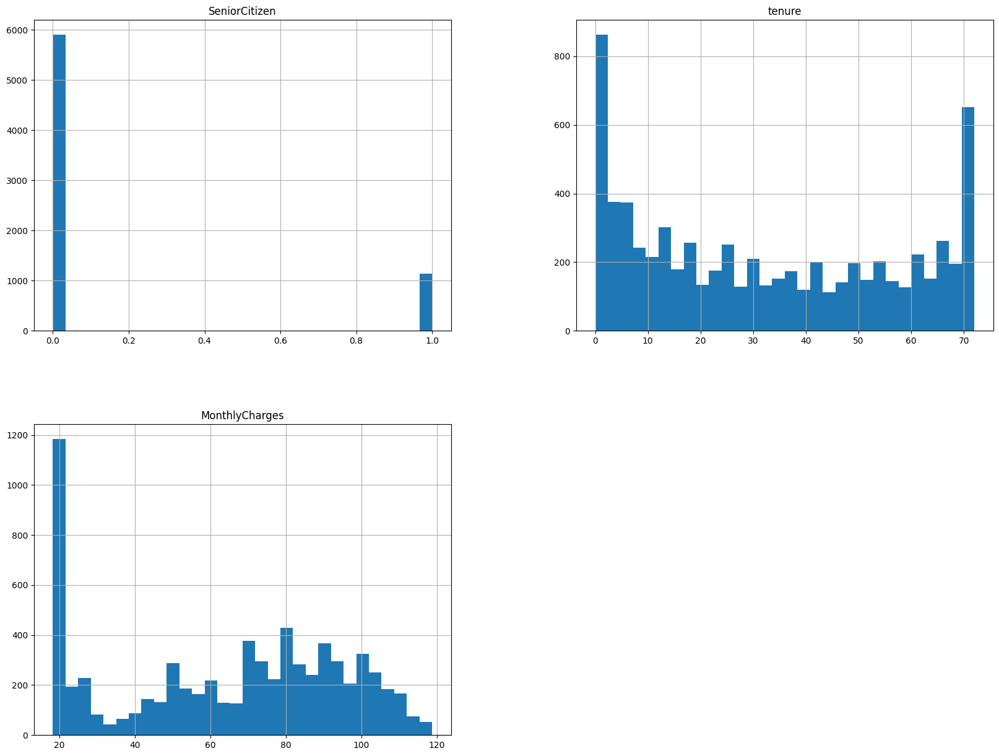

In [ ]:
# Histograms for numerical columns
df.hist(bins=30, figsize=(20, 15))
plt.show()


We notice that the number of youth users is more than elderly.
We observe that the number of users is high in the first and last months. The distribution is scattered.
Most customers recharge between 20 and 100. Few customers recharge higher amounts. This means that pricing is suitable for everyone, and the pricing structure considers individual budgets.

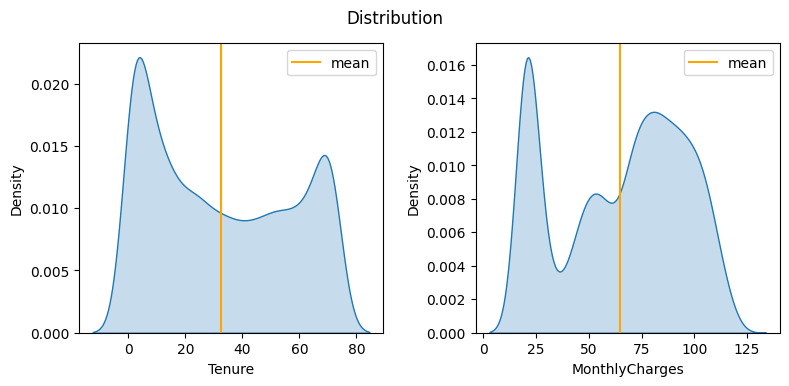

In [ ]:
plt.figure(figsize=[8, 7])
plt.suptitle('Distribution')

plt.subplot(2, 2, 1)
sns.kdeplot(df['tenure'], fill=True)
plt.xlabel('Tenure')
plt.ylabel('Density')
plt.axvline(df['tenure'].mean(), label='mean', c='orange')
plt.legend()

plt.subplot(2, 2, 2)
sns.kdeplot(df['MonthlyCharges'], fill=True)
plt.xlabel('MonthlyCharges')
plt.ylabel('Density')
plt.axvline(df['MonthlyCharges'].mean(), label='mean', c='orange')
plt.legend()



plt.tight_layout()
plt.show()

feature ***TotalCharges***

In [ ]:
print(df['TotalCharges'])

0         29.85
1        1889.5
2        108.15
3       1840.75
4        151.65
         ...   
7038     1990.5
7039     7362.9
7040     346.45
7041      306.6
7042     6844.5
Name: TotalCharges, Length: 7043, dtype: object


p.s. TotalCharges should be numeric


In [4]:
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')
df['TotalCharges'].dtype

dtype('float64')

After changing a column from string to numeric, some values may not be recognized, resulting in missing values. Let’s check if this happened.

In [ ]:
df['TotalCharges'].isnull().sum()

11

*Now there are supposedly 11 missing values, but they might indicate that there were no charges for that customer up to the point when the data was obtained. The feature 'tenure' indicates for how long someone has been a customer. Let's check the number of samples with value '0' on that feature and, in case we also find 11 customers, compare if their index match those from the 'missing' values.*

In [5]:
df['tenure'].isin([0]).sum()

11

In [ ]:
print(df[df['tenure'].isin([0])].index)
print(df[df['TotalCharges'].isna()].index)

Index([488, 753, 936, 1082, 1340, 3331, 3826, 4380, 5218, 6670, 6754], dtype='int64')
Index([488, 753, 936, 1082, 1340, 3331, 3826, 4380, 5218, 6670, 6754], dtype='int64')


We got a match here. After confirming our suspects, we can replace those missing values with '0'.

In [6]:
df.loc[:,'TotalCharges'] = df.loc[:,'TotalCharges'].replace(np.nan,0)
df['TotalCharges'].isnull().sum()

0

#### categorical columns

feature ***SeniorCitizen***

The feature 'Senior Citizen', which is categorical ('Yes' or 'No'), is set as numeric. Although all features will be changed to numeric to be used in our prediction models, I'll convert it from numeric to string for now.

In [7]:
df['SeniorCitizen'] = df['SeniorCitizen'].apply(str)
senior_map = {'0': 'No', '1': 'Yes'}
df['SeniorCitizen'] = df['SeniorCitizen'].map(senior_map)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   object 
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


checking the possible values of categorical features and viewing descriptive statistics (df.describe) for numerical features.

In [ ]:
unique_counts = {col: df[col].nunique() for col in df.select_dtypes('object').columns}
print(unique_counts)


{'customerID': 7043, 'gender': 2, 'SeniorCitizen': 2, 'Partner': 2, 'Dependents': 2, 'PhoneService': 2, 'MultipleLines': 3, 'InternetService': 3, 'OnlineSecurity': 3, 'OnlineBackup': 3, 'DeviceProtection': 3, 'TechSupport': 3, 'StreamingTV': 3, 'StreamingMovies': 3, 'Contract': 3, 'PaperlessBilling': 2, 'PaymentMethod': 4, 'Churn': 2}


In [ ]:
for col in df.select_dtypes('object').columns:
    print(col, '- # unique values:', df[col].nunique())

customerID - # unique values: 7043
gender - # unique values: 2
SeniorCitizen - # unique values: 2
Partner - # unique values: 2
Dependents - # unique values: 2
PhoneService - # unique values: 2
MultipleLines - # unique values: 3
InternetService - # unique values: 3
OnlineSecurity - # unique values: 3
OnlineBackup - # unique values: 3
DeviceProtection - # unique values: 3
TechSupport - # unique values: 3
StreamingTV - # unique values: 3
StreamingMovies - # unique values: 3
Contract - # unique values: 3
PaperlessBilling - # unique values: 2
PaymentMethod - # unique values: 4
Churn - # unique values: 2


In [ ]:
for col in df.select_dtypes('object').columns:
    print(col, '\n')
    print(df[col].value_counts(), '\n')

customerID 

customerID
7590-VHVEG    1
3791-LGQCY    1
6008-NAIXK    1
5956-YHHRX    1
5365-LLFYV    1
             ..
9796-MVYXX    1
2637-FKFSY    1
1552-AAGRX    1
4304-TSPVK    1
3186-AJIEK    1
Name: count, Length: 7043, dtype: int64 

gender 

gender
Male      3555
Female    3488
Name: count, dtype: int64 

SeniorCitizen 

SeniorCitizen
No     5901
Yes    1142
Name: count, dtype: int64 

Partner 

Partner
No     3641
Yes    3402
Name: count, dtype: int64 

Dependents 

Dependents
No     4933
Yes    2110
Name: count, dtype: int64 

PhoneService 

PhoneService
Yes    6361
No      682
Name: count, dtype: int64 

MultipleLines 

MultipleLines
No                  3390
Yes                 2971
No phone service     682
Name: count, dtype: int64 

InternetService 

InternetService
Fiber optic    3096
DSL            2421
No             1526
Name: count, dtype: int64 

OnlineSecurity 

OnlineSecurity
No                     3498
Yes                    2019
No internet service    1526
Name:

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
tenure,7043.0,32.371149,24.559481,0.00,9.00,29.000,55.0000,72.00
MonthlyCharges,7043.0,64.761692,30.090047,18.25,35.50,70.350,89.8500,118.75
TotalCharges,7032.0,2283.300441,2266.771362,18.80,401.45,1397.475,3794.7375,8684.80


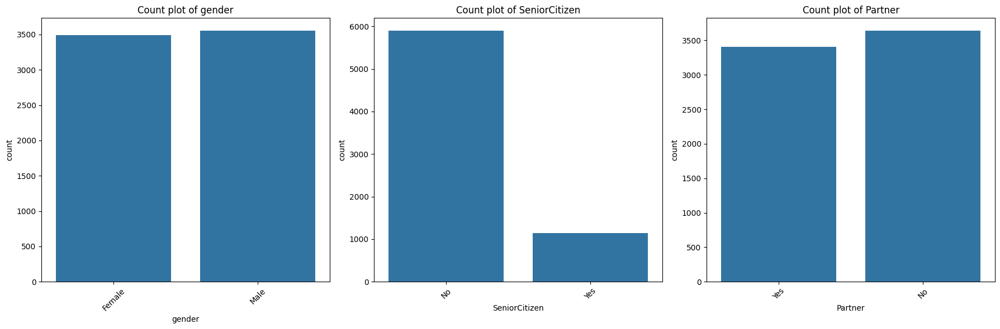

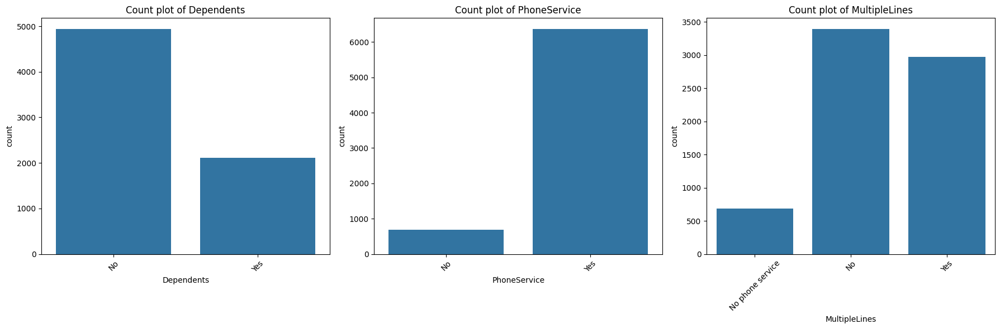

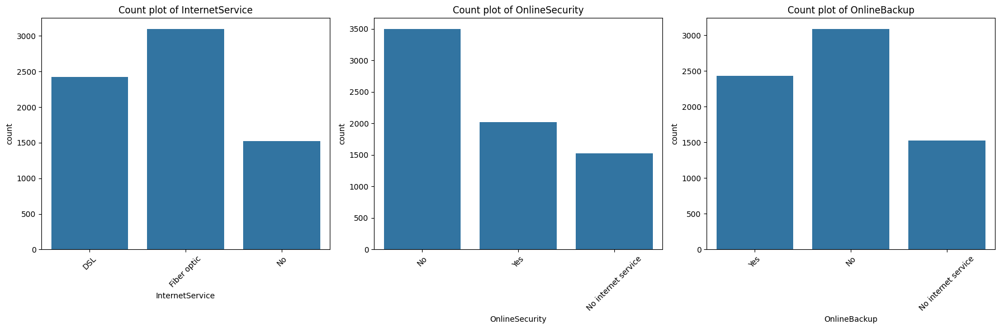

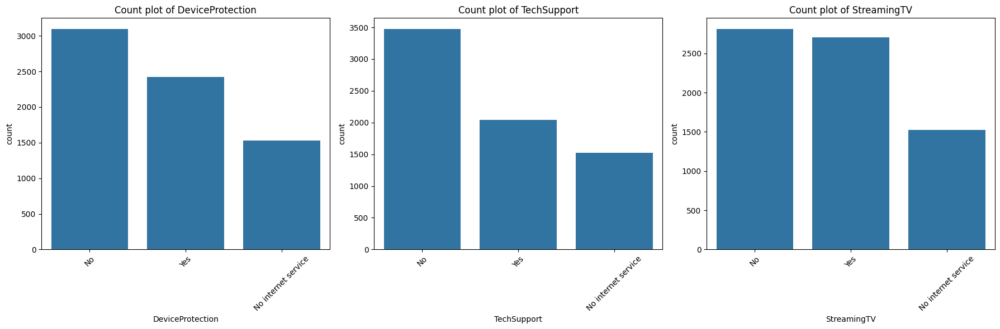

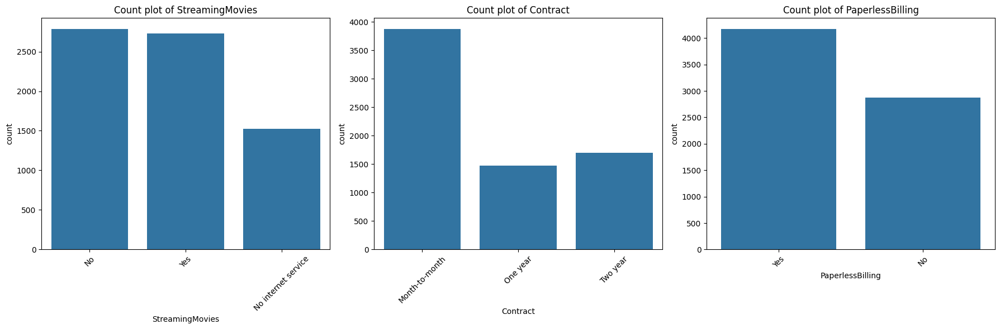

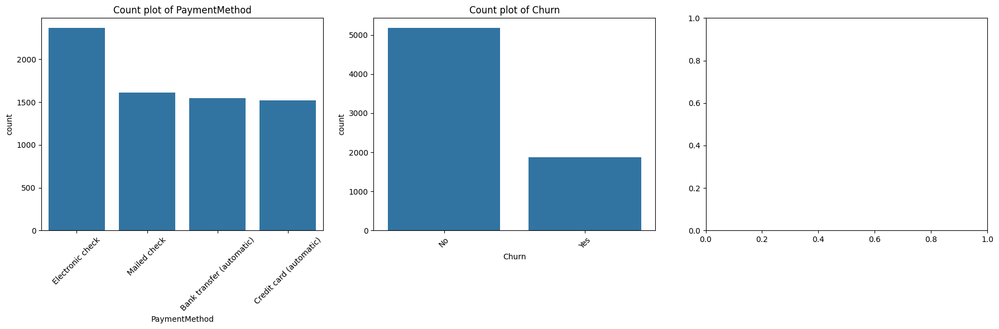

In [ ]:
# Bar charts for categorical variables
categorical_cols = ['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines',
                    'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
                    'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod', 'Churn']

for i in range(0, len(categorical_cols), 3):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    for j, col in enumerate(categorical_cols[i:i+3]):

        sns.countplot(ax=axes[j], x=col, data=df)
        axes[j].set_title(f'Count plot of {col}')
        for tick in axes[j].get_xticklabels():
            tick.set_rotation(45)

    plt.tight_layout()
    plt.show()


Gender : balanced gender distribution

 SeniorCitizen : Most customers are non-senior citizens

 Partner : balanced distribution for customers that have or have't partner

 Dependents : number of customers without dependents is more than double number of customers with dependents

PhoneService : majority of customers have phone service

MultipleLines : 1. Most customers have phone service.
                2. more customers don't have multiple lines compared to those who do.

 it is clear that most customers don't have dependents and almost all have phone service , but fewer have multiple lines.


InternetService : 1. the most common type is 'Fiber optic' then 'DSL'.
                   2. about 1500 dos't have Internet Service (less than a quarter)

OnlineSecurity : 1. half of customers don't have online security
                  2. about 1500 dos't have Internet Service (less than a quarter) so don't have OnlineSecurity
                  3. a smaller portion have online security (2000)


 OnlineBackup : 1. half of customers don't have online Backup
                2. about 1500 dos't have Internet Service (less than a quarter) so don't have OnlineBackup
                3. less than half of data have OnlineBackup





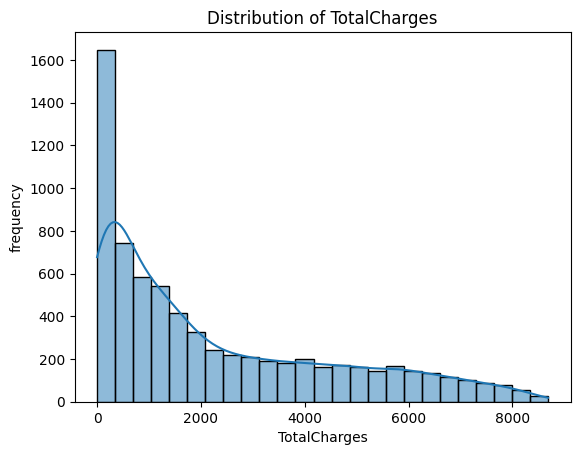

In [ ]:
#Distribution of TotalCharges Column
n_columns = ['TotalCharges']

for col in n_columns:
    sns.histplot(df[col],kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('frequency')
    plt.show()

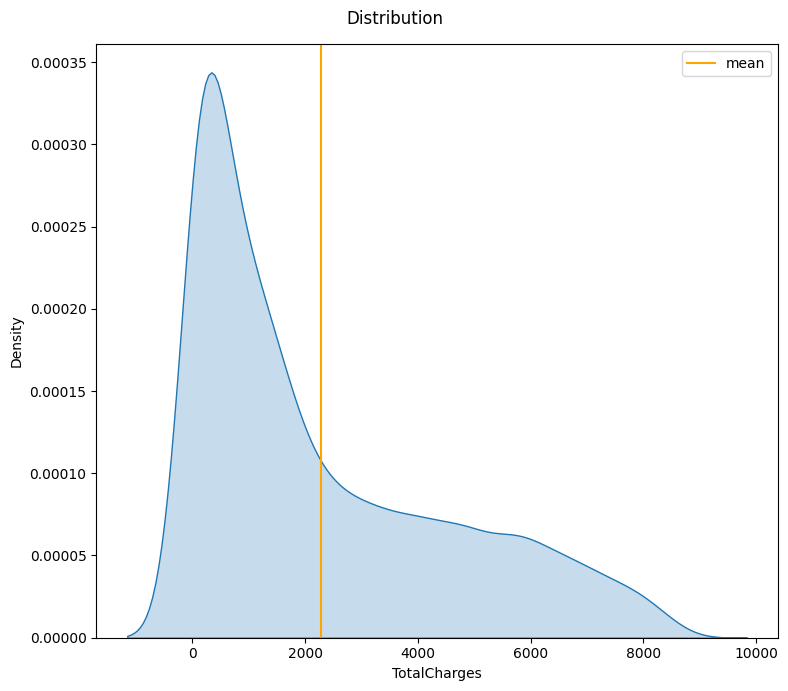

In [ ]:
plt.figure(figsize=[8, 7])
plt.suptitle('Distribution')
plt.subplot(1, 1, 1)
sns.kdeplot(df['TotalCharges'], fill=True)
plt.xlabel('TotalCharges')
plt.ylabel('Density')
plt.axvline(df['TotalCharges'].mean(), label='mean', c='orange')
plt.legend()
plt.tight_layout()
plt.show()

#### categories columns

In [ ]:
# total charge CATEGORY
quantiles = df['TotalCharges'].quantile([0.25, 0.5, 0.75])
median_charge = df['TotalCharges'].median()
max_charge = df['TotalCharges'].max()
min_charge = df['TotalCharges'].min()
print('median charge =',median_charge)
print('max charge =',max_charge)
print('min charge =',min_charge)

# Define ranges
low_range = (min_charge, median_charge - 500 )
med_range = (median_charge - 500 , median_charge + 2000)
high_range = (median_charge + 2000 , max_charge)
print('low range =',low_range)
print('medium range =',med_range)
print('high range =',high_range)


def categorize_Total_Charges(charge):
    if charge <= low_range[1]:
        return 'low'
    elif charge >= high_range[0]:
        return 'high'
    else:
        return 'medium'

df['TotalCharges_category'] = df['TotalCharges'].apply(categorize_Total_Charges)
df[['TotalCharges', 'TotalCharges_category']].head()

median charge = 1394.55
max charge = 8684.8
min charge = 0.0
low range = (0.0, 894.55)
medium range = (894.55, 3394.55)
high range = (3394.55, 8684.8)


,TotalCharges,TotalCharges_category
0,29.85,low
1,1889.50,medium
2,108.15,low
3,1840.75,medium
4,151.65,low


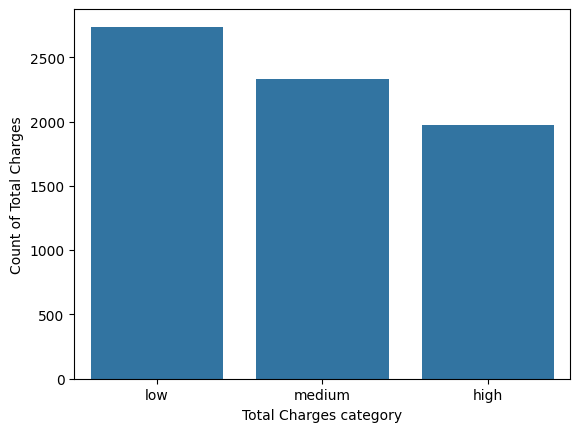

In [ ]:
# Bar charts for  total charge CATEGORY

sns.countplot(x='TotalCharges_category',data=df)
plt.xlabel('Total Charges category')
plt.ylabel('Count of Total Charges')
plt.show()

In [ ]:
# Monthly charge CATEGORY
quantiles = df['MonthlyCharges'].quantile([0.25, 0.5, 0.75])
median_charge = df['MonthlyCharges'].median()
max_charge = df['MonthlyCharges'].max()
min_charge = df['MonthlyCharges'].min()
print('median charge =',median_charge)
print('max charge =',max_charge)
print('min charge =',min_charge)

# Define ranges
low_range = (min_charge, median_charge - 20 )
med_range = (median_charge - 20 , median_charge + 10)
high_range = (median_charge + 10 , max_charge)
print('low range =',low_range)
print('medium range =',med_range)
print('high range =',high_range)


def categorize_Monthly_Charges(charge):
    if charge <= low_range[1]:
        return 'low'
    elif charge >= high_range[0]:
        return 'high'
    else:
        return 'medium'

df['MonthlyCharges_category'] = df['MonthlyCharges'].apply(categorize_Monthly_Charges)
df[['MonthlyCharges', 'MonthlyCharges_category']].head()

median charge = 70.35
max charge = 118.75
min charge = 18.25
low range = (18.25, 50.349999999999994)
medium range = (50.349999999999994, 80.35)
high range = (80.35, 118.75)


,MonthlyCharges,MonthlyCharges_category
0,29.85,low
1,56.95,medium
2,53.85,medium
3,42.30,low
4,70.70,medium


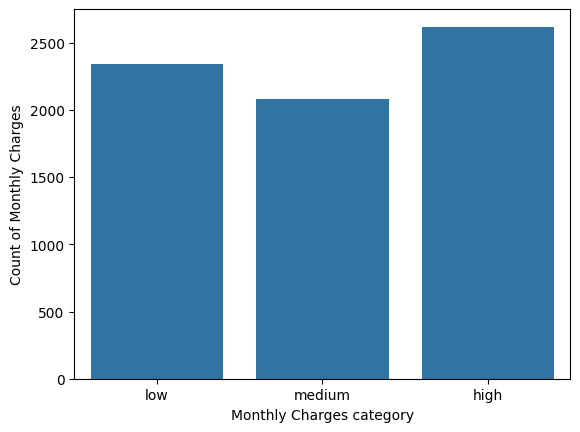

In [ ]:
# Bar charts for Monthly charge CATEGORY

sns.countplot(x='MonthlyCharges_category',data=df)
plt.xlabel('Monthly Charges category')
plt.ylabel('Count of Monthly Charges')
plt.show()

In [ ]:
# Monthly tenure
quantiles = df['tenure'].quantile([0.25, 0.5, 0.75])
median_tenure = df['tenure'].median()
max_tenure = df['tenure'].max()
min_tenure = df['tenure'].min()
print('median tenure =',median_tenure)
print('max tenure =',max_tenure)
print('min tenure =',min_tenure)

low_range = (min_tenure, median_tenure - 9 )
med_range = (median_tenure - 9 , median_tenure + 20)
high_range = (median_tenure + 20 , max_tenure)
print('low range =',low_range)
print('medium range =',med_range)
print('high range =',high_range)


def categorize_tenure(mounth):
    if mounth <= low_range[1]:
        return 'low'
    elif mounth >= high_range[0]:
        return 'high'
    else:
        return 'medium'

df['tenure_category'] = df['tenure'].apply(categorize_tenure)
df[['tenure', 'tenure_category']].head()

median tenure = 29.0
max tenure = 72
min tenure = 0
low range = (0, 20.0)
medium range = (20.0, 49.0)
high range = (49.0, 72)


,tenure,tenure_category
0,1,low
1,34,medium
2,2,low
3,45,medium
4,2,low


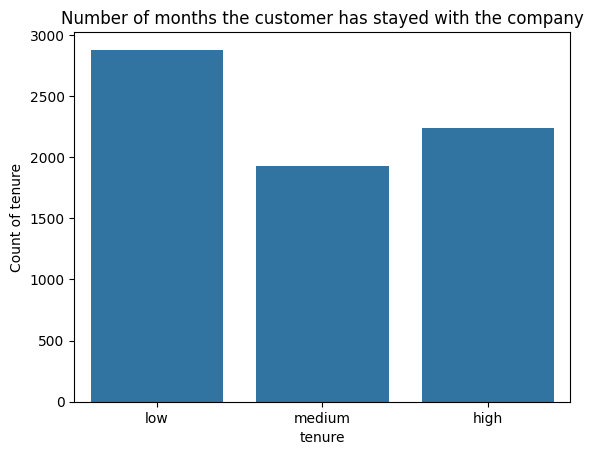

In [ ]:
# Bar charts for tenure CATEGORY

sns.countplot(x='tenure_category',data=df)
plt.title('Number of months the customer has stayed with the company')
plt.xlabel('tenure')
plt.ylabel('Count of tenure')
plt.show()

### **EDA**

#### duplication:

In [ ]:
df.duplicated().sum()

0

#### missing values:

In [ ]:
df.isna().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

#### outliers:

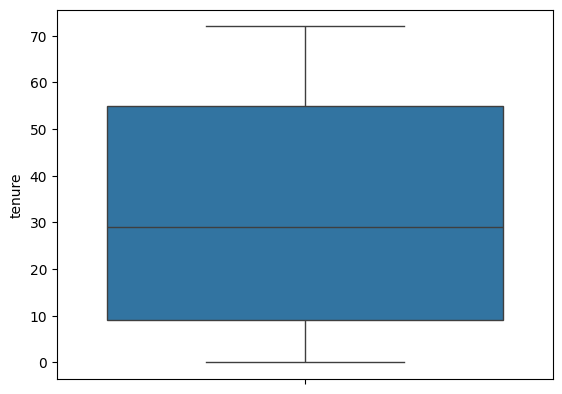

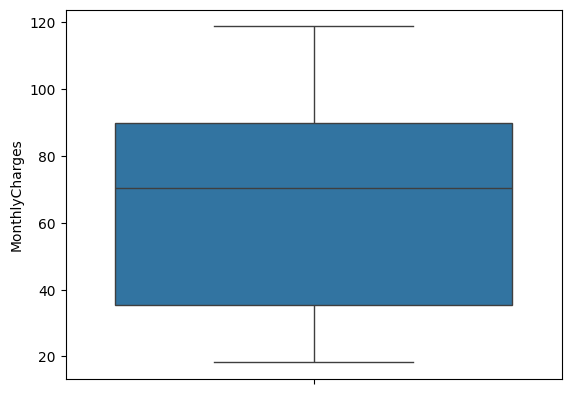

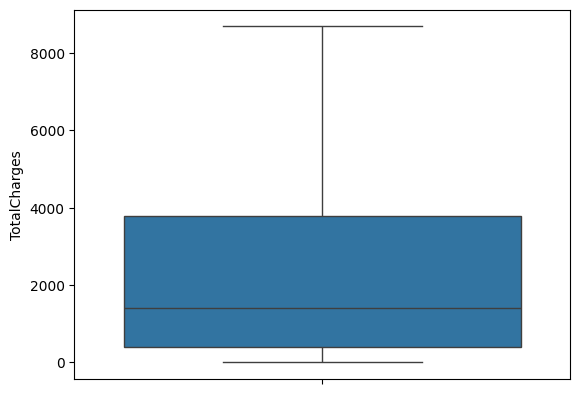

In [ ]:
# Box plots for numerical columns
numerical_cols = ['tenure', 'MonthlyCharges', 'TotalCharges']
for col in numerical_cols:
    sns.boxplot(y=df[col])
    plt.show()

In [ ]:
# Calculate Q1, Q3, and IQR for each numerical column
for col in numerical_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

    print(f'Column: {col}')
    print(f'Number of outliers: {outliers.shape[0]}')
    print('\n')


Column: tenure
Number of outliers: 0


Column: MonthlyCharges
Number of outliers: 0


Column: TotalCharges
Number of outliers: 0




 from plots .... no outiers in data

#### Standardization

In [ ]:
#unique values in each column
for column in df.columns:
    unique_values = df[column].unique()
    print(f"Unique values in column '{column}':")
    print(unique_values)
    print()

Unique values in column 'customerID':
['7590-VHVEG' '5575-GNVDE' '3668-QPYBK' ... '4801-JZAZL' '8361-LTMKD'
 '3186-AJIEK']

Unique values in column 'gender':
['Female' 'Male']

Unique values in column 'SeniorCitizen':
[0 1]

Unique values in column 'Partner':
['Yes' 'No']

Unique values in column 'Dependents':
['No' 'Yes']

Unique values in column 'tenure':
[ 1 34  2 45  8 22 10 28 62 13 16 58 49 25 69 52 71 21 12 30 47 72 17 27
  5 46 11 70 63 43 15 60 18 66  9  3 31 50 64 56  7 42 35 48 29 65 38 68
 32 55 37 36 41  6  4 33 67 23 57 61 14 20 53 40 59 24 44 19 54 51 26  0
 39]

Unique values in column 'PhoneService':
['No' 'Yes']

Unique values in column 'MultipleLines':
['No phone service' 'No' 'Yes']

Unique values in column 'InternetService':
['DSL' 'Fiber optic' 'No']

Unique values in column 'OnlineSecurity':
['No' 'Yes' 'No internet service']

Unique values in column 'OnlineBackup':
['Yes' 'No' 'No internet service']

Unique values in column 'DeviceProtection':
['No' 'Yes' 'No in

In [ ]:
columns_to_replace = ['OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies']

#replace 'No internet service' and 'No phone service' with 'No'

# df[columns_to_replace] = df[columns_to_replace].replace('No internet service', 'No')
# df['MultipleLines'] = df['MultipleLines'].replace('No phone service', 'No')

In [ ]:
#unique values in each column
for column in df.columns:
    unique_values = df[column].unique()
    print(f"Unique values in column '{column}':")
    print(unique_values)
    print()

Unique values in column 'customerID':
['7590-VHVEG' '5575-GNVDE' '3668-QPYBK' ... '4801-JZAZL' '8361-LTMKD'
 '3186-AJIEK']

Unique values in column 'gender':
['Female' 'Male']

Unique values in column 'SeniorCitizen':
['No' 'Yes']

Unique values in column 'Partner':
['Yes' 'No']

Unique values in column 'Dependents':
['No' 'Yes']

Unique values in column 'tenure':
[ 1 34  2 45  8 22 10 28 62 13 16 58 49 25 69 52 71 21 12 30 47 72 17 27
  5 46 11 70 63 43 15 60 18 66  9  3 31 50 64 56  7 42 35 48 29 65 38 68
 32 55 37 36 41  6  4 33 67 23 57 61 14 20 53 40 59 24 44 19 54 51 26  0
 39]

Unique values in column 'PhoneService':
['No' 'Yes']

Unique values in column 'MultipleLines':
['No' 'Yes']

Unique values in column 'InternetService':
['DSL' 'Fiber optic' 'No']

Unique values in column 'OnlineSecurity':
['No' 'Yes']

Unique values in column 'OnlineBackup':
['Yes' 'No']

Unique values in column 'DeviceProtection':
['No' 'Yes']

Unique values in column 'TechSupport':
['No' 'Yes']

Unique 

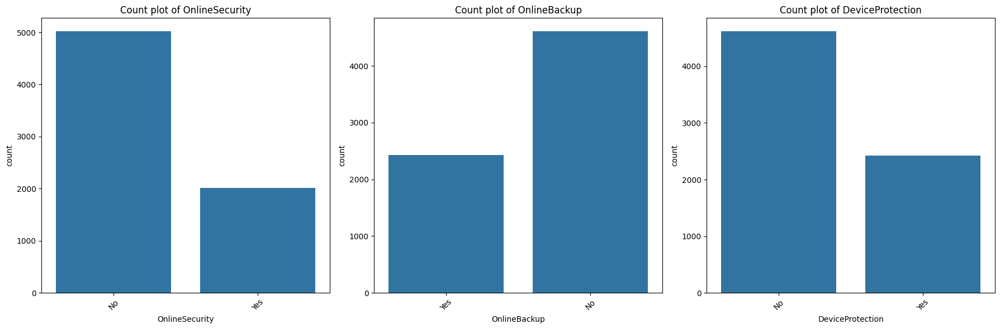

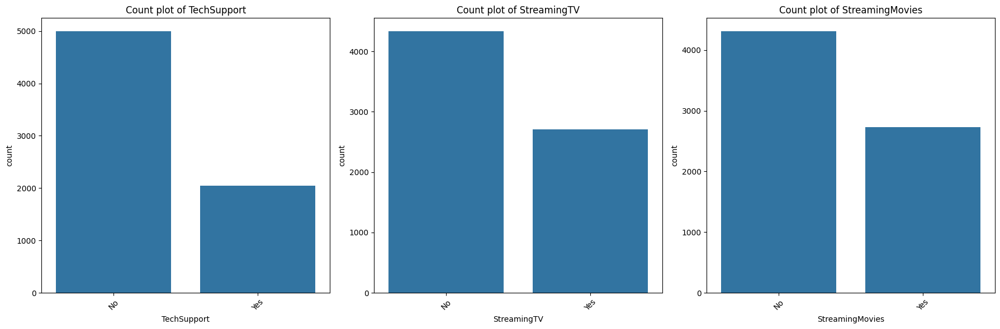

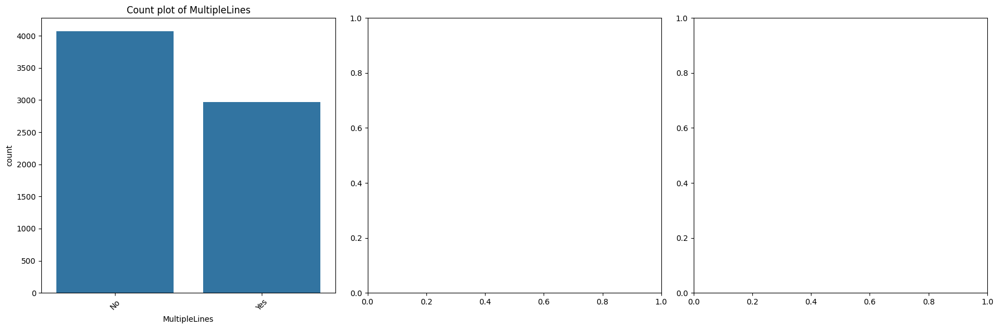

In [ ]:
# Bar charts for categorical variables after standarization
categorical_colus =  ['OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies' , 'MultipleLines']

for i in range(0, len(categorical_colus), 3):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    for j, col in enumerate(categorical_colus[i:i+3]):
        sns.countplot(ax=axes[j], x=col, data=df)
        axes[j].set_title(f'Count plot of {col}')
        for tick in axes[j].get_xticklabels():
            tick.set_rotation(45)
    plt.tight_layout()
    plt.show()

### feature ***Churn***

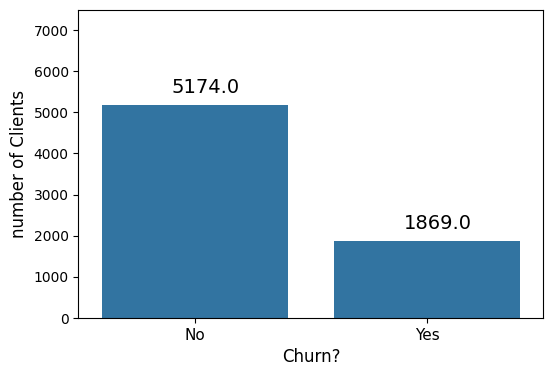

In [ ]:
plt.figure(figsize=(6,4))

ax = sns.countplot(x="Churn", data=df)

plt.xlabel("Churn?", fontsize= 12)
plt.ylabel("number of Clients", fontsize= 12)
plt.ylim(0,7500)
plt.xticks([0,1], ['No', 'Yes'], fontsize = 11)

for p in ax.patches:
    ax.annotate((p.get_height()), (p.get_x()+0.30, p.get_height()+300), fontsize = 14)

plt.show()

*our data is imbalanced *

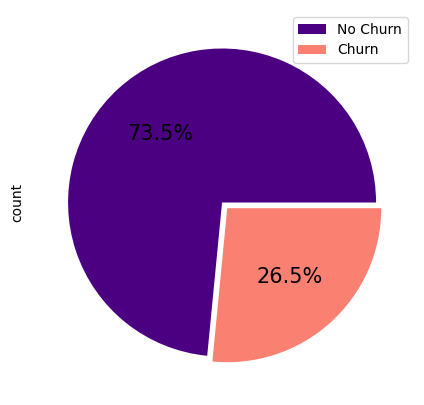

In [ ]:
plt.figure(figsize=(7,5))

# autopct='%1.1f%%'  to show the percentage of the total that each slice represents to the pie chart
df['Churn'].value_counts().plot(kind='pie',labels = ['',''], autopct='%1.1f%%', colors = ['indigo','salmon'], explode = [0,0.05], textprops = {"fontsize":15})
plt.legend(labels=['No Churn', 'Churn'])
plt.show()

above is a pie chart to visualize the distribution of the ‘Churn’ column

we can compare this number (26.5%) with the percentage of churn found for each category, which will provide us a better idea on the impact of a given feature in the company’s ability to retain its customers.

In [ ]:
#Label encoding Churn to use sns.barplot
le = LabelEncoder()
df['Churn'] = le.fit_transform(df['Churn'])
df['Churn'].value_counts()

Churn
0    5174
1    1869
Name: count, dtype: int64

We can divide the features into the following groups:
- Demographic features;
- Service-related features
- Account information related features (categorical and numerical).

For each group, we’ll start by looking at the features’ distributions. Then, we’ll check the percentage of churn for each category to understand their relationship with the target.

In [ ]:
demo_features = ['gender', 'SeniorCitizen', 'Partner', 'Dependents']

serv_features = ['PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup'
                , 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies']

cat_accinfo_features = ['Contract', 'PaperlessBilling', 'PaymentMethod']

num_accinfo_features = ['tenure', 'MonthlyCharges', 'TotalCharges']

##### **1. Demographic features**




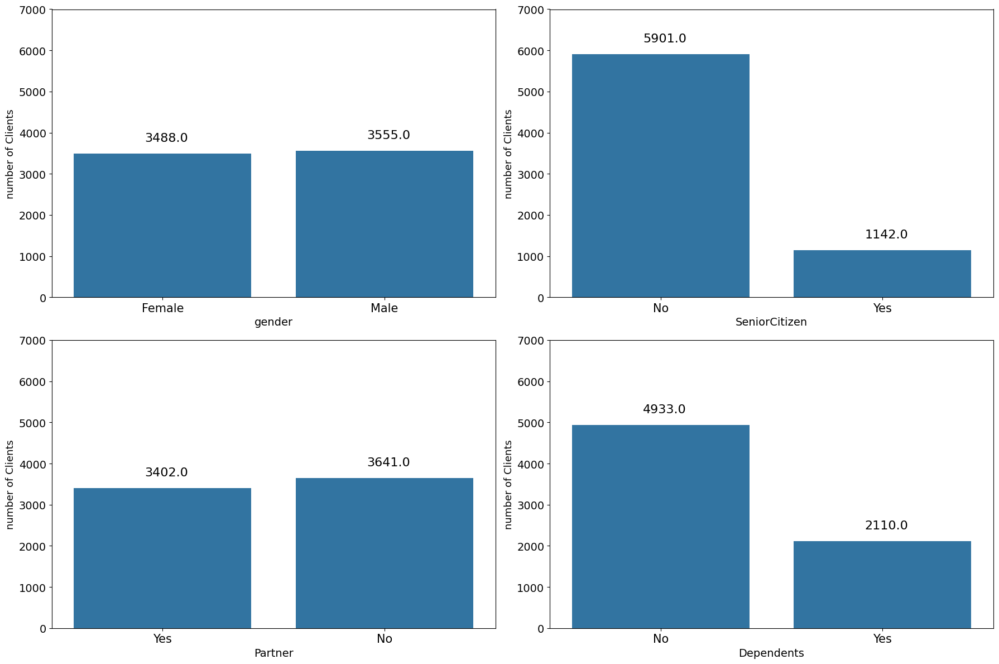

In [ ]:
# creating a set of bar plots for each of the demographic features (demo_features)
plt.figure(figsize=(18,12))

for i,col in enumerate(demo_features):
    plt.subplot(2,2,i + 1)

    ax = sns.countplot(data = df, x = col)

    plt.xlabel(col, fontsize= 14)
    plt.ylabel("number of Clients", fontsize= 13)
    plt.ylim(0,7000)
    plt.xticks(fontsize= 15)
    plt.yticks(fontsize= 14)

    for p in ax.patches:
        ax.annotate((p.get_height()), (p.get_x()+0.32, p.get_height()+300), fontsize= 16)

plt.tight_layout()

plt.show()

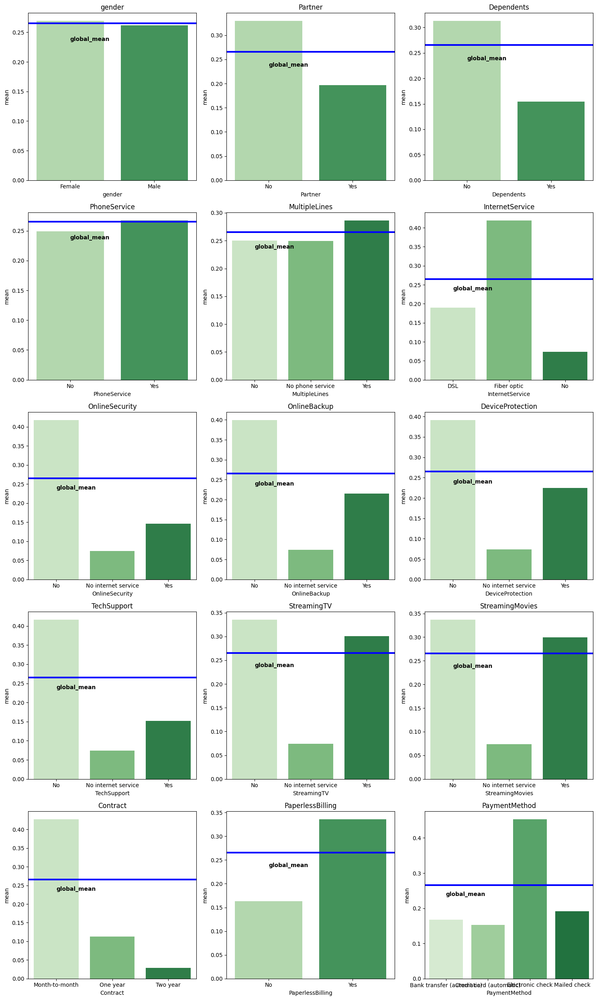

In [ ]:
df.Churn = (df.Churn == 'Yes').astype(int)
global_mean = df.Churn.mean()
round(global_mean, 2)
categorical = list(df.select_dtypes(include=['object']).columns)

# Exclude the 'customerID' column
if 'customerID' in categorical:
    categorical.remove('customerID')

# Set up the grid for subplots
n_cols = 3
n_rows = (len(categorical) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot each categorical feature
for i, feature in enumerate(categorical):
    df_group = df.groupby(by=feature).Churn.agg(['mean']).reset_index()
    sns.barplot(x=feature, y='mean', data=df_group, palette='Greens', ax=axes[i])
    axes[i].axhline(global_mean, linewidth=3, color='b')
    axes[i].text(0, global_mean - 0.03, "global_mean", color='black', weight='semibold')
    axes[i].set_title(feature)

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [ ]:
categorical

['customerID',
 'gender',
 'Partner',
 'Dependents',
 'PhoneService',
 'MultipleLines',
 'InternetService',
 'OnlineSecurity',
 'OnlineBackup',
 'DeviceProtection',
 'TechSupport',
 'StreamingTV',
 'StreamingMovies',
 'Contract',
 'PaperlessBilling',
 'PaymentMethod']

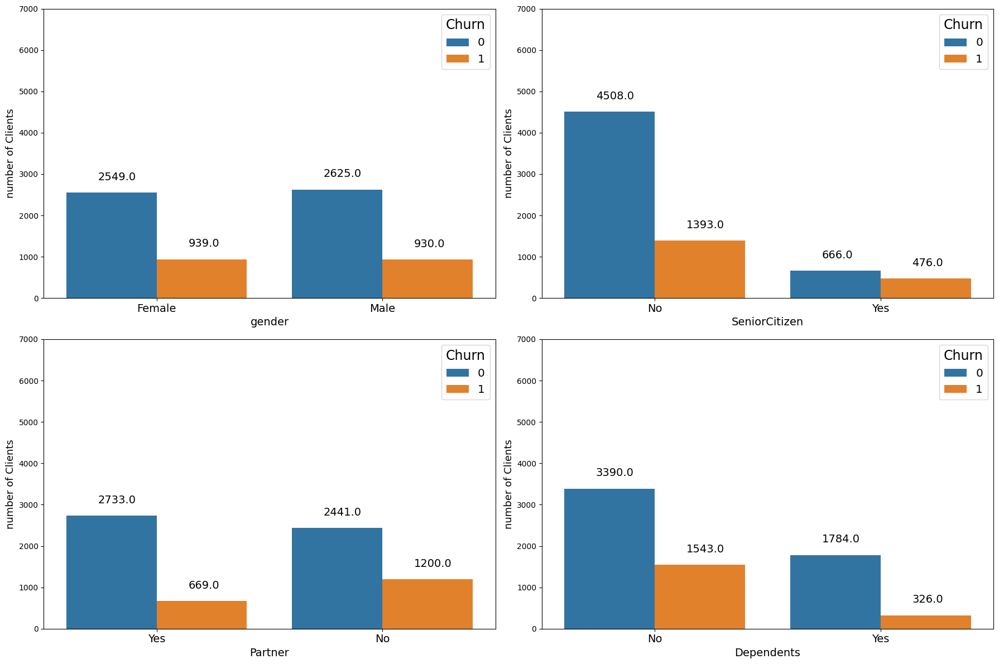

In [ ]:
plt.figure(figsize=(18,12))

for i,col in enumerate(demo_features):
    plt.subplot(2,2,i + 1)

    ax = sns.countplot(data = df, x = col, hue="Churn")

    plt.xlabel(col, fontsize= 14)
    plt.ylabel("number of Clients", fontsize= 13)
    plt.ylim(0,7000)
    plt.xticks(fontsize= 14)

    plt.legend(title = 'Churn', fontsize='x-large', title_fontsize='17')

# the following loop adds annotations to the bars in the bar plot. The annotations show the height of each bar (i.e., the count of clients for each category of the feature).
    for p in ax.patches:
        height = p.get_height()
        if height > 0:  # Only annotate if height is greater than 0
            ax.annotate(height, (p.get_x()+0.14, height+300), fontsize= 14)

plt.tight_layout()

plt.show()


*about the plot :*  
it represents the count of clients for different categories within four demographic features: ‘gender’, ‘SeniorCitizen’, ‘Partner’, and ‘Dependents’. Each bar is split into two colors, blue and orange, representing the ‘Churn’ status of the clients. Blue indicates clients who did not churn, and orange indicates clients who did churn.

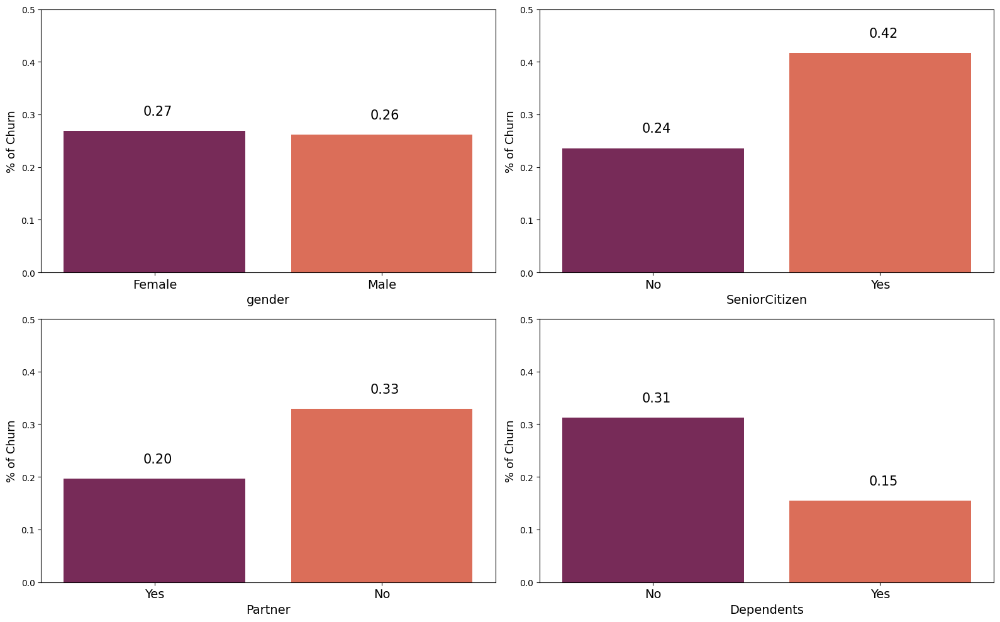

In [ ]:
plt.figure(figsize=(16,10))

for i,col in enumerate(demo_features):
    plt.subplot(2,2,i + 1)

    ax = sns.barplot(x = col, y = "Churn", data = df,palette = 'rocket', ci = None) # to dont display this statistical information

    plt.xlabel(col, fontsize= 14)
    plt.ylabel("% of Churn", fontsize= 13)
    plt.ylim(0,0.5)
    plt.xticks(fontsize= 14)

    for p in ax.patches:
        ax.annotate("%.2f" %(p.get_height()), (p.get_x()+0.35, p.get_height()+0.03),fontsize=15)
# The annotations show the height of each bar (i.e., the percentage of churn for each category of the feature) with a precision of two decimal places.

plt.tight_layout()

plt.show()

creating a 2x2 grid of bar plots showing the percentage of churn across different categories for each of the demographic features. The y-axis limits are from 0 to 0.5, and the percentage of churn for each category is annotated on the bar itself.

What we can observe for each feature:
- Gender: There is barely any difference in churn percentage between men and women;
- Senior Citizen: The churn percentage for senior customers are above 40%, indicating a high likelihood of churn from that group;
- Partner: Single customers are more likely to churn than customers with partners;
- Dependents: Customers with dependents are less likely to churn than customers without any dependents.

We could combine the two ‘family-related’ features, ‘Partner’ and ‘Dependents’ to see if, in fact, both of them contribute to the chance of customer churn or retention.

It is expected that the majority of customers with dependents are married and, for instance, it could be that the partnership has more influence on the target than the fact that a customer has or hasn’t a child.  Although this might be unlikely, by analyzing both features together, we can discard such hypothesis with more confidence.

In [ ]:
df.groupby(['Partner'])['Dependents'].value_counts()

Partner  Dependents
No       No            3280
         Yes            361
Yes      Yes           1749
         No            1653
Name: count, dtype: int64

As expected, most customers with dependents also have a partner. Yet, the number of single customers with dependents seems significant enough for us to draw some conclusions about this particular group.

In [ ]:
#  for a better understanding for the relationship between these variables and the ‘Churn’ variable.
# find the proportion of ‘Churn’ values for each unique combination of ‘Partner’ and ‘Dependents’ values
df.groupby(by=['Partner', 'Dependents'])['Churn'].value_counts(normalize = True)

Partner  Dependents  Churn
No       No          0        0.657622
                     1        0.342378
         Yes         0        0.786704
                     1        0.213296
Yes      No          0        0.745917
                     1        0.254083
         Yes         0        0.857633
                     1        0.142367
Name: proportion, dtype: float64

##### **2. Services related features**

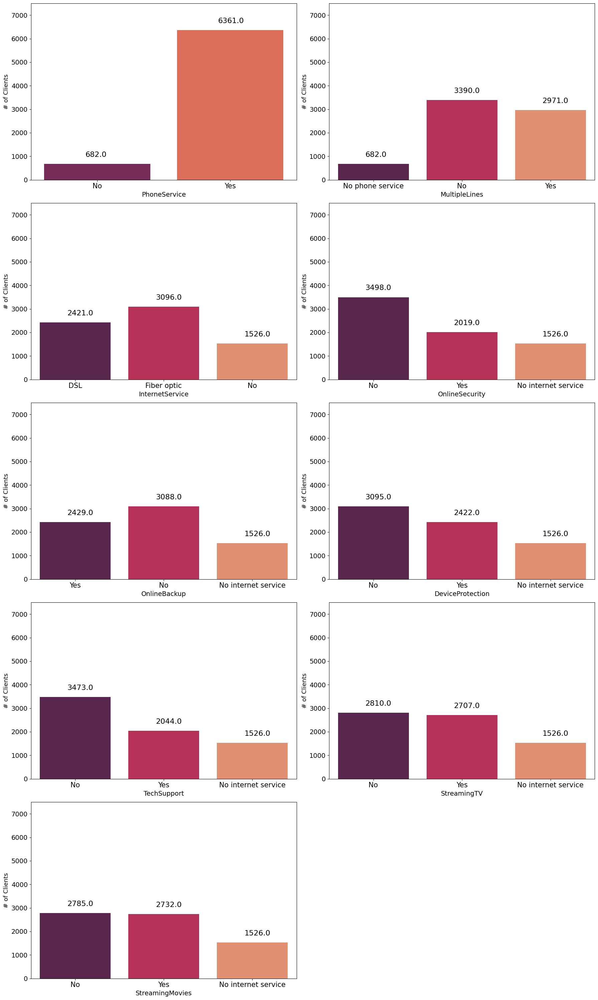

In [ ]:
plt.figure(figsize=(18,30))

for i,col in enumerate(serv_features):
    plt.subplot(5,2,i + 1)

    ax = sns.countplot(data = df, x = col, palette = 'rocket')

    plt.xlabel(col, fontsize= 14)
    plt.ylabel("# of Clients", fontsize= 13)
    plt.ylim(0,7500)
    plt.xticks(fontsize= 15)
    plt.yticks(fontsize= 14)

    for p in ax.patches:
        ax.annotate((p.get_height()), (p.get_x()+0.31, p.get_height()+300), fontsize= 16)

plt.tight_layout()

plt.show()

create a set of bar plots for each of the service features (serv_features).
show the distribution of clients across different categories for each of the service features('**PhoneService**', '**MultipleLines**', '**InternetService**', '**OnlineSecurity**', '**OnlineBackup**','**DeviceProtection**', '**TechSupport**', '**StreamingTV**', '**StreamingMovies**')

A relatively small group of customers doesn’t have **internet services** and an even smaller one doesn’t have **phone services**. Most services can be and/or are only provided to customers who sign the Telco’s internet service.

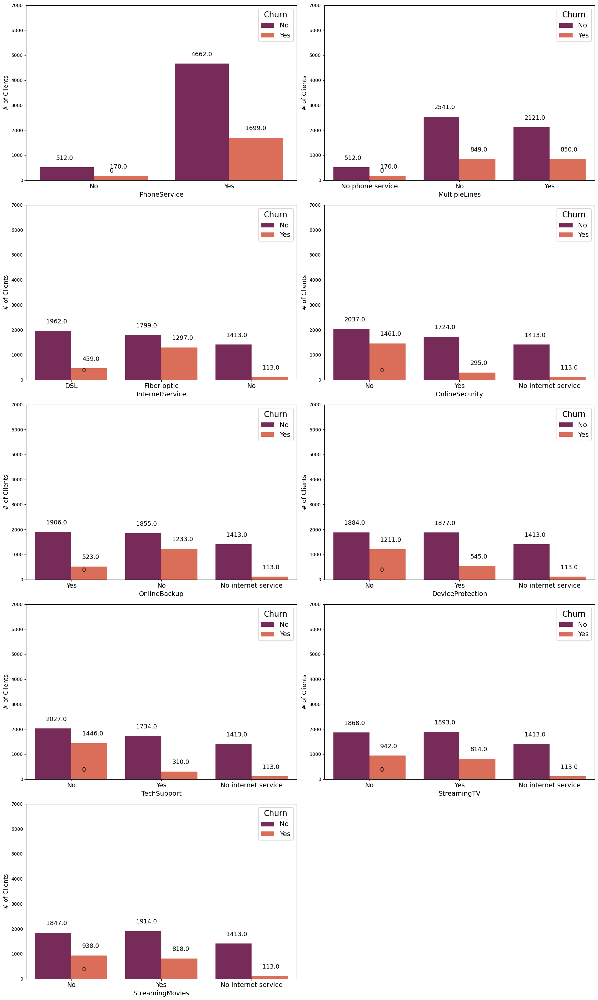

In [ ]:
plt.figure(figsize=(18,30))

for i,col in enumerate(serv_features):
    plt.subplot(5,2,i + 1)

    ax = sns.countplot(data = df, x = col, hue="Churn", palette = 'rocket')

    plt.xlabel(col, fontsize= 14)
    plt.ylabel("# of Clients", fontsize= 13)
    plt.ylim(0,7000)
    plt.xticks(fontsize= 14)

    plt.legend(title = 'Churn', fontsize='x-large', title_fontsize='17')

    for p in ax.patches:
        ax.annotate((p.get_height()), (p.get_x()+0.12, p.get_height()+300), fontsize= 13)

plt.tight_layout()

plt.show()

creating a set of bar plots for each of the service features (serv_features), with the bars split by the ‘Churn’ column.

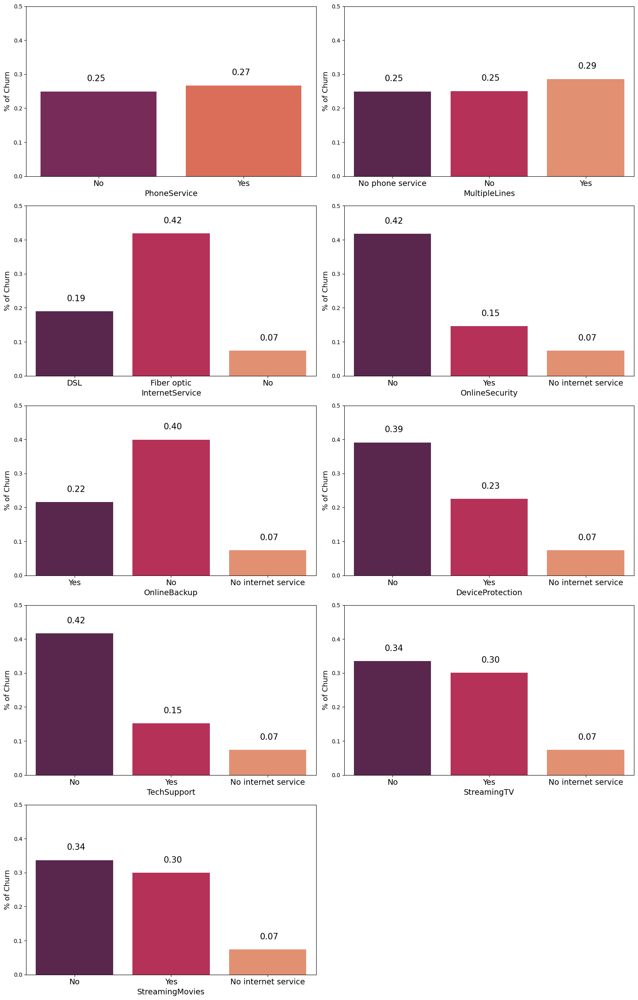

In [ ]:
plt.figure(figsize=(16,25))

for i,col in enumerate(serv_features):
    plt.subplot(5,2,i + 1)

    ax = sns.barplot(x = col, y = "Churn", data = df, palette = 'rocket', ci = None)

    plt.xlabel(col, fontsize= 14)
    plt.ylabel("% of Churn", fontsize= 13)
    plt.ylim(0,0.5)
    plt.xticks(fontsize= 14)

    for p in ax.patches:
        ax.annotate("%.2f" %(p.get_height()), (p.get_x()+0.32, p.get_height()+0.03),fontsize=15)

plt.tight_layout()

plt.show()

 creating a set of bar plots for each of the service features (serv_features), with the percentage of churn as the y-axis.

In the feature **‘InternetServices’**, the percentage of churn in each category is highly different one from another. Those who don’t subscribe to the company’s internet (presumably, they only use their phone service), are the most likely to endure as their customers. The likelihood of churn from customers with DSL service is also smaller than the overall probability.

The highest percentage of churn, with over 40%, is from customers with fiber optic internet. Fiber optic tends to be faster than DSL internet, but their subscription is usually more expensive as well. We don't have the information about the fee for each service, but at least we can find the mean value of monthly charges per type of internet just to have an idea that this is the case.


In [ ]:
df.groupby(by=['InternetService'])['MonthlyCharges'].mean().sort_values()

InternetService
No             21.079194
DSL            58.102169
Fiber optic    91.500129
Name: MonthlyCharges, dtype: float64

this gives the average monthly charge for each type of internet service

As expected, the average charges for each service are significantly different, with fiber optic been the most expensive. Without any additional information, it’s hard to draw definitive conclusions, but it seems that the cost-benefit relationship of their fiber optic service is far from been attractive enough to retain customers.

Such a high churn rate might indicate that their service’s quality is subpar in terms of speed and/or reliability.

As for the other services, the likelihood of churn from customers who have each one of them is actually lower than from those who haven’t. The higher differences are found in **‘TechSupport’** and **‘OnlineSecurity’**, while the lower ones are found in the **streaming services**.

Let’s calculate the average monthly charges from each category in the *Tech Support*  **and**  *Online Security* features.

In [ ]:
print(df.groupby(by=['TechSupport'])['MonthlyCharges'].mean().sort_values(), '\n')
print(df.groupby(by=['OnlineSecurity'])['MonthlyCharges'].mean().sort_values(), '\n')
print(df.groupby(by=['OnlineSecurity', 'TechSupport'])['MonthlyCharges'].mean().sort_values())

TechSupport
No internet service    21.079194
No                     74.586683
Yes                    80.680137
Name: MonthlyCharges, dtype: float64 

OnlineSecurity
No internet service    21.079194
No                     75.693067
Yes                    78.838732
Name: MonthlyCharges, dtype: float64 

OnlineSecurity       TechSupport        
No internet service  No internet service    21.079194
No                   No                     74.188367
Yes                  No                     75.692011
No                   Yes                    79.758148
Yes                  Yes                    81.472930
Name: MonthlyCharges, dtype: float64


above we're seeing the average monthly charges for different categories within the **‘TechSupport’**, **‘OnlineSecurity’**, and both ‘OnlineSecurity’ and ‘TechSupport’ features.

Analyzing the average monthly charges for both ‘OnlineSecurity’ and ‘TechSupport’ features together allows us to understand the combined effect of these two services on the monthly charges.
Each unique combination of ‘OnlineSecurity’ and ‘TechSupport’ (for instance, having both services, having only one of them, or having neither) can have a different impact on the monthly charges. By grouping the data this way, we can see if there are any noticeable trends or patterns.

#### result:
Both services don’t seem to affect the subscription charges by much.

( can add )  ...

Let’s see if the churn rate gets significantly lower for customers who have access to both services.

In [ ]:
#count of each unique ‘OnlineSecurity’ value for each unique ‘TechSupport’ value

print(df.groupby(by=['TechSupport'])['OnlineSecurity'].value_counts(), '\n')

TechSupport          OnlineSecurity     
No                   No                     2553
                     Yes                     920
No internet service  No internet service    1526
Yes                  Yes                    1099
                     No                      945
Name: count, dtype: int64 



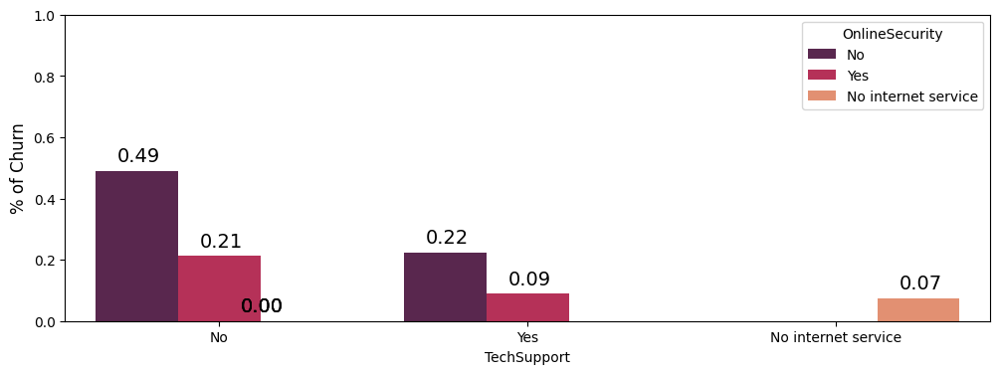

In [ ]:
# create a bar plot that shows the percentage of churn for each category of the ‘TechSupport’ feature , split by the ‘OnlineSecurity’.
plt.figure(figsize=(12,4))

ax = sns.barplot(x = "TechSupport", y = "Churn", hue = "OnlineSecurity", data = df, palette = 'rocket', ci = None)

plt.ylabel("% of Churn", fontsize= 12)
plt.ylim(0,1.0)

for p in ax.patches:
    ax.annotate("%.2f" %(p.get_height()), (p.get_x()+0.070, p.get_height()+0.03),fontsize=14)

plt.show()

The differences in terms of churn rate are quite significant. While customers who don’t use neither of those services have a close to 50% chance of churn, the churn rate for those who have both is lower than 10%, supporting the previous point.

##### **3. Account information related features (categorical)**




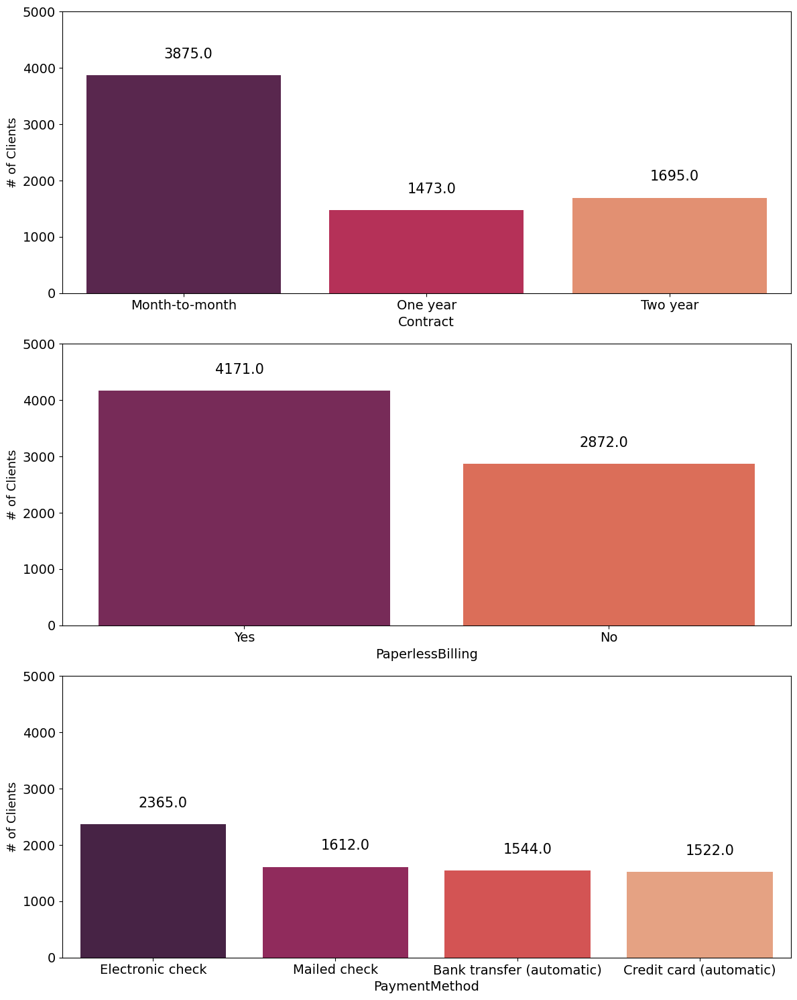

In [ ]:
plt.figure(figsize=(12,15))

for i,col in enumerate(cat_accinfo_features):
    plt.subplot(3,1,i + 1)

    ax = sns.countplot(data = df, x = col, palette = 'rocket')

    plt.xlabel(col, fontsize= 14)
    plt.ylabel("# of Clients", fontsize= 13)
    plt.ylim(0,5000)
    plt.xticks(fontsize= 14)
    plt.yticks(fontsize= 14)

    for p in ax.patches:
        ax.annotate((p.get_height()), (p.get_x()+0.32, p.get_height()+300), fontsize= 15)

plt.tight_layout()

plt.show()

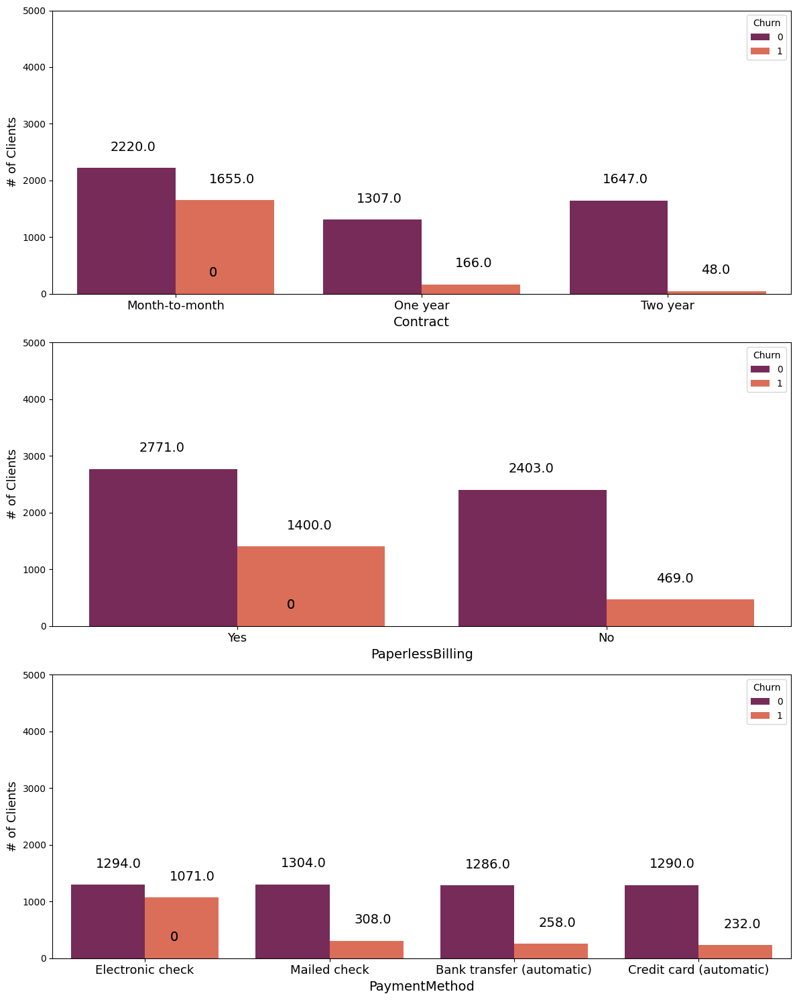

In [ ]:
plt.figure(figsize=(12,15))

for i,col in enumerate(cat_accinfo_features):
    plt.subplot(3,1,i + 1)

    ax = sns.countplot(data = df, x = col, hue="Churn", palette = 'rocket')

    plt.xlabel(col, fontsize= 14)
    plt.ylabel("# of Clients", fontsize= 13)
    plt.ylim(0,5000)
    plt.xticks(fontsize= 13)

    for p in ax.patches:
        ax.annotate((p.get_height()), (p.get_x()+0.135, p.get_height()+300), fontsize= 14)

plt.tight_layout()

plt.show()

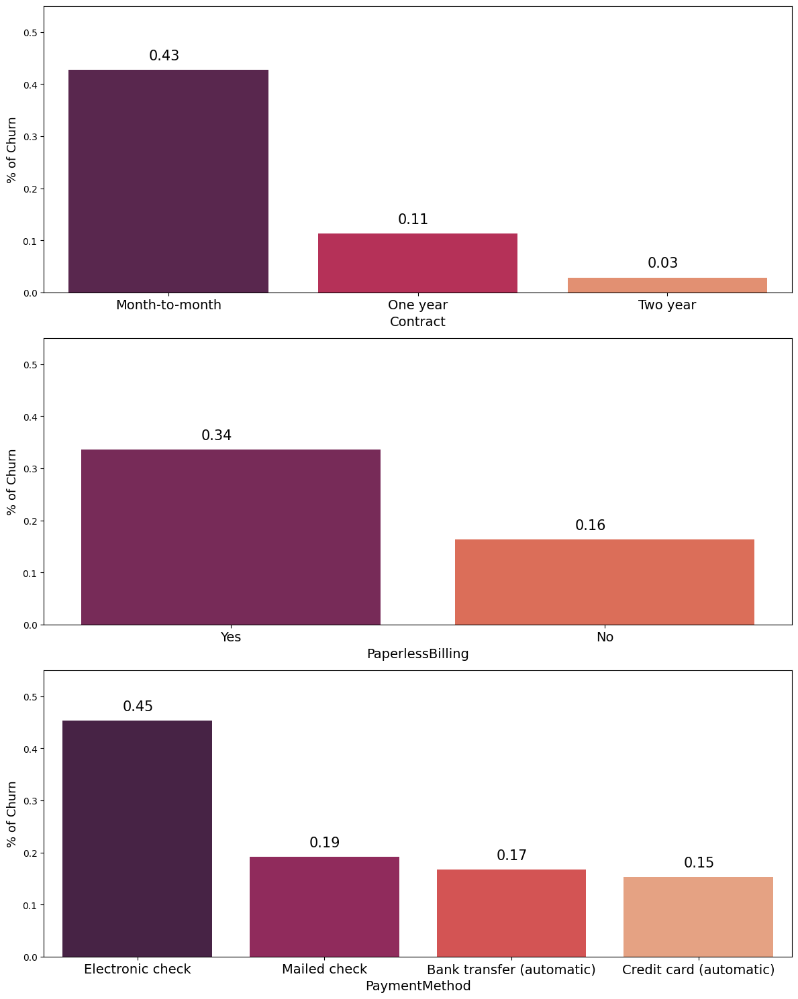

In [ ]:
plt.figure(figsize=(12,15))

for i,col in enumerate(cat_accinfo_features):
    plt.subplot(3,1,i + 1)

    ax = sns.barplot(x = col, y = "Churn", data = df, palette = 'rocket', ci = None)

    plt.xlabel(col, fontsize= 14)
    plt.ylabel("% of Churn", fontsize= 13)
    plt.ylim(0,0.55)
    plt.xticks(fontsize= 14)

    for p in ax.patches:
        ax.annotate("%.2f" %(p.get_height()), (p.get_x()+0.32, p.get_height()+0.02),fontsize=15)

plt.tight_layout()

plt.show()

in terms of contract, the highest churn rate is from the ‘month-to-month’ type, which is also the most dominant contract. What seems odd is the high chance of churn from customers who choose electronic check as payment method and opts for paperless billing. It could be, for instance, that most customers in the month-to-month contract also fall into those categories. We can check that.

In [ ]:
print(df.groupby(by=['Contract'])['PaperlessBilling'].value_counts(normalize = True),' \n')
print(df.groupby(by=['Contract'])['PaymentMethod'].value_counts(normalize = True))

Contract        PaperlessBilling
Month-to-month  Yes                 0.667355
                No                  0.332645
One year        Yes                 0.543109
                No                  0.456891
Two year        No                  0.536873
                Yes                 0.463127
Name: proportion, dtype: float64  

Contract        PaymentMethod            
Month-to-month  Electronic check             0.477419
                Mailed check                 0.230452
                Bank transfer (automatic)    0.152000
                Credit card (automatic)      0.140129
One year        Credit card (automatic)      0.270197
                Bank transfer (automatic)    0.265445
                Electronic check             0.235574
                Mailed check                 0.228785
Two year        Credit card (automatic)      0.342773
                Bank transfer (automatic)    0.332743
                Mailed check                 0.225369
                Electroni

When we group the dataset by contract, we can see that the percentage of customers who don’t receive their bills through the mail and that pay them via electronic check is higher for the ‘month-to-month’ type. Yet, this doesn’t seem to be enough to justify such a high churn rate for those categories. There is a good chance that we will find higher percentages of churn in them, regardless of the type of contract. Let’s see.

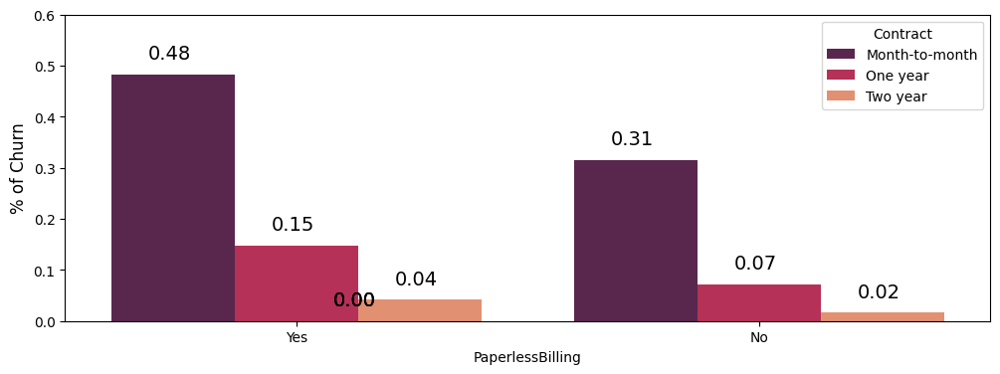

In [ ]:
plt.figure(figsize=(12,4))

ax = sns.barplot(x = "PaperlessBilling", y = "Churn", hue = "Contract", data = df, palette = 'rocket', ci = None)

plt.ylabel("% of Churn", fontsize= 12)
plt.ylim(0,0.6)

for p in ax.patches:
    ax.annotate("%.2f" %(p.get_height()), (p.get_x()+0.08, p.get_height()+0.03),fontsize=14)

plt.show()

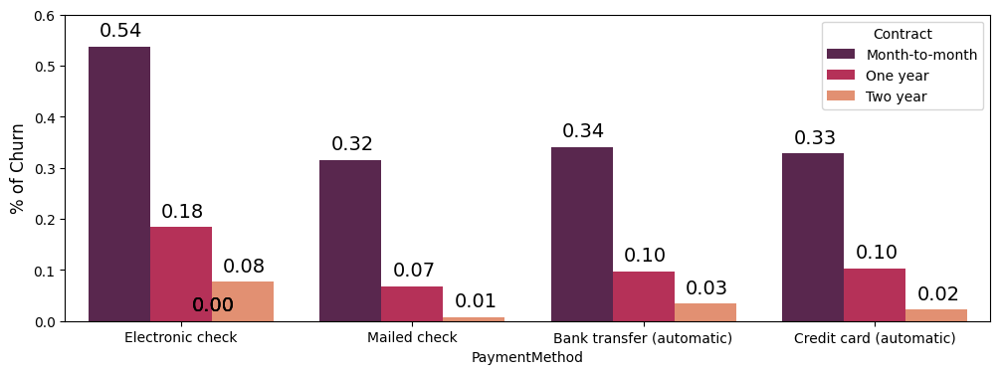

In [ ]:
plt.figure(figsize=(12,4))

ax = sns.barplot(x = "PaymentMethod", y = "Churn", hue = "Contract", data = df, palette = 'rocket', ci = None)

plt.ylabel("% of Churn", fontsize= 12)
plt.ylim(0,0.6)

for p in ax.patches:
    ax.annotate("%.2f" %(p.get_height()), (p.get_x()+0.05, p.get_height()+0.020),fontsize=14)

plt.show()

The likelihood of churn is, in fact, higher for those categories, regardless of type of contract. it is hard for me to see a causality, without additional information or domain knowledge, between the churn rate and the way someone receives their bill and choose to pay them. It is more likely that those two features are associated with several others. The internet service, a feature with notable differences of churn rate between each one of its categories, could present some correlation between them.

In [ ]:
print(df.groupby(by=['InternetService'])['PaperlessBilling'].value_counts(normalize = True), '\n')
print(df.groupby(by=['InternetService'])['PaymentMethod'].value_counts(normalize = True))

InternetService  PaperlessBilling
DSL              Yes                 0.549360
                 No                  0.450640
Fiber optic      Yes                 0.773579
                 No                  0.226421
No               No                  0.707733
                 Yes                 0.292267
Name: proportion, dtype: float64 

InternetService  PaymentMethod            
DSL              Electronic check             0.267658
                 Mailed check                 0.253201
                 Credit card (automatic)      0.245353
                 Bank transfer (automatic)    0.233788
Fiber optic      Electronic check             0.515181
                 Bank transfer (automatic)    0.208656
                 Credit card (automatic)      0.192829
                 Mailed check                 0.083333
No               Mailed check                 0.485583
                 Bank transfer (automatic)    0.217562
                 Credit card (automatic)      0.216907
       

What stands out here in our grouping operations:
- Customers with Internet Service = ‘No’: Less than 30% receive paperless bills and only 8% pay them with electronic check;
- Customers with Internet Service = ‘Fiber Optic’: 77% receive paperless bills and more them 51% pay them with electronic check.

We can recall that the lowest churn rate in the internet services feature is from those customers who don’t use Telco’s internet, while the highest is found among those who use their fiber optic internet. So, we can say that those results don’t come out as a surprise.

Although we shouldn’t conclude that the payment method or the way the bills are sent have a direct influence in the customer retainment, it is worth to point that those features will probably be useful for our prediction models.

##### **3. Account information related features (numerical)**




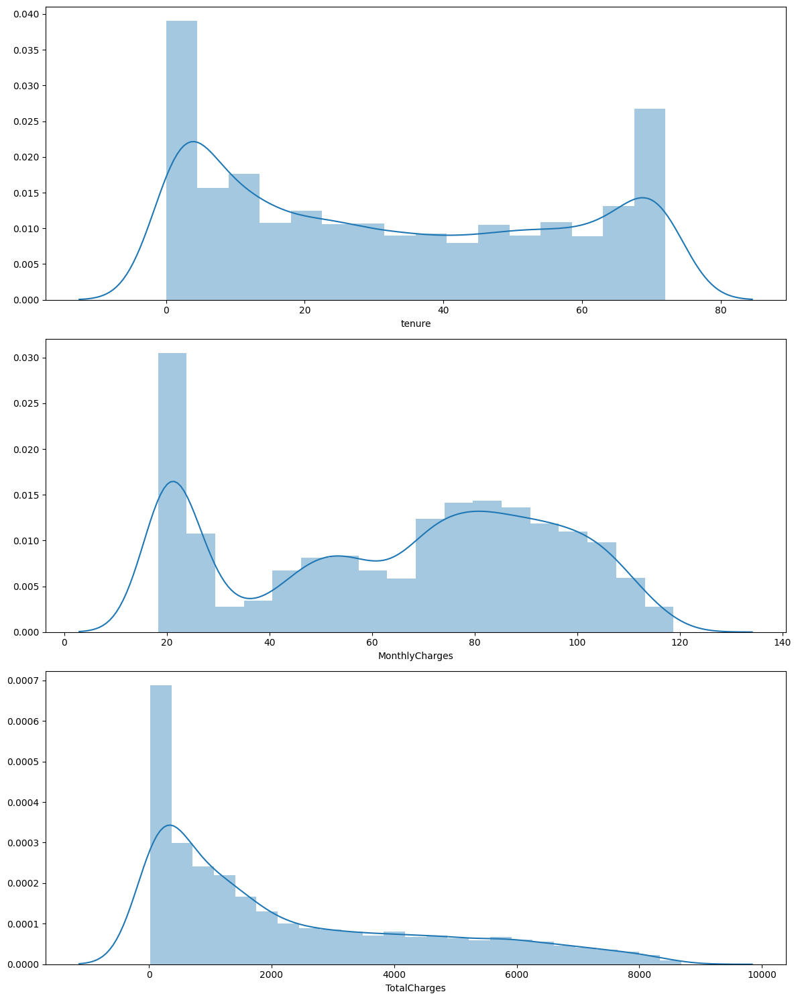

In [ ]:
plt.figure(figsize=(12,15))

for i,col in enumerate(num_accinfo_features):
    plt.subplot(3,1,i + 1)
    sns.distplot(df.loc[:,col])
    plt.ylabel('')
    plt.tight_layout()

plt.show()

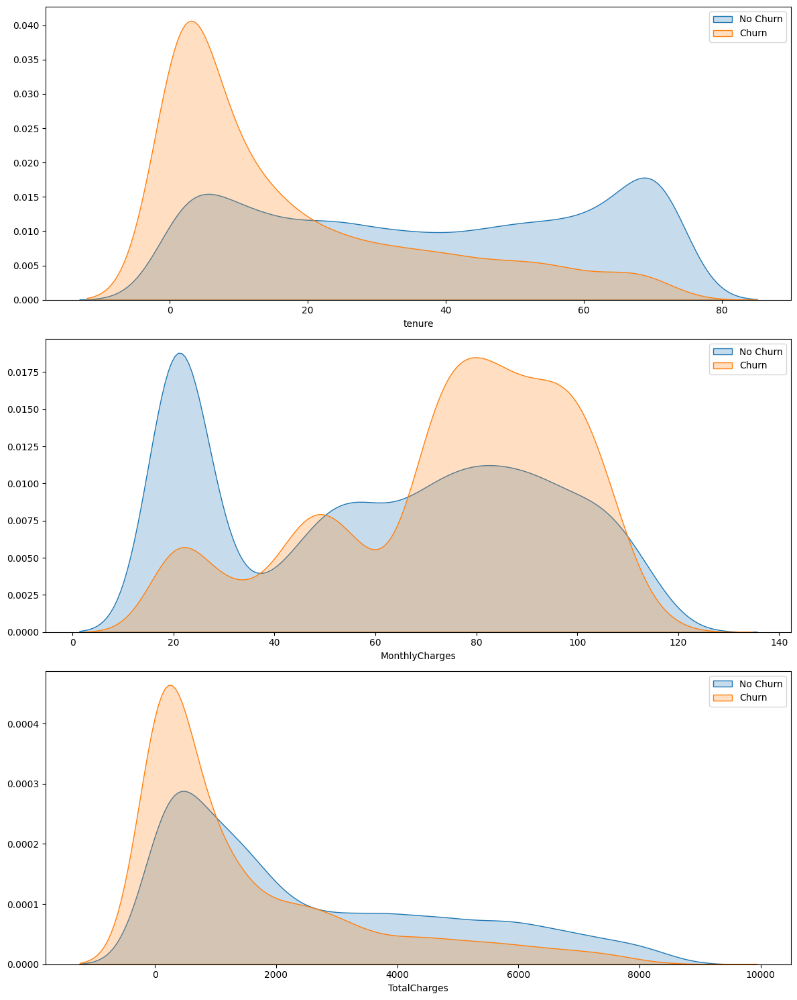

In [ ]:
plt.figure(figsize=(12,15))

for i,col in enumerate(num_accinfo_features):
    plt.subplot(3,1,i + 1)
    sns.kdeplot(df.loc[(df['Churn'] == 0), col], label = 'No Churn', shade = True)
    sns.kdeplot(df.loc[(df['Churn'] == 1), col], label = 'Churn', shade = True)
    plt.legend()
    plt.ylabel('')
    plt.tight_layout()

plt.show()

What we can observe for each feature:
- Tenure: High concentration of churned customer in the first months.
- Monthly Charges: High concentration of churned customer in higher values (around 60 and beyond)
- Total Charges: Somewhat similar distributions, but the ‘No churn’ distribution have lower values.

Let’s get the mean values to complement our analysis.

In [ ]:
print(df.groupby(by=['Churn'])['tenure'].mean().sort_values(), '\n')
print(df.groupby(by=['Churn'])['MonthlyCharges'].mean().sort_values(), '\n')
print(df.groupby(by=['Churn'])['TotalCharges'].mean().sort_values())

Churn
1    17.979133
0    37.569965
Name: tenure, dtype: float64 

Churn
0    61.265124
1    74.441332
Name: MonthlyCharges, dtype: float64 

Churn
1    1531.796094
0    2555.344141
Name: TotalCharges, dtype: float64


As expected, the average tenure period for churned customers is lower and the average monthly charges are higher than the same metrics for retained customers. The average total charges are lower for churned customers, which is probably due to their lower tenure.

The density plot for churned customers in the ‘tenure’ feature showed a high concentration in the first months. Let’s divide this feature in bins to get the churn rate per year of service.

In [ ]:
df['tenure_bin'] = pd.cut(df['tenure'],[-1,12,24,36,48,60,100])
df['tenure_bin'].value_counts(sort = False)

tenure_bin
(-1, 12]     2186
(12, 24]     1024
(24, 36]      832
(36, 48]      762
(48, 60]      832
(60, 100]    1407
Name: count, dtype: int64

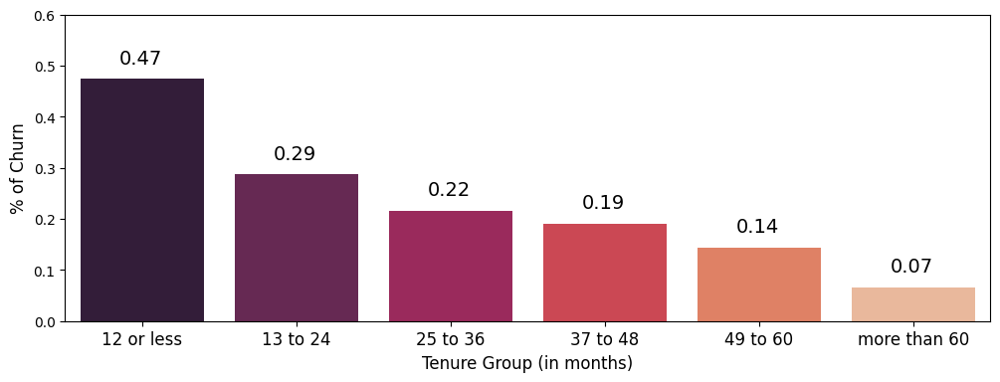

In [ ]:
plt.figure(figsize=(12,4))

ax = sns.barplot(x = "tenure_bin", y = "Churn", data = df, palette = 'rocket', ci = None)

plt.ylabel("% of Churn", fontsize= 12)
plt.ylim(0,0.6)
plt.xticks([0,1,2,3,4,5], ['12 or less', '13 to 24', '25 to 36', '37 to 48', '49 to 60', 'more than 60'], fontsize = 12)
plt.xlabel("Tenure Group (in months)", fontsize= 12)



for p in ax.patches:
    ax.annotate("%.2f" %(p.get_height()), (p.get_x()+0.25, p.get_height()+0.03),fontsize=14)

plt.show()

Almost 50 percent of those who became a customer for a year or less ended up leaving the company. It’s not unusual to have a higher churn rate in the first year or two for some types of business. Nevertheless, a churn rate this high in the first year indicates that the quality of the service provided fails to hold up to their new customers’ expectation.

### Additional Features

In [8]:
df['sum_of_months'] = (df['TotalCharges'] // df['MonthlyCharges']).astype(int)

In [ ]:
df['sum_of_months'].unique()

array([ 1, 33,  2, 43,  8, 21, 10, 29, 62, 11, 17, 56, 48, 25, 69, 49,  9,
       20, 58, 27, 47, 70, 16, 28, 72,  4, 60, 12, 46, 52, 66, 42, 14,  7,
       59, 18, 63, 65, 35, 73,  3, 31, 53, 55,  6, 41, 51, 68, 71,  5, 37,
       30, 54, 36, 40, 34, 64, 23, 15, 13, 19, 32, 44, 74, 61, 24, 26, 75,
       22, 50, 77, 38, 57, 67, 45,  0, 39, 76, 79])

In [9]:
services = ['PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'StreamingMovies',
            'OnlineBackup', 'DeviceProtection','TechSupport', 'StreamingTV', 'PaperlessBilling']

data_services = df.copy()

data_services[services] = data_services[services].replace({'No': 0,
                                                           'Yes': 1,
                                                           'No phone service': 0,
                                                           'Fiber optic': 1,
                                                           'DSL': 1,
                                                           'No internet service': 0})

df['sum_of_services'] = data_services[services].sum(axis=1)

In [ ]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,sum_of_months,sum_of_services
0,7590-VHVEG,Female,No,Yes,No,1,No,No phone service,DSL,No,...,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,1,3
1,5575-GNVDE,Male,No,No,No,34,Yes,No,DSL,Yes,...,No,No,One year,No,Mailed check,56.95,1889.50,No,33,4
2,3668-QPYBK,Male,No,No,No,2,Yes,No,DSL,Yes,...,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,2,5
3,7795-CFOCW,Male,No,No,No,45,No,No phone service,DSL,Yes,...,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No,43,4
4,9237-HQITU,Female,No,No,No,2,Yes,No,Fiber optic,No,...,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,2,3


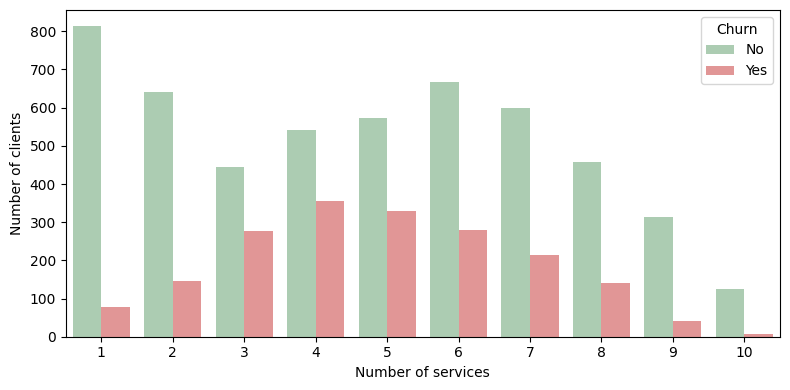

In [ ]:
plt.figure(figsize=[8, 4])

sns.countplot(data=df,
              x='sum_of_services',
              hue='Churn',
              palette=['#a7d1ae', '#ed8a8a'])
plt.xlabel('Number of services')
plt.ylabel('Number of clients')

plt.tight_layout()
plt.show()

Clients who have about 3-6 services most often churn.

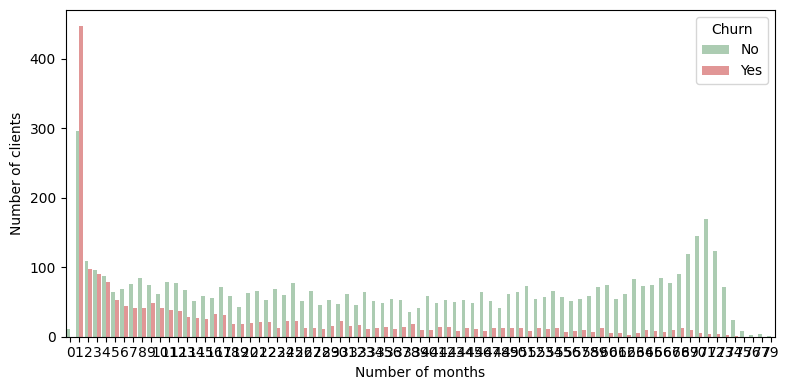

In [ ]:
plt.figure(figsize=[8, 4])

sns.countplot(data=df,
              x='sum_of_months',
              hue='Churn',
              palette=['#a7d1ae', '#ed8a8a'])
plt.xlabel('Number of months')
plt.ylabel('Number of clients')

plt.tight_layout()
plt.show()

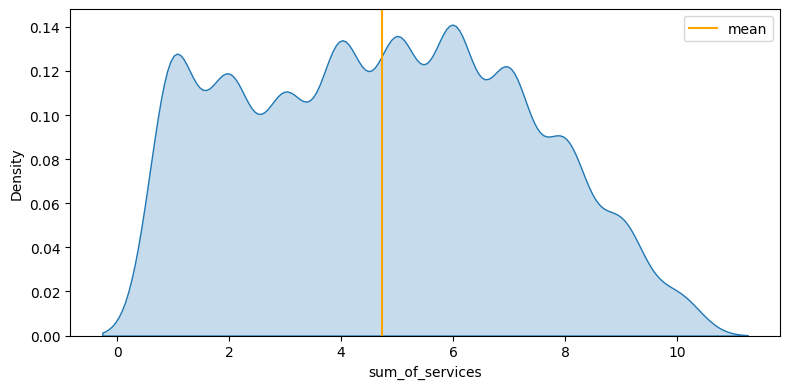

In [ ]:
plt.figure(figsize=[8, 4])

sns.kdeplot(df['sum_of_services'], fill=True)
plt.xlabel('sum_of_services')
plt.ylabel('Density')
plt.axvline(df['sum_of_services'].mean(), label='mean', c='orange')
plt.legend()

plt.tight_layout()
plt.show()

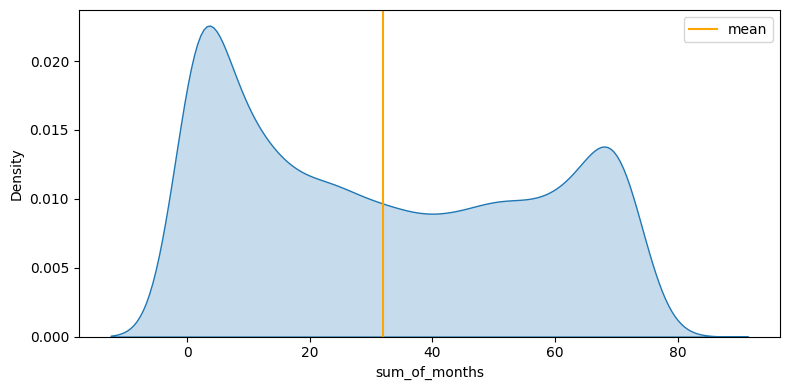

In [ ]:
plt.figure(figsize=[8, 4])

sns.kdeplot(df['sum_of_months'], fill=True)
plt.xlabel('sum_of_months')
plt.ylabel('Density')
plt.axvline(df['sum_of_months'].mean(), label='mean', c='orange')
plt.legend()

plt.tight_layout()
plt.show()

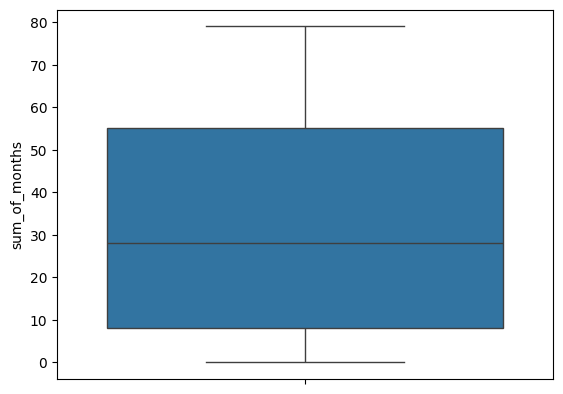

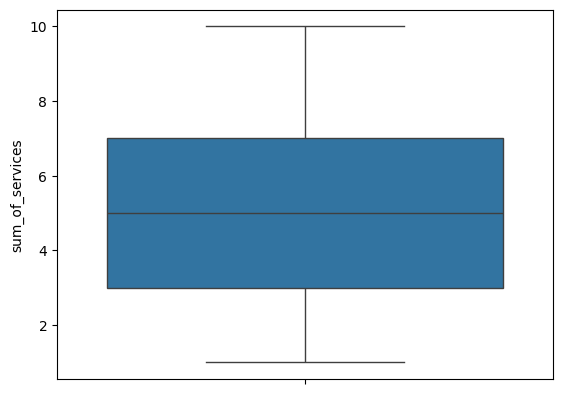

In [ ]:
numerical_cols = ['sum_of_months', 'sum_of_services']
for col in numerical_cols:
    sns.boxplot(y=df[col])
    plt.show()

there is no outliers in new columns

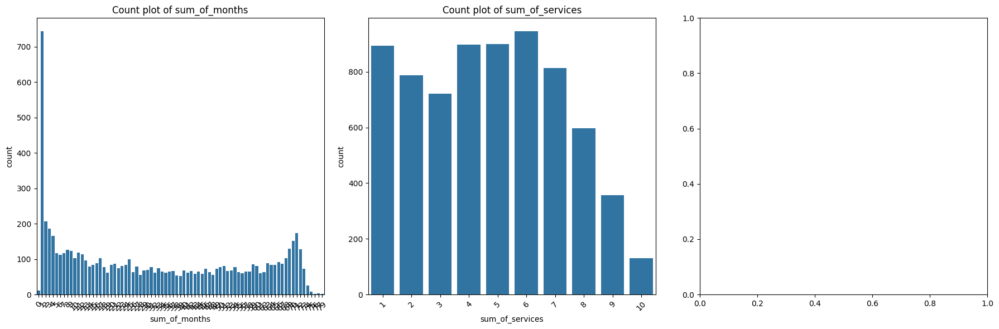

In [ ]:
data_dist = ['sum_of_months', 'sum_of_services']

for i in range(0, len(data_dist), 3):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    for j, col in enumerate(data_dist[i:i+3]):

        sns.countplot(ax=axes[j], x=col, data=df)
        axes[j].set_title(f'Count plot of {col}')
        for tick in axes[j].get_xticklabels():
            tick.set_rotation(45)

    plt.tight_layout()
    plt.show()


### **Feature selection**

In [24]:
#Convering Categorical Data into numeric data
label_encoder = {}
catg_col = df.select_dtypes(include=['object']).columns
for col in catg_col:
    label_encoder[col] = LabelEncoder()
    df[col] = label_encoder[col].fit_transform(df[col])


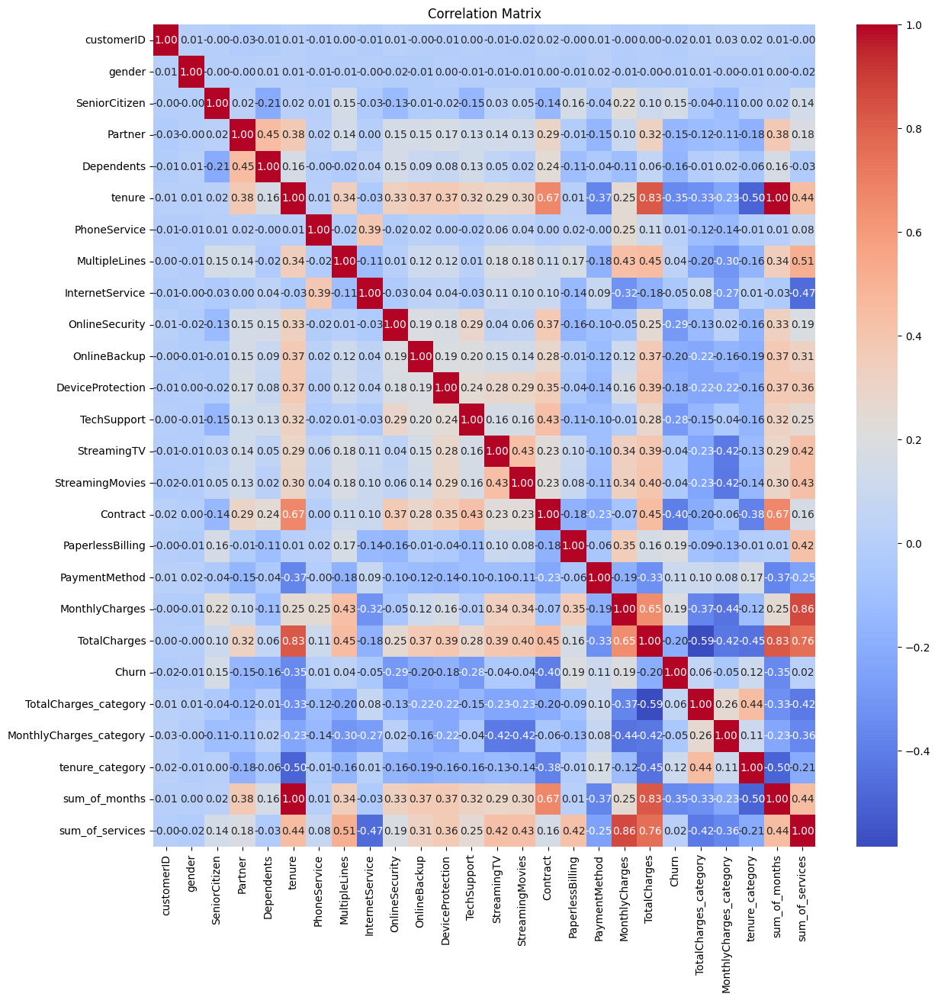

In [ ]:
#correlation between Columns
plt.figure(figsize=(14,14))
cor = df.corr()
sns.heatmap(cor,annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

tenure have strong correlation with TotalCharges
MonthlyCharges have strong correlation with TotalCharges

In [25]:
x = df.drop(columns=['Churn' , 'customerID'])
y = df['Churn']
X_train,X_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=25)

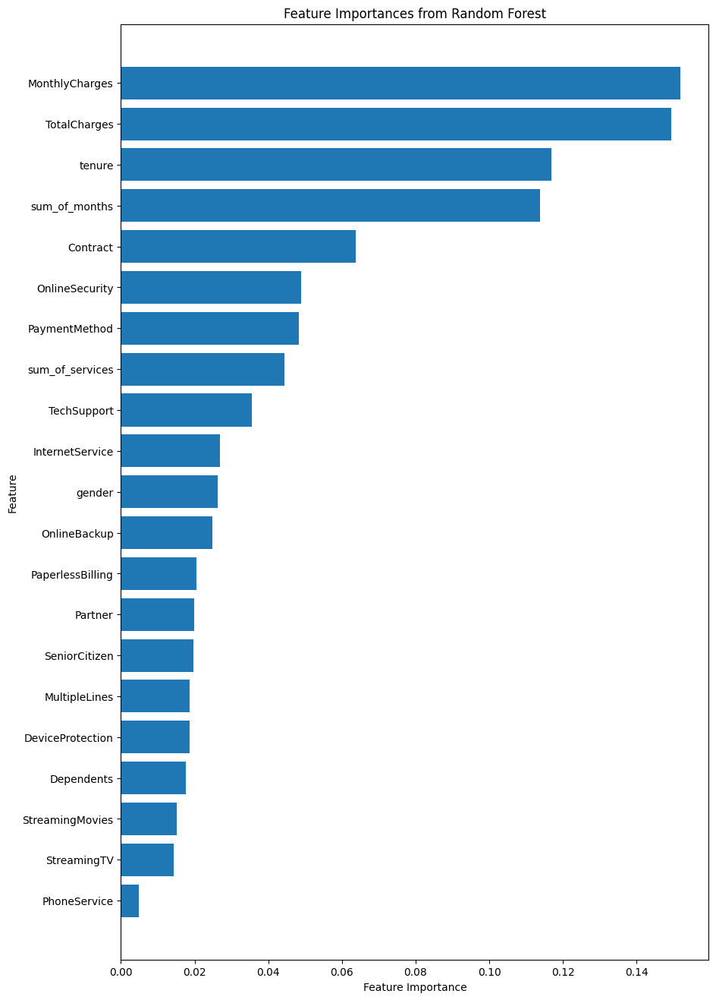

In [26]:
model = RandomForestClassifier(n_estimators=100, random_state=42)

model.fit(X_train, y_train)

importances = model.feature_importances_
feature_names = x.columns

feature_importances = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 16))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Feature Importances from Random Forest')
plt.gca().invert_yaxis()
plt.show()

In [27]:
top_features = feature_importances.nlargest(15, 'Importance')

selected_features = top_features['Feature'].tolist()

print(selected_features)


['MonthlyCharges', 'TotalCharges', 'tenure', 'sum_of_months', 'Contract', 'OnlineSecurity', 'PaymentMethod', 'sum_of_services', 'TechSupport', 'InternetService', 'gender', 'OnlineBackup', 'PaperlessBilling', 'Partner', 'SeniorCitizen']


### Clustering


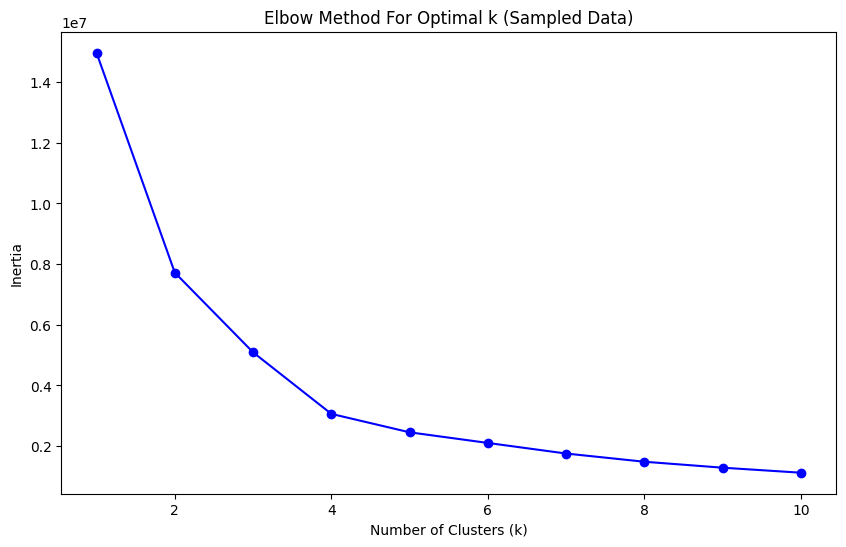

In [68]:
from sklearn.cluster import KMeans

inertia = []
K = range(1, 11)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(K, inertia, 'bo-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k (Sampled Data)')
plt.show()

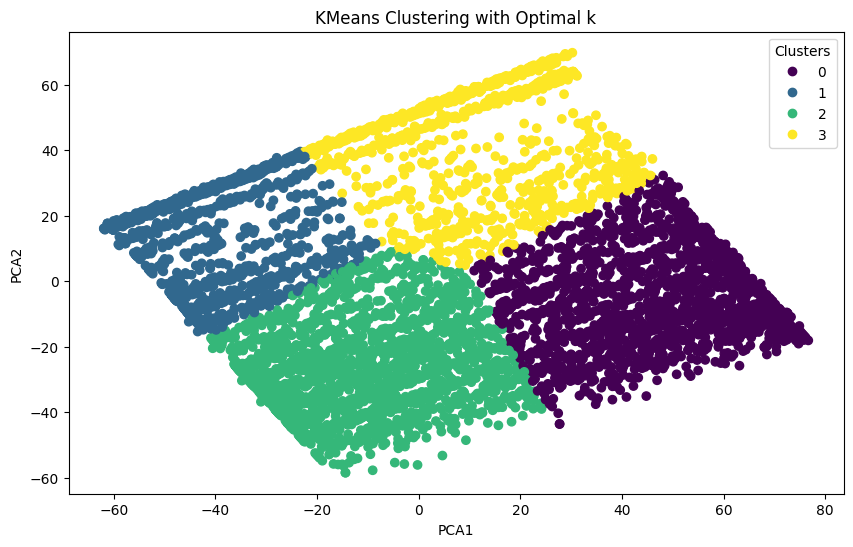

In [69]:
from sklearn.decomposition import PCA

optimal_k = 4  # Replace with the optimal number of clusters determined from the Elbow method
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
df['Cluster'] = kmeans.fit_predict(df)
# Use PCA to reduce the data to 2 dimensions for visualization
pca = PCA(n_components=2)
df_pca = pca.fit_transform(df.drop(columns=['Cluster']))

# Create a DataFrame for the PCA-transformed data
df_pca = pd.DataFrame(df_pca, columns=['PCA1', 'PCA2'])
df_pca['Cluster'] = df['Cluster']

plt.figure(figsize=(10, 6))
scatter = plt.scatter(df_pca['PCA1'], df_pca['PCA2'], c=df_pca['Cluster'], cmap='viridis')
plt.title('KMeans Clustering with Optimal k')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.show()



In [70]:
# Example: Analyze cluster distribution
print(df['Cluster'].value_counts())

Cluster
2    2249
0    1936
1    1708
3    1150
Name: count, dtype: int64


In [71]:
from sklearn.cluster import BisectingKMeans
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.cluster import BisectingKMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

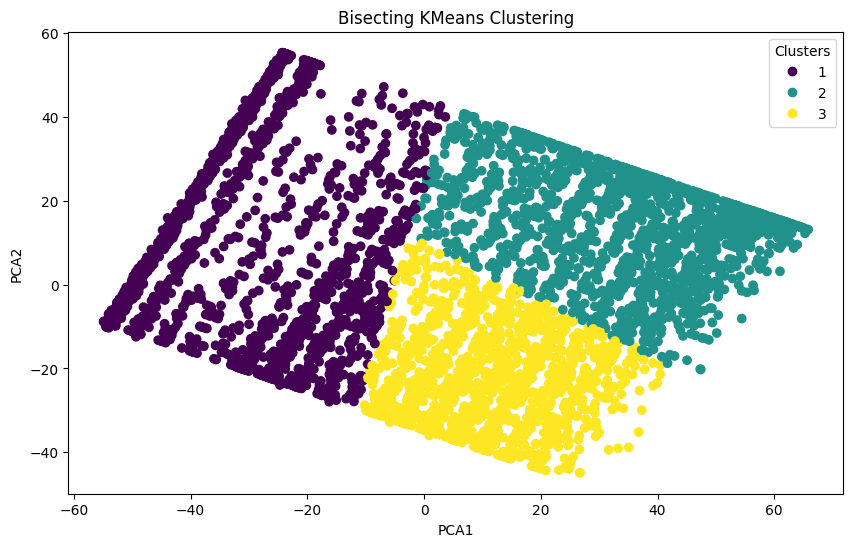

In [ ]:
# Apply BisectingKMeans clustering
bisect_kmeans = BisectingKMeans(n_clusters=3, random_state=0)

X_train, X_test, y_train, y_test = train_test_split(df, target, test_size=0.2, random_state=25)


bisect_kmeans.fit(X_train)
bisect_kmeans_y_pred = pd.Series(bisect_kmeans.predict(X_train)) + 1 

pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train)
X_train_pca_df = pd.DataFrame(X_train_pca, columns=['PCA1', 'PCA2'])
X_train_pca_df['Cluster'] = bisect_kmeans_y_pred

plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_train_pca_df['PCA1'], X_train_pca_df['PCA2'], c=X_train_pca_df['Cluster'], cmap='viridis')
plt.title('Bisecting KMeans Clustering')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.show()


1. K-means + PCAPlot

In [52]:
target=df[['Churn']]
target.head()

,Churn
0,0
1,0
2,1
3,0
4,1


In [53]:
df.drop(['customerID','Churn','TotalCharges'],axis=1,inplace=True)
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,sum_of_months,sum_of_services
0,0,0,1,0,1,0,1,0,0,2,0,0,0,0,0,1,2,29.85,1,3
1,1,0,0,0,34,1,0,0,2,0,2,0,0,0,1,0,3,56.95,33,4
2,1,0,0,0,2,1,0,0,2,2,0,0,0,0,0,1,3,53.85,2,5
3,1,0,0,0,45,0,1,0,2,0,2,2,0,0,1,0,0,42.30,43,4
4,0,0,0,0,2,1,0,1,0,0,0,0,0,0,0,1,2,70.70,2,3


In [55]:
cat_cols=df.select_dtypes(exclude=['int','float']).columns

enc_data=list(cat_cols)
enc_data=enc_data[:-1]
enc_data

['gender',
 'Partner',
 'Dependents',
 'PhoneService',
 'MultipleLines',
 'InternetService',
 'OnlineSecurity',
 'OnlineBackup',
 'DeviceProtection',
 'TechSupport',
 'StreamingTV',
 'StreamingMovies',
 'Contract']

In [57]:
le=LabelEncoder()
df[enc_data]=df[enc_data].apply(lambda col:le.fit_transform(col))
df[enc_data].head()

,gender,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract
0,0,1,0,0,1,0,0,2,0,0,0,0,0
1,1,0,0,1,0,0,2,0,2,0,0,0,1
2,1,0,0,1,0,0,2,2,0,0,0,0,0
3,1,0,0,0,1,0,2,0,2,2,0,0,1
4,0,0,0,1,0,1,0,0,0,0,0,0,0


In [58]:
le=LabelEncoder()
cat_cols=df.select_dtypes(exclude=['int','float']).columns
enc_df=list(cat_cols)
df[enc_data]=df[enc_data].apply(lambda col:le.fit_transform(col))
df[enc_data].head()

,gender,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract
0,0,1,0,0,1,0,0,2,0,0,0,0,0
1,1,0,0,1,0,0,2,0,2,0,0,0,1
2,1,0,0,1,0,0,2,2,0,0,0,0,0
3,1,0,0,0,1,0,2,0,2,2,0,0,1
4,0,0,0,1,0,1,0,0,0,0,0,0,0


2.Heirarchical + PCAPlot

In [59]:
le=LabelEncoder()
cat_cols=df.select_dtypes(exclude=['int','float']).columns
enc_data=list(cat_cols)
df[enc_data]=df[enc_data].apply(lambda col:le.fit_transform(col))
df[enc_data].head()

""
0
1
2
3
4


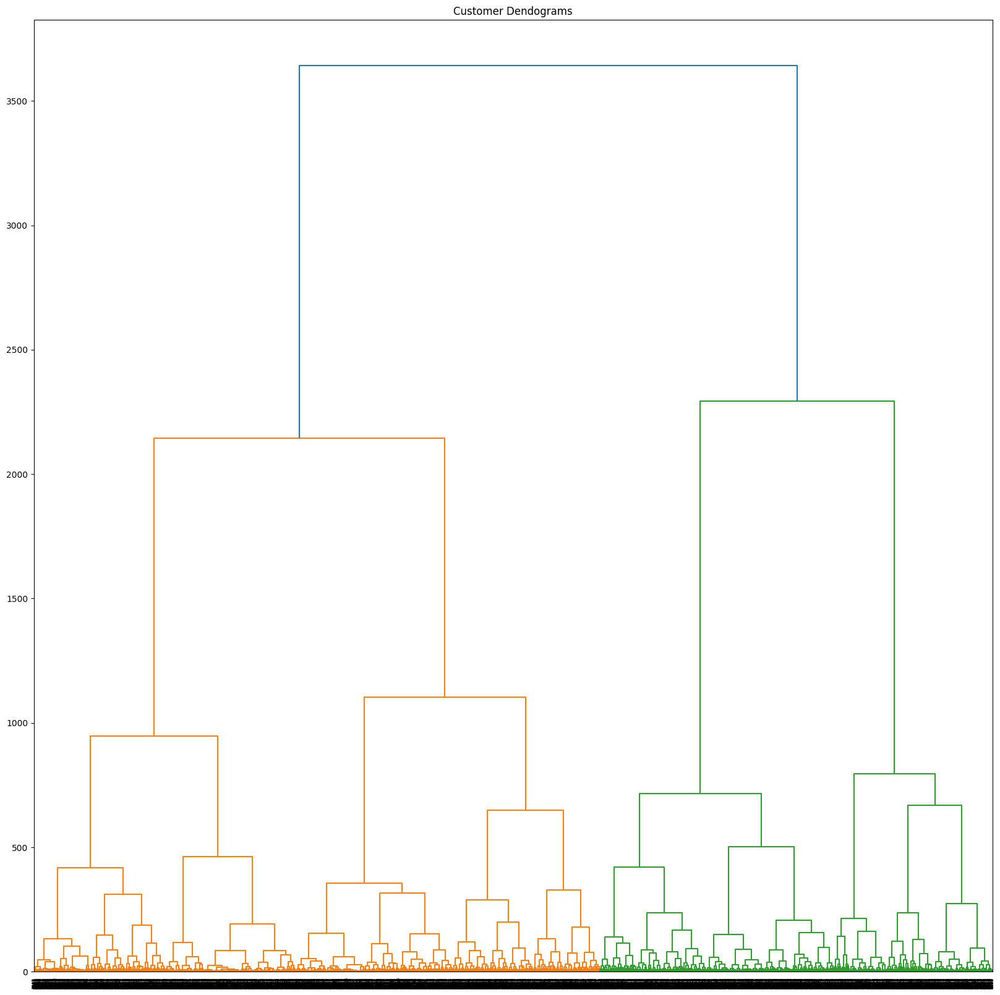

In [60]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(20,20))
plt.title("Customer Dendograms")
dend = shc.dendrogram(shc.linkage(df, method='ward'))
plt.show()

In [61]:
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
target=cluster.fit_predict(df)

In [62]:
from sklearn.cluster import KMeans

model=KMeans(n_clusters=4)
model.fit(df)
targetKMeans=np.array(model.labels_)

In [63]:
from sklearn.decomposition import PCA


pca=PCA(n_components=2)
pc=pca.fit_transform(df)
pdf=pd.DataFrame(data=pc,columns=['principal component 1','principal component 2'])
pdf.head()

,principal component 1,principal component 2
0,-55.648511,8.020889
1,-2.333727,7.752540
2,-42.319369,-12.050211
3,3.204762,27.874065
4,-33.992468,-26.501986


In [64]:
finalDf=pd.concat([pdf,pd.DataFrame(target,columns=['target'])],axis=1)
finalDf.head()

,principal component 1,principal component 2,target
0,-55.648511,8.020889,1
1,-2.333727,7.752540,0
2,-42.319369,-12.050211,1
3,3.204762,27.874065,3
4,-33.992468,-26.501986,0


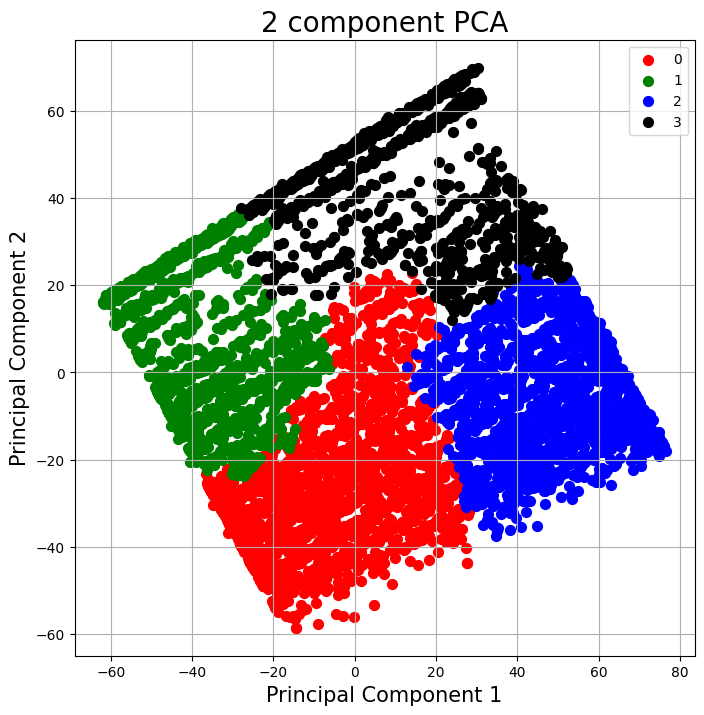

In [65]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [0,1,2,3]
colors = ['r', 'g', 'b','k']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['target'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

In [66]:
finalDfKM=pd.concat([pdf,pd.DataFrame(targetKMeans,columns=['targetKMeans'])],axis=1)
finalDfKM.head()

,principal component 1,principal component 2,targetKMeans
0,-55.648511,8.020889,0
1,-2.333727,7.752540,1
2,-42.319369,-12.050211,0
3,3.204762,27.874065,3
4,-33.992468,-26.501986,1


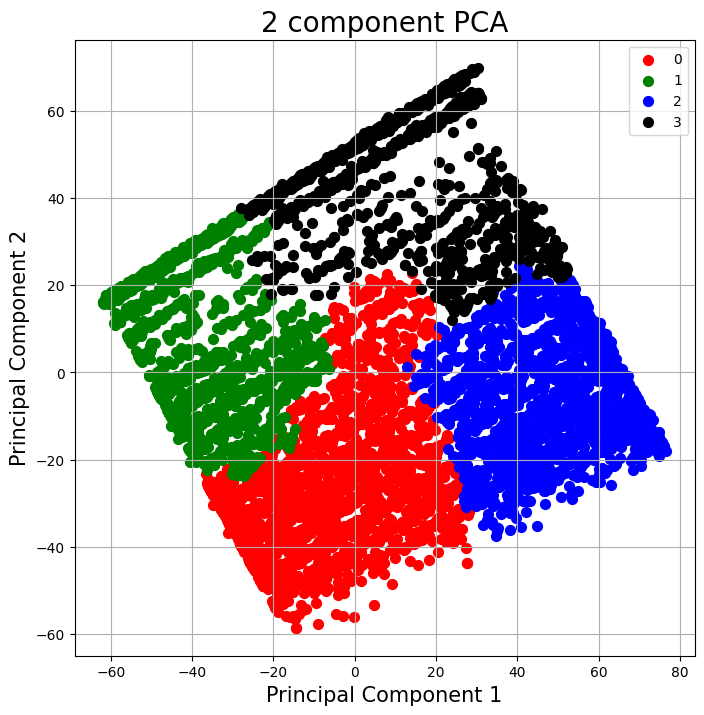

In [67]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [0,1,2,3]
colors = ['r', 'g', 'b','k']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['target'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

# ML

In [12]:
from sklearn.svm import SVC
from sklearn.utils import resample
from lightgbm import LGBMClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import Pipeline
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc , roc_auc_score
from sklearn.impute import SimpleImputer
from sklearn.pipeline import FeatureUnion
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.model_selection import  GridSearchCV
from catboost import CatBoostClassifier, cv, Pool
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier , VotingClassifier
from sklearn.datasets import make_classification
from imblearn.combine import SMOTEENN
from collections import Counter


#### Transform Data

In [13]:
# Define evaluation functions
def print_evaluations_metrics(y_test, y_pred):
    accuracy = accuracy_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    print("Accuracy is ", accuracy)
    print('Recall is', recall)
    print('Precision is', precision)
    print('F1 score is', f1)

def print_classification_report(y_test, y_pred):
    report = classification_report(y_test, y_pred)
    print(report)

def plot_confusion_matrix(y_test, y_pred):
    confusion = confusion_matrix(y_test, y_pred)
    df_cm = pd.DataFrame(confusion, index = ['Actual: 0', 'Actual: 1'],
                  columns = ['Predicted: 0', 'Predicted: 1'])
    plt.figure(figsize = (5.5,4))
    sns.heatmap(df_cm, annot=True, fmt='d', cmap='coolwarm')
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

def plot_auc_and_roc_curve(y_test, y_pred_prob):
    fpr_lr, tpr_lr, _ = roc_curve(y_test, y_pred_prob)
    roc_auc_lr = auc(fpr_lr, tpr_lr)
    print('Area under ROC is', roc_auc_lr)

    plt.figure()
    plt.xlim([-0.01, 1.00])
    plt.ylim([-0.01, 1.01])
    plt.plot(fpr_lr, tpr_lr, lw=3, label='ROC curve (area = {:0.2f})'.format(roc_auc_lr))
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC Curve', fontsize=16)
    plt.legend(loc='lower right', fontsize=13)
    plt.plot([0, 1], [0, 1], color='navy', lw=3, linestyle='--')
    plt.show()

def evaluate(y_test, y_pred, y_pred_prob, print_class_report=True, plot_conf_matrix=True, plot_auc_and_roc=True):
    print_evaluations_metrics(y_test, y_pred)
    if print_class_report:
        print_classification_report(y_test, y_pred)
    if plot_conf_matrix:
        plot_confusion_matrix(y_test, y_pred)
    if plot_auc_and_roc:
        plot_auc_and_roc_curve(y_test, y_pred_prob)

In [14]:
# Define a list of classifiers to evaluate
classifiers = {
    'Logistic Regression': LogisticRegression(random_state=25),
    'Decision Tree': DecisionTreeClassifier(random_state=25),
    'Random Forest': RandomForestClassifier(random_state=25),
    'Gradient Boosting': GradientBoostingClassifier(random_state=25),
    'SVM': SVC(random_state=25, probability=True),
    'KNN': KNeighborsClassifier(),
    'Naive Bayes': GaussianNB(),
    'Neural Network': MLPClassifier(random_state=25),
    'LightGBM': LGBMClassifier(random_state=25),
    'XGBoost': XGBClassifier(random_state=25),
    'Cat Boost': CatBoostClassifier(verbose=False,random_state=42, iterations= 2000)
}

In [15]:
# Encode the target variable 'Churn'
label_encoder = LabelEncoder()
df['Churn'] = label_encoder.fit_transform(df['Churn'])

In [16]:
# Separate features and target variable
X = df.drop(columns=['Churn'])
y = df['Churn']

In [17]:
# Identify categorical columns
categorical_cols = X.select_dtypes(include=['object']).columns

# Encode categorical columns using LabelEncoder
for col in categorical_cols:
    X[col] = LabelEncoder().fit_transform(X[col])


In [ ]:
# Create a pipeline with standard scaler to handle numerical features
pipeline = Pipeline(steps=[
    ('scaler', StandardScaler())
])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=25)

# Preprocess and standardize the features
X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)


#### smote + enn

##### first train

Resampled dataset shape Counter({1: 2888, 0: 2248})
Training Logistic Regression...
Results for Logistic Regression:
Accuracy is  0.8780012978585334
Recall is 0.917550058892815
Precision is 0.8684503901895206
F1 score is 0.8923253150057273
              precision    recall  f1-score   support

           0       0.89      0.83      0.86       692
           1       0.87      0.92      0.89       849

    accuracy                           0.88      1541
   macro avg       0.88      0.87      0.88      1541
weighted avg       0.88      0.88      0.88      1541



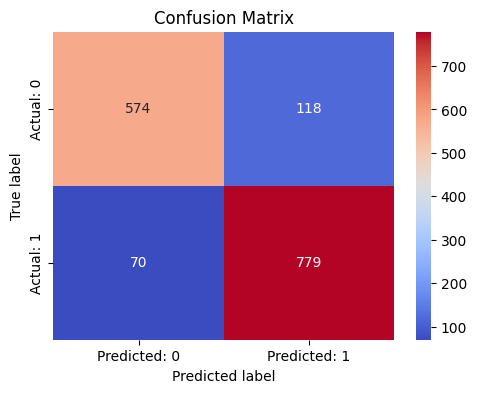

Area under ROC is 0.9470679548193386


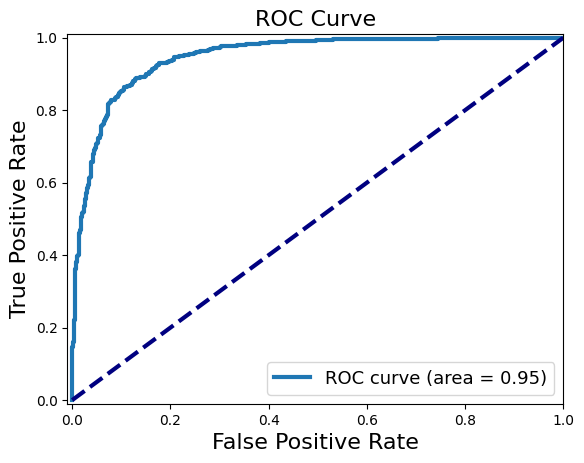



Training Decision Tree...
Results for Decision Tree:
Accuracy is  0.8741077222582738
Recall is 0.9069493521790342
Precision is 0.8700564971751412
F1 score is 0.8881199538638985
              precision    recall  f1-score   support

           0       0.88      0.83      0.86       692
           1       0.87      0.91      0.89       849

    accuracy                           0.87      1541
   macro avg       0.87      0.87      0.87      1541
weighted avg       0.87      0.87      0.87      1541



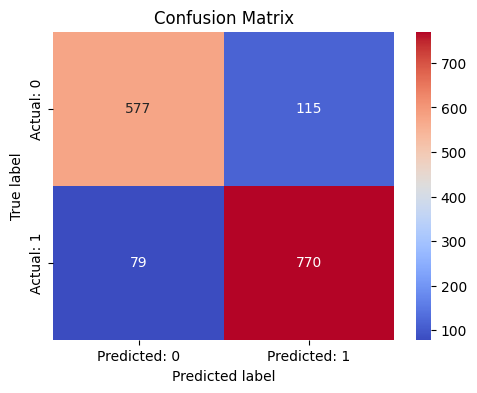

Area under ROC is 0.8703821905403841


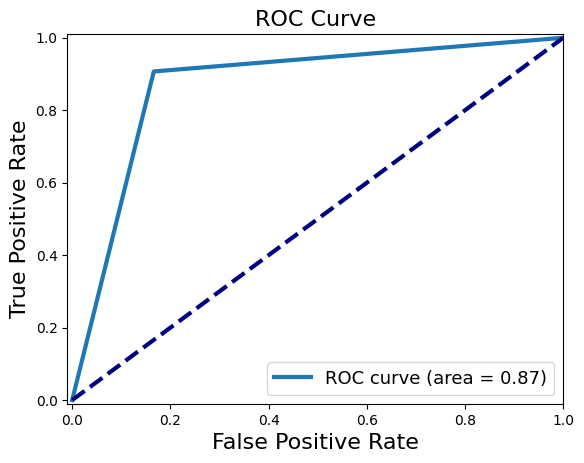



Training Random Forest...
Results for Random Forest:
Accuracy is  0.9097988319273199
Recall is 0.9458186101295641
Precision is 0.8962053571428571
F1 score is 0.9203438395415472
              precision    recall  f1-score   support

           0       0.93      0.87      0.90       692
           1       0.90      0.95      0.92       849

    accuracy                           0.91      1541
   macro avg       0.91      0.91      0.91      1541
weighted avg       0.91      0.91      0.91      1541



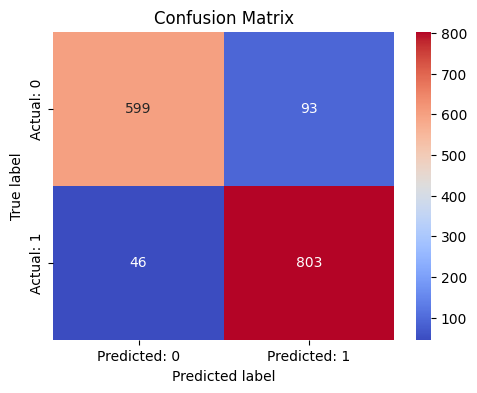

Area under ROC is 0.9731399402220905


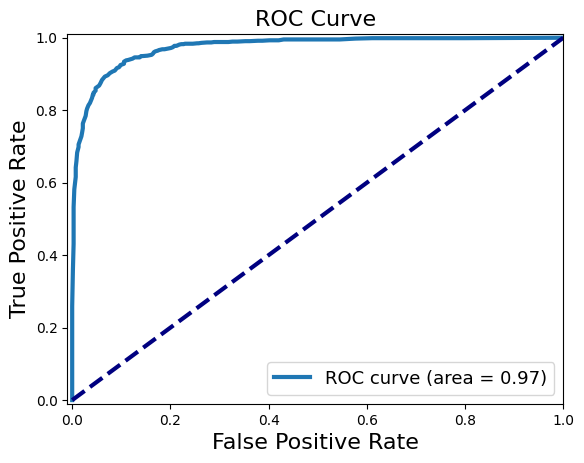



Training Gradient Boosting...
Results for Gradient Boosting:
Accuracy is  0.9020116807268008
Recall is 0.9399293286219081
Precision is 0.888641425389755
F1 score is 0.9135661133371494
              precision    recall  f1-score   support

           0       0.92      0.86      0.89       692
           1       0.89      0.94      0.91       849

    accuracy                           0.90      1541
   macro avg       0.90      0.90      0.90      1541
weighted avg       0.90      0.90      0.90      1541



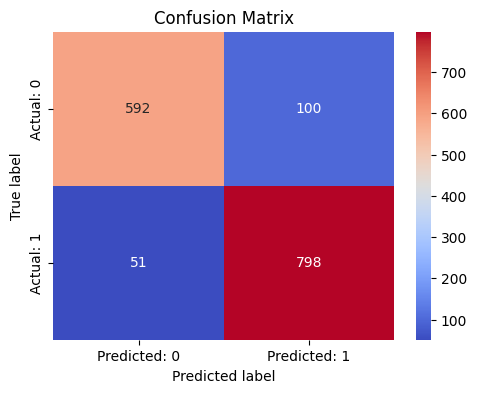

Area under ROC is 0.9687536169720242


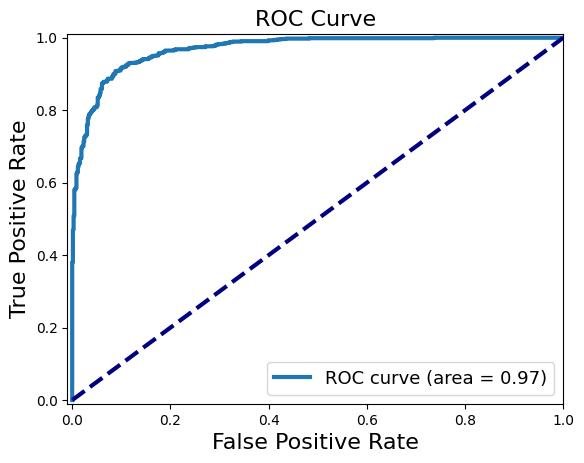



Training SVM...
Results for SVM:
Accuracy is  0.6917585983127839
Recall is 0.7879858657243817
Precision is 0.6939834024896265
F1 score is 0.7380033094318809
              precision    recall  f1-score   support

           0       0.69      0.57      0.63       692
           1       0.69      0.79      0.74       849

    accuracy                           0.69      1541
   macro avg       0.69      0.68      0.68      1541
weighted avg       0.69      0.69      0.69      1541



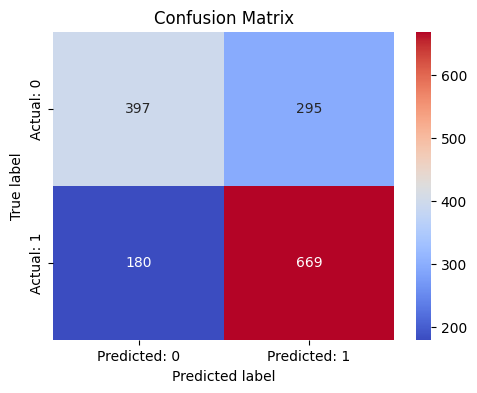

Area under ROC is 0.7931330296778938


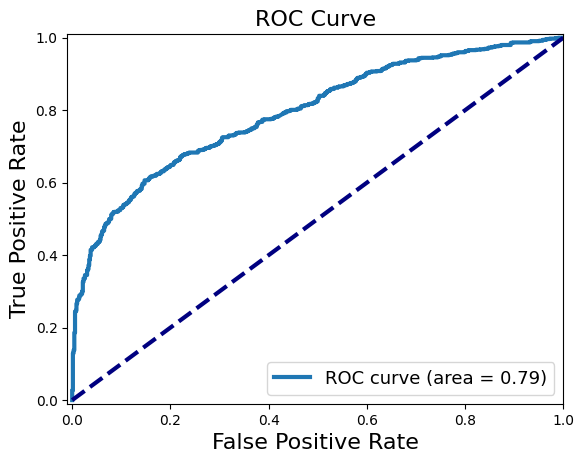



Training KNN...
Results for KNN:
Accuracy is  0.8669695003244646
Recall is 0.9352179034157833
Precision is 0.8411016949152542
F1 score is 0.8856664807585053
              precision    recall  f1-score   support

           0       0.91      0.78      0.84       692
           1       0.84      0.94      0.89       849

    accuracy                           0.87      1541
   macro avg       0.87      0.86      0.86      1541
weighted avg       0.87      0.87      0.87      1541



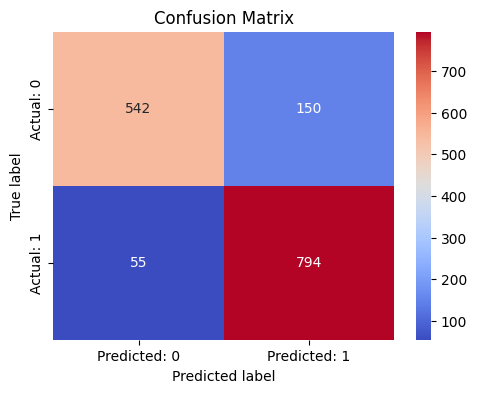

Area under ROC is 0.9383787114388229


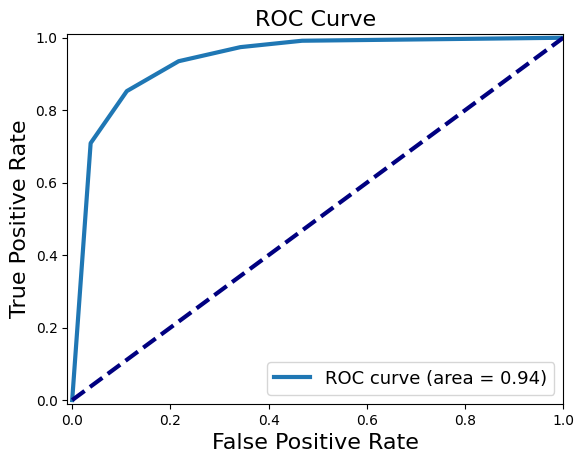



Training Naive Bayes...
Results for Naive Bayes:
Accuracy is  0.8572355613238157
Recall is 0.8916372202591284
Precision is 0.8553672316384181
F1 score is 0.873125720876586
              precision    recall  f1-score   support

           0       0.86      0.82      0.84       692
           1       0.86      0.89      0.87       849

    accuracy                           0.86      1541
   macro avg       0.86      0.85      0.85      1541
weighted avg       0.86      0.86      0.86      1541



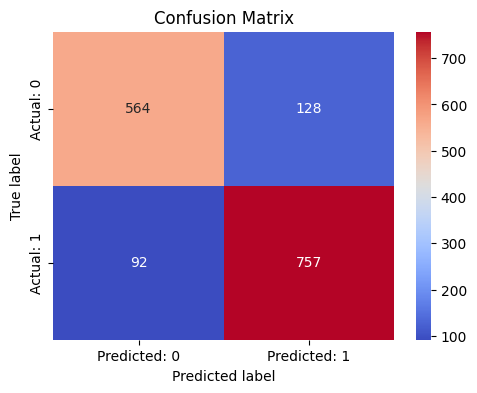

Area under ROC is 0.9354766232970444


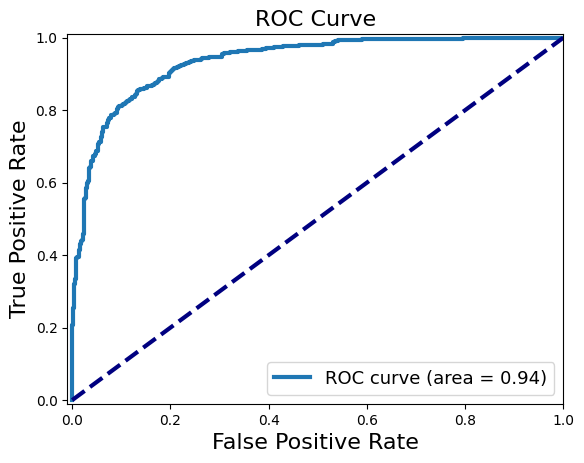



Training Neural Network...
Results for Neural Network:
Accuracy is  0.8500973393900065
Recall is 0.7997644287396938
Precision is 0.9175675675675675
F1 score is 0.8546255506607929
              precision    recall  f1-score   support

           0       0.79      0.91      0.85       692
           1       0.92      0.80      0.85       849

    accuracy                           0.85      1541
   macro avg       0.85      0.86      0.85      1541
weighted avg       0.86      0.85      0.85      1541



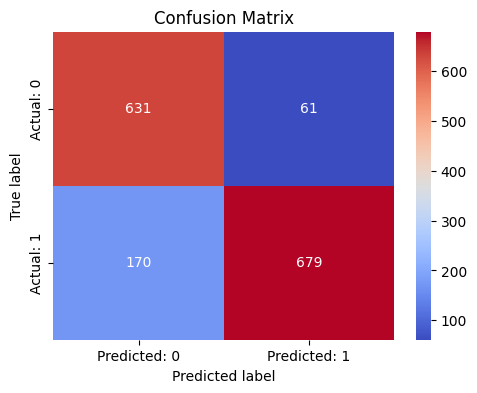

Area under ROC is 0.9344825942795673


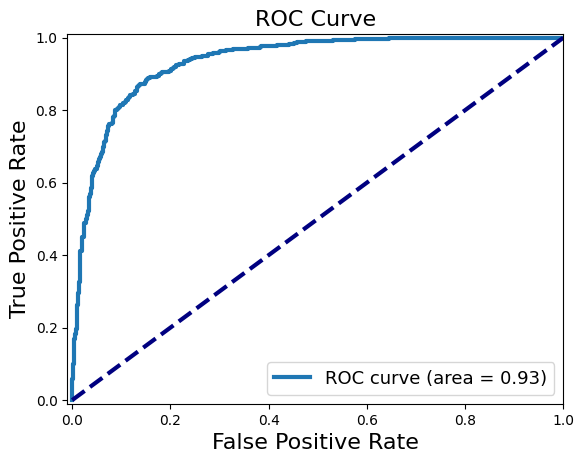



Training LightGBM...
[LightGBM] [Info] Number of positive: 2039, number of negative: 1556
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 969
[LightGBM] [Info] Number of data points in the train set: 3595, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.567177 -> initscore=0.270341
[LightGBM] [Info] Start training from score 0.270341
Results for LightGBM:
Accuracy is  0.9188838416612589
Recall is 0.944640753828033
Precision is 0.9113636363636364
F1 score is 0.9277038750722962
              precision    recall  f1-score   support

           0       0.93      0.89      0.91       692
           1       0.91      0.94      0.93       849

    accuracy                           0.92      1541
   macro avg       0.92      0.92      0.92      1541
weighted

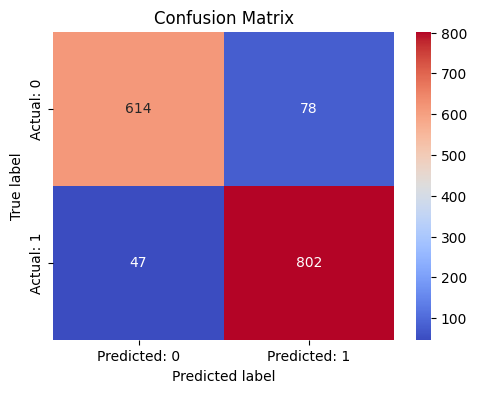

Area under ROC is 0.9776445597336547


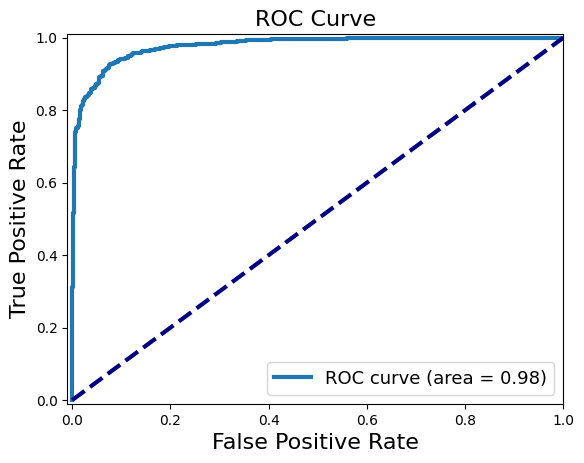



Training XGBoost...
Results for XGBoost:
Accuracy is  0.9253731343283582
Recall is 0.9528857479387515
Precision is 0.915158371040724
F1 score is 0.9336410848240047
              precision    recall  f1-score   support

           0       0.94      0.89      0.91       692
           1       0.92      0.95      0.93       849

    accuracy                           0.93      1541
   macro avg       0.93      0.92      0.92      1541
weighted avg       0.93      0.93      0.93      1541



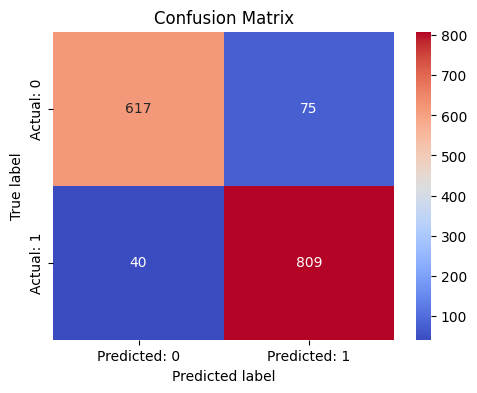

Area under ROC is 0.9773109472551863


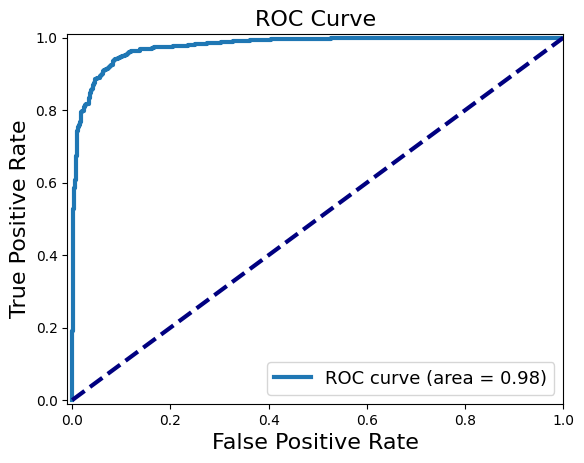



Training Cat Boost...
Results for Cat Boost:
Accuracy is  0.9292667099286178
Recall is 0.9599528857479388
Precision is 0.9157303370786517
F1 score is 0.9373202990224268
              precision    recall  f1-score   support

           0       0.95      0.89      0.92       692
           1       0.92      0.96      0.94       849

    accuracy                           0.93      1541
   macro avg       0.93      0.93      0.93      1541
weighted avg       0.93      0.93      0.93      1541



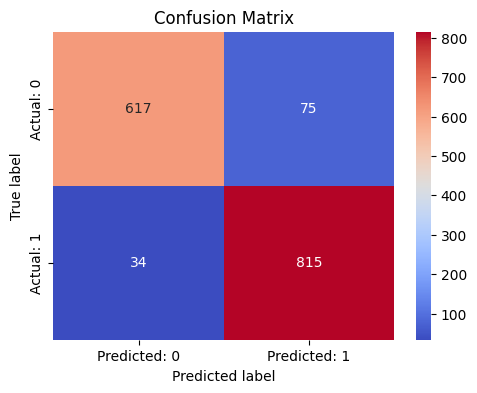

Area under ROC is 0.9782505089292401


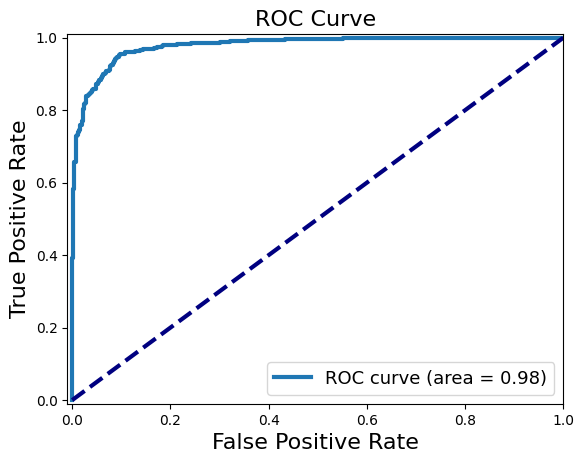

In [21]:
# SMOTE followed by ENN
smote_enn = SMOTEENN(random_state=42)
X_resampled, y_resampled = smote_enn.fit_resample(X, y)

print('Resampled dataset shape %s' % Counter(y_resampled))

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)

for name, classifier in classifiers.items():
    print(f"Training {name}...")
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_test)
    y_pred_prob = classifier.predict_proba(X_test)[:, 1]
    print(f"Results for {name}:")
    evaluate(y_test, y_pred, y_pred_prob)
    print("\n" + "="*60 + "\n")


##### features selection

Resampled dataset shape Counter({1: 3217, 0: 2698})
Training Logistic Regression...
Results for Logistic Regression:
Accuracy is  0.927887323943662
Recall is 0.9332627118644068
Precision is 0.9312896405919662
F1 score is 0.9322751322751324
              precision    recall  f1-score   support

           0       0.92      0.92      0.92       831
           1       0.93      0.93      0.93       944

    accuracy                           0.93      1775
   macro avg       0.93      0.93      0.93      1775
weighted avg       0.93      0.93      0.93      1775



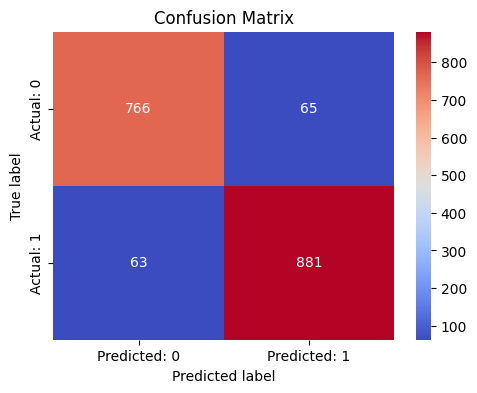

Area under ROC is 0.9764731077525546


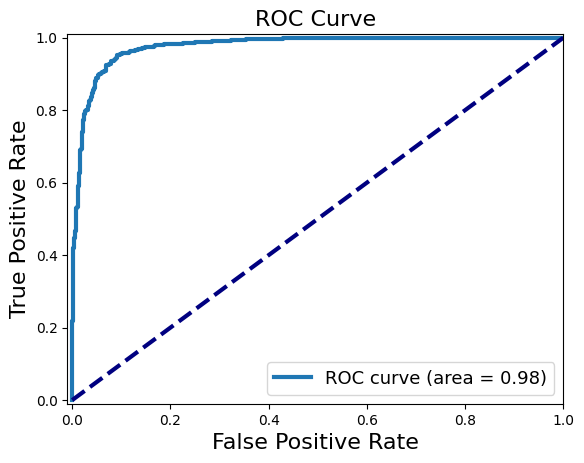



Training Decision Tree...
Results for Decision Tree:
Accuracy is  0.9222535211267605
Recall is 0.9290254237288136
Precision is 0.9251054852320675
F1 score is 0.927061310782241
              precision    recall  f1-score   support

           0       0.92      0.91      0.92       831
           1       0.93      0.93      0.93       944

    accuracy                           0.92      1775
   macro avg       0.92      0.92      0.92      1775
weighted avg       0.92      0.92      0.92      1775



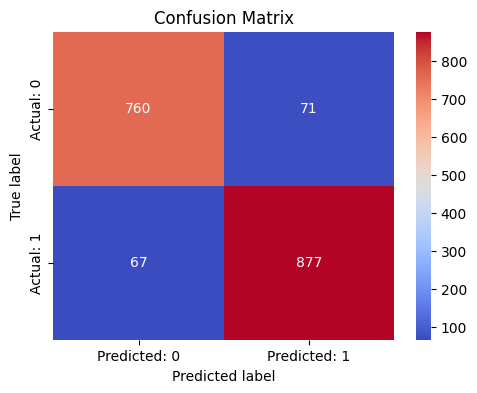

Area under ROC is 0.9217930969426258


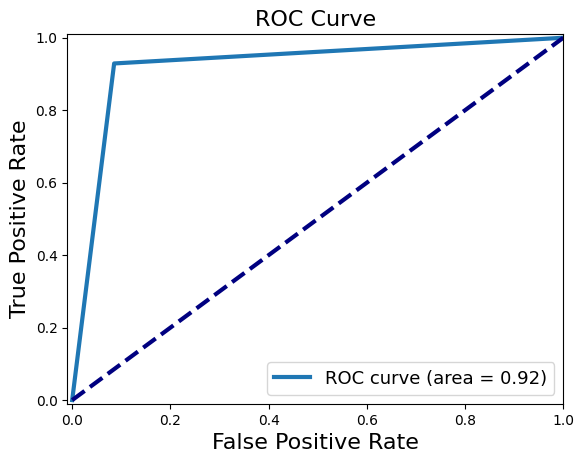



Training Random Forest...
Results for Random Forest:
Accuracy is  0.9538028169014084
Recall is 0.9608050847457628
Precision is 0.9527310924369747
F1 score is 0.9567510548523206
              precision    recall  f1-score   support

           0       0.96      0.95      0.95       831
           1       0.95      0.96      0.96       944

    accuracy                           0.95      1775
   macro avg       0.95      0.95      0.95      1775
weighted avg       0.95      0.95      0.95      1775



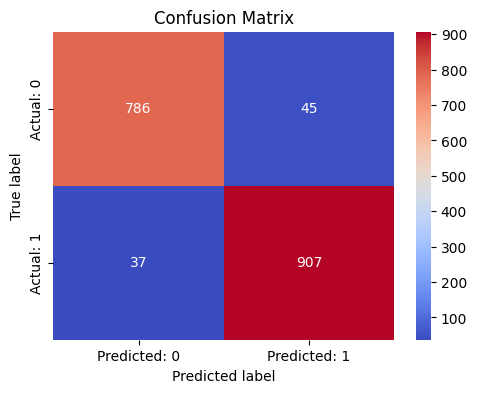

Area under ROC is 0.9894545830018968


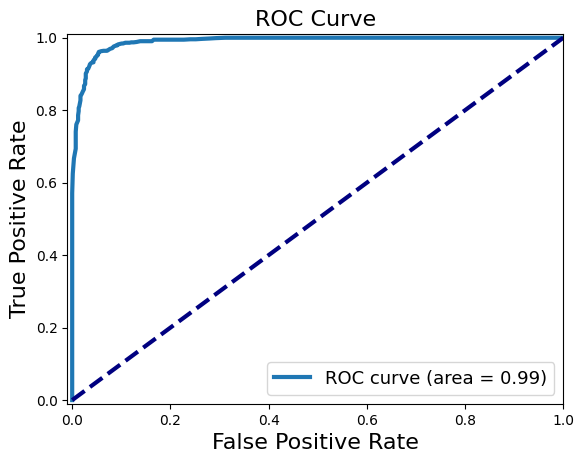



Training Gradient Boosting...
Results for Gradient Boosting:
Accuracy is  0.9436619718309859
Recall is 0.9533898305084746
Precision is 0.9414225941422594
F1 score is 0.9473684210526315
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       831
           1       0.94      0.95      0.95       944

    accuracy                           0.94      1775
   macro avg       0.94      0.94      0.94      1775
weighted avg       0.94      0.94      0.94      1775



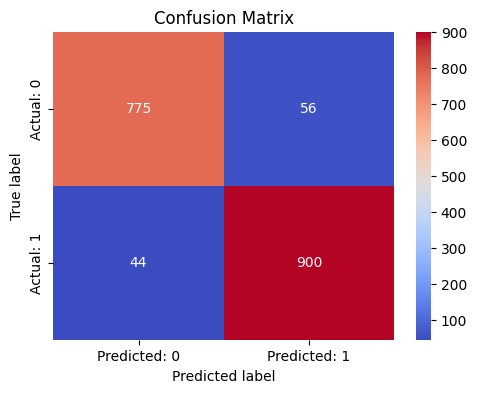

Area under ROC is 0.9850241693691488


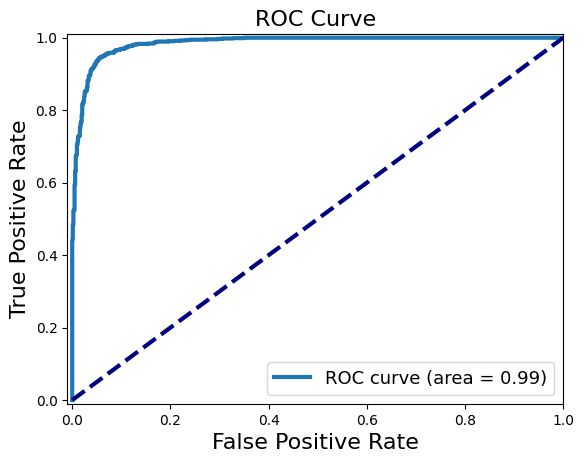



Training SVM...
Results for SVM:
Accuracy is  0.8028169014084507
Recall is 0.836864406779661
Precision is 0.8012170385395537
F1 score is 0.8186528497409326
              precision    recall  f1-score   support

           0       0.80      0.76      0.78       831
           1       0.80      0.84      0.82       944

    accuracy                           0.80      1775
   macro avg       0.80      0.80      0.80      1775
weighted avg       0.80      0.80      0.80      1775



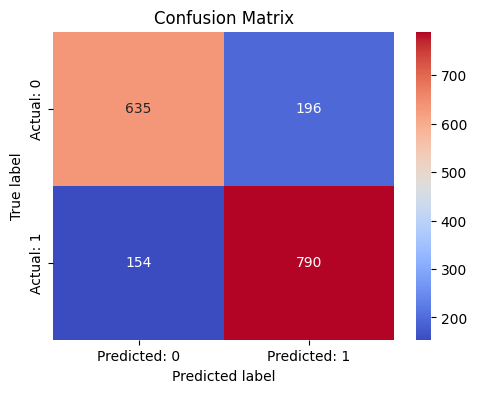

Area under ROC is 0.8821539293071448


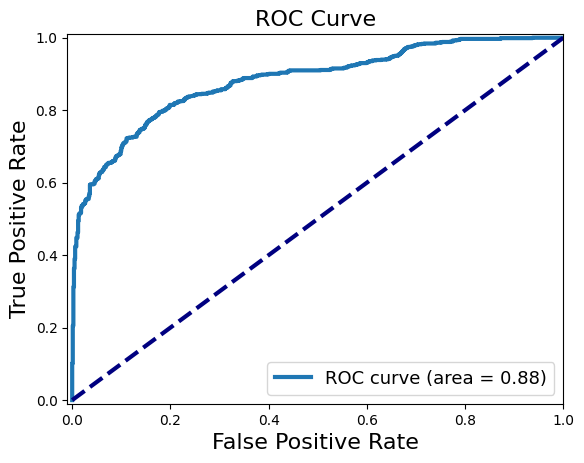



Training KNN...
Results for KNN:
Accuracy is  0.9487323943661972
Recall is 0.9555084745762712
Precision is 0.9484752891692955
F1 score is 0.9519788918205805
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       831
           1       0.95      0.96      0.95       944

    accuracy                           0.95      1775
   macro avg       0.95      0.95      0.95      1775
weighted avg       0.95      0.95      0.95      1775



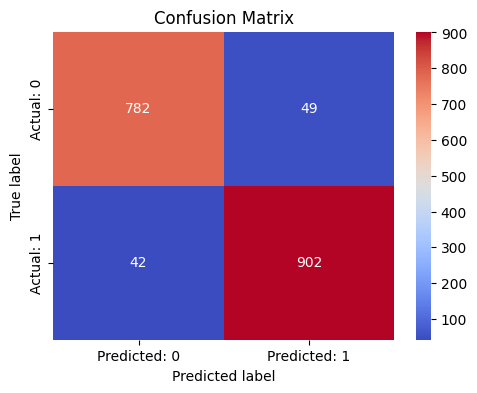

Area under ROC is 0.9865812835260764


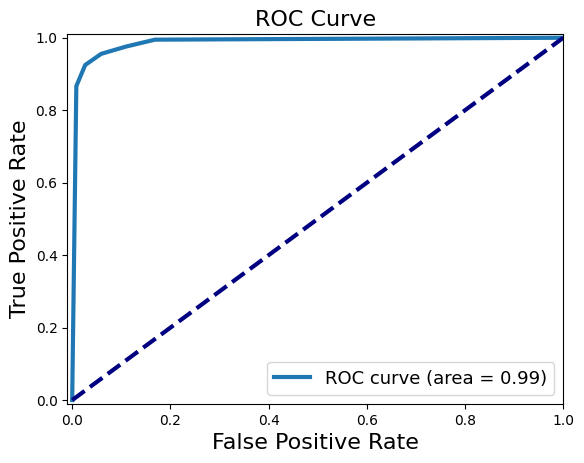



Training Naive Bayes...
Results for Naive Bayes:
Accuracy is  0.8918309859154929
Recall is 0.8898305084745762
Precision is 0.9051724137931034
F1 score is 0.8974358974358974
              precision    recall  f1-score   support

           0       0.88      0.89      0.89       831
           1       0.91      0.89      0.90       944

    accuracy                           0.89      1775
   macro avg       0.89      0.89      0.89      1775
weighted avg       0.89      0.89      0.89      1775



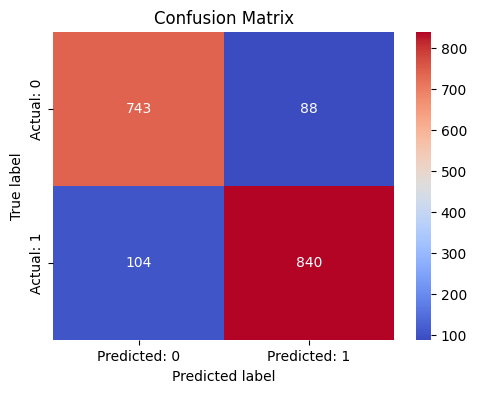

Area under ROC is 0.9570190601480757


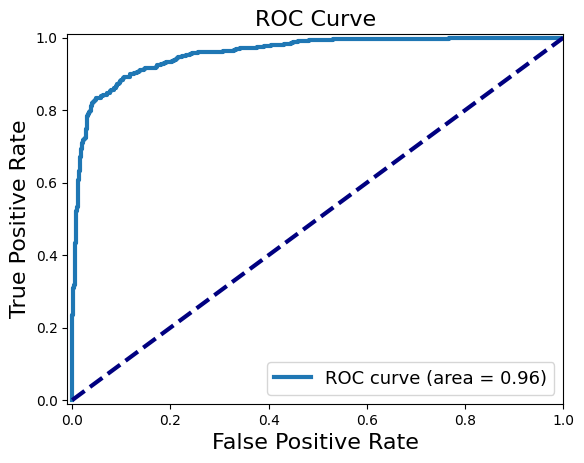



Training Neural Network...
Results for Neural Network:
Accuracy is  0.9132394366197183
Recall is 0.965042372881356
Precision is 0.8827519379844961
F1 score is 0.9220647773279352
              precision    recall  f1-score   support

           0       0.96      0.85      0.90       831
           1       0.88      0.97      0.92       944

    accuracy                           0.91      1775
   macro avg       0.92      0.91      0.91      1775
weighted avg       0.92      0.91      0.91      1775



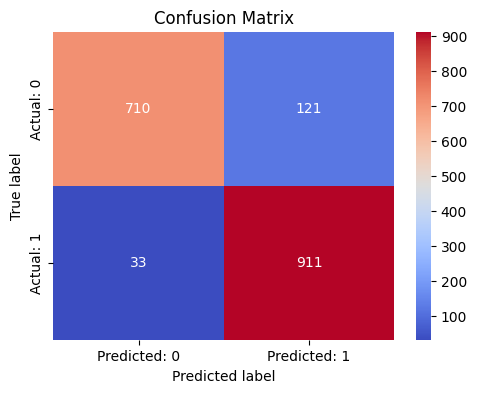

Area under ROC is 0.9697232760203145


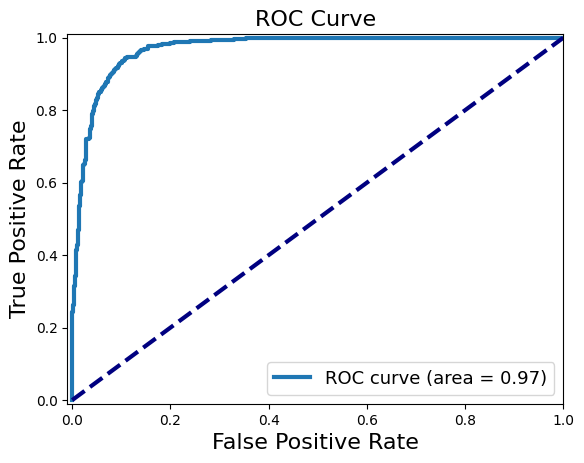



Training LightGBM...
[LightGBM] [Info] Number of positive: 2273, number of negative: 1867
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001990 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 699
[LightGBM] [Info] Number of data points in the train set: 4140, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.549034 -> initscore=0.196768
[LightGBM] [Info] Start training from score 0.196768
Results for LightGBM:
Accuracy is  0.9526760563380282
Recall is 0.9629237288135594
Precision is 0.9488517745302714
F1 score is 0.9558359621451105
              precision    recall  f1-score   support

           0       0.96      0.94      0.95       831
           1       0.95      0.96      0.96       944

    accuracy                           0.95      1775
   macro avg       0.95      0.95      0.95      1775
weighte

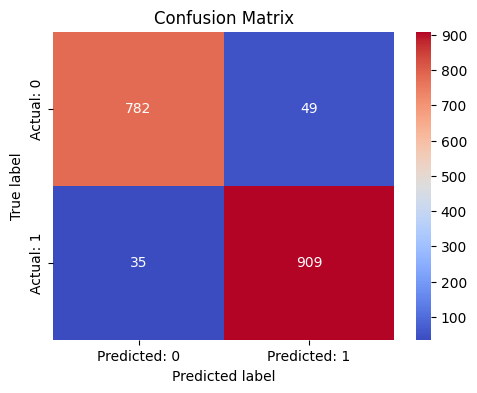

Area under ROC is 0.9878949193334557


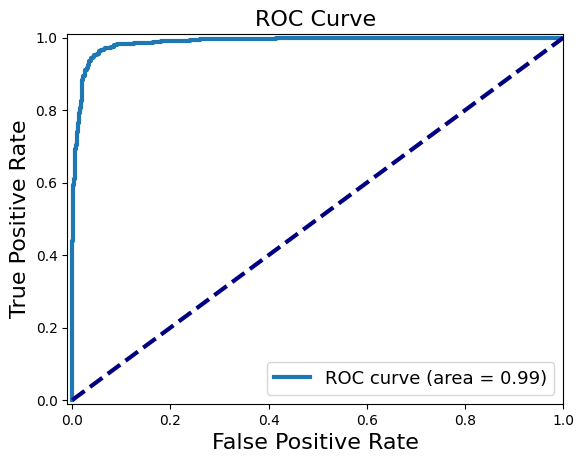



Training XGBoost...
Results for XGBoost:
Accuracy is  0.9515492957746479
Recall is 0.9597457627118644
Precision is 0.949685534591195
F1 score is 0.9546891464699684
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       831
           1       0.95      0.96      0.95       944

    accuracy                           0.95      1775
   macro avg       0.95      0.95      0.95      1775
weighted avg       0.95      0.95      0.95      1775



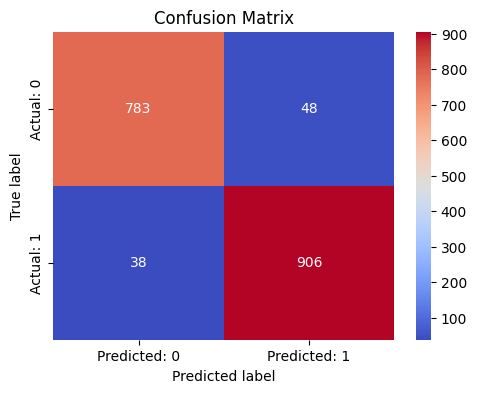

Area under ROC is 0.9877648942462623


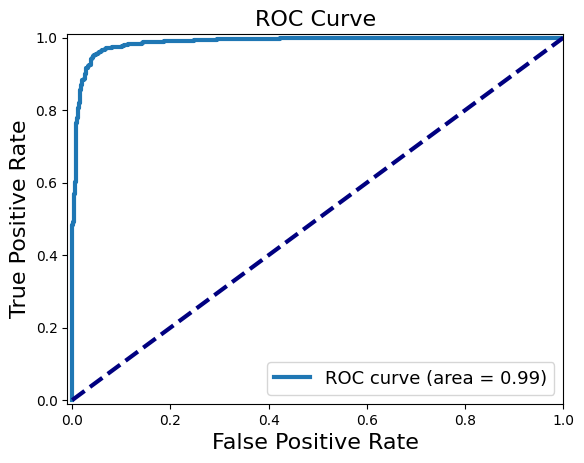



Training Cat Boost...
Results for Cat Boost:
Accuracy is  0.9515492957746479
Recall is 0.9576271186440678
Precision is 0.9515789473684211
F1 score is 0.9545934530095036
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       831
           1       0.95      0.96      0.95       944

    accuracy                           0.95      1775
   macro avg       0.95      0.95      0.95      1775
weighted avg       0.95      0.95      0.95      1775



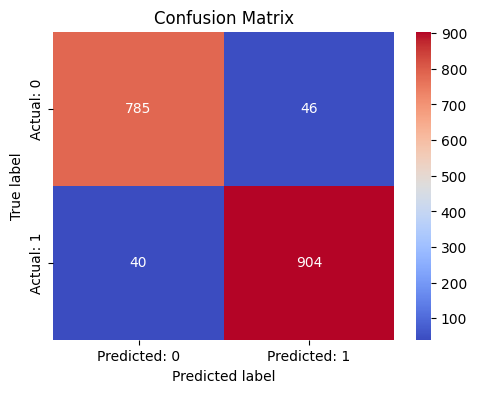

Area under ROC is 0.9879816027249179


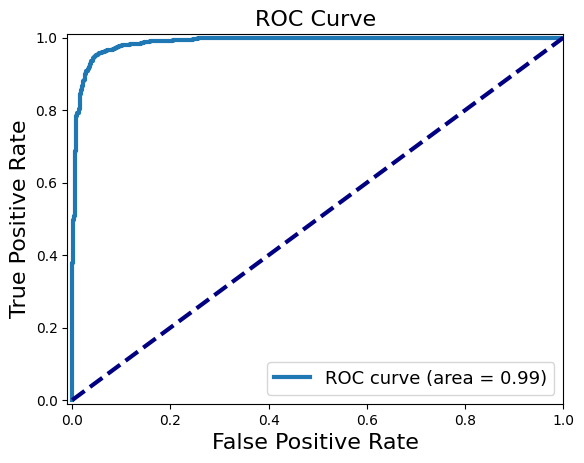

In [29]:
X_selected = X[selected_features]

smote_enn = SMOTEENN(random_state=42)
X_resampled, y_resampled = smote_enn.fit_resample(X_selected, y)

print('Resampled dataset shape %s' % Counter(y_resampled))

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)

for name, classifier in classifiers.items():
    print(f"Training {name}...")
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_test)
    y_pred_prob = classifier.predict_proba(X_test)[:, 1]
    print(f"Results for {name}:")
    evaluate(y_test, y_pred, y_pred_prob)
    print("\n" + "="*60 + "\n")

##### Voting Classifier

[LightGBM] [Info] Number of positive: 2273, number of negative: 1867
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000823 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 699
[LightGBM] [Info] Number of data points in the train set: 4140, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.549034 -> initscore=0.196768
[LightGBM] [Info] Start training from score 0.196768
Accuracy is  0.9554929577464789
Recall is 0.9565677966101694
Precision is 0.9596174282678002
F1 score is 0.9580901856763925
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       831
           1       0.96      0.96      0.96       944

    accuracy                           0.96      1775
   macro avg       0.96      0.96      0.96      1775
weighted avg       0.96      0.96      0.96      177

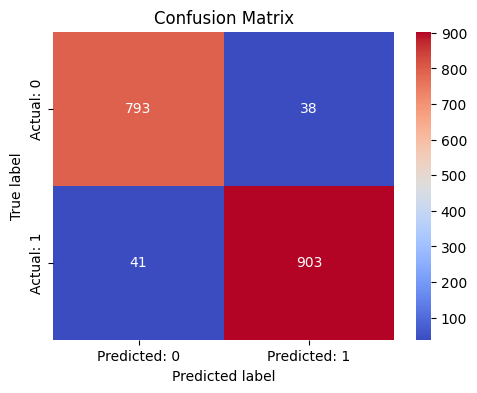

Area under ROC is 0.9879816027249179


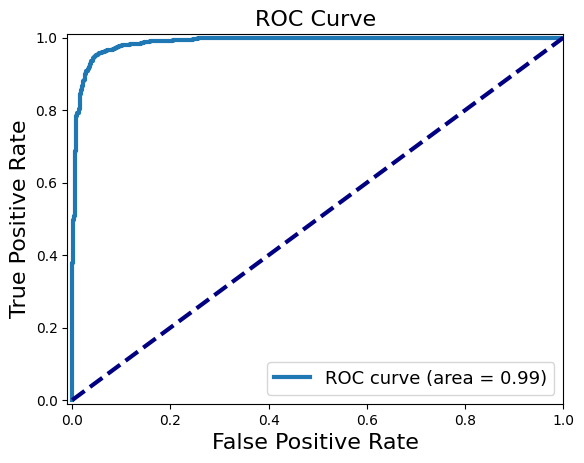

In [37]:
# Voting Classifier

classifiers2 = [
    # ('Logistic Regression', LogisticRegression(random_state=25)),
    # ('Decision Tree', DecisionTreeClassifier(random_state=25)),
    ('Random Forest', RandomForestClassifier(random_state=25)),
    # ('Gradient Boosting', GradientBoostingClassifier(random_state=25)),
    # ('SVM', SVC(random_state=25, probability=True)),
    # ('KNN', KNeighborsClassifier()),
    # ('Naive Bayes', GaussianNB()),
    # ('Neural Network', MLPClassifier(random_state=25)),
    ('XGBoost', XGBClassifier(random_state=25)),
    ('LightGBM', LGBMClassifier(random_state=25)),
    ('Cat Boost', CatBoostClassifier(verbose=False,random_state=42, iterations= 2000))
]

voting_regressor = VotingClassifier(estimators=classifiers2)

voting_regressor.fit(X_train, y_train)
y_pred = voting_regressor.predict(X_test)
y_pred_prob = classifier.predict_proba(X_test)[:, 1]
evaluate(y_test, y_pred,y_pred_prob)

##### check overfitting


Balanced Dataset (2:1) Evaluation
Accuracy is  0.9538028169014084
Recall is 0.9608050847457628
Precision is 0.9527310924369747
F1 score is 0.9567510548523206
              precision    recall  f1-score   support

           0       0.96      0.95      0.95       831
           1       0.95      0.96      0.96       944

    accuracy                           0.95      1775
   macro avg       0.95      0.95      0.95      1775
weighted avg       0.95      0.95      0.95      1775



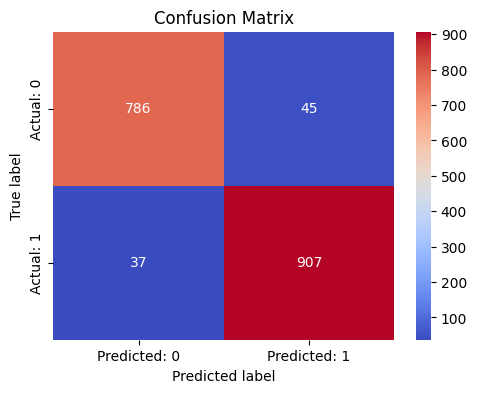

Area under ROC is 0.9894545830018968


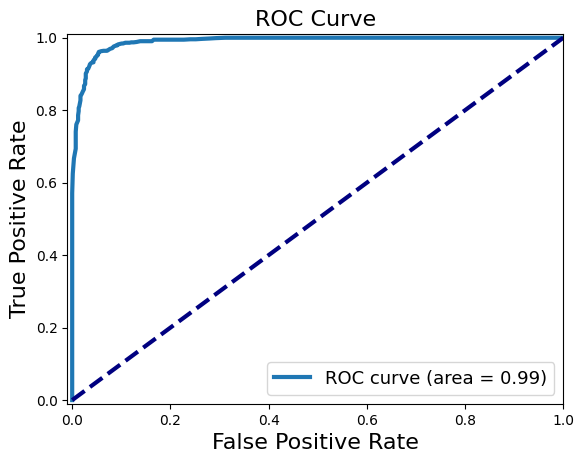

In [39]:
# Use the best parameters found by GridSearchCV

model =  RandomForestClassifier(random_state=25)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

y_pred_prob = model.predict_proba(X_test)[:, 1]

print("\nBalanced Dataset (2:1) Evaluation")
evaluate(y_test, y_pred, y_pred_prob)

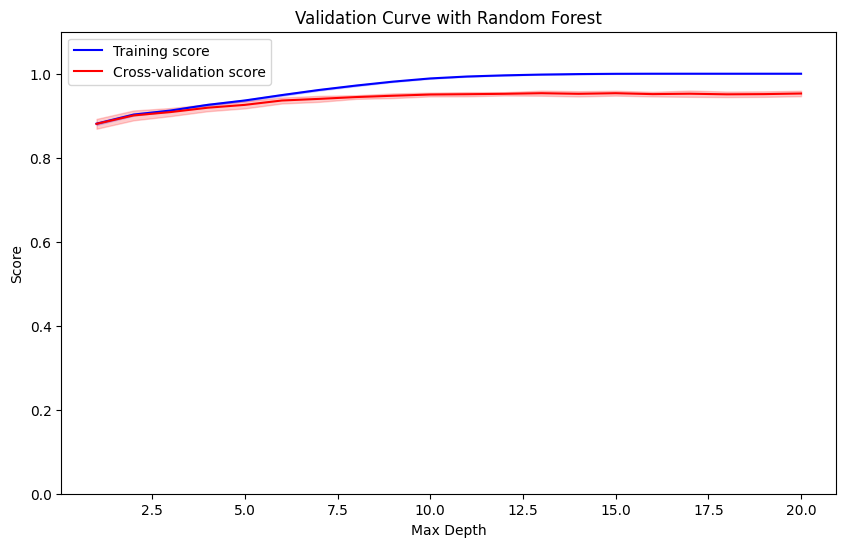

In [44]:
model = RandomForestClassifier(random_state=25)

param_range = np.arange(1, 21)

train_scores, valid_scores = validation_curve(
    model, X_train, y_train,
    param_name='max_depth',
    param_range=param_range,
    cv=7,
    scoring='accuracy',
    n_jobs=-1
)

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
valid_scores_mean = np.mean(valid_scores, axis=1)
valid_scores_std = np.std(valid_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.title("Validation Curve with Random Forest")
plt.xlabel("Max Depth")
plt.ylabel("Score")
plt.ylim(0.0, 1.1)

plt.plot(param_range, train_scores_mean, label="Training score", color="blue")
plt.plot(param_range, valid_scores_mean, label="Cross-validation score", color="red")

plt.fill_between(param_range, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2, color="blue")
plt.fill_between(param_range, valid_scores_mean - valid_scores_std,
                 valid_scores_mean + valid_scores_std, alpha=0.2, color="red")

plt.legend(loc="best")
plt.show()


##### GridSearch

In [32]:
# Use the best parameters found by GridSearchCV

best_params = {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 300}

pipeline = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('classifier', RandomForestClassifier(random_state=25))
])

param_grid = {
    'classifier__n_estimators': [100, 200, 300],  # Number of trees in the forest
    'classifier__max_depth': [None, 10, 20],  # Maximum depth of the tree
    'classifier__min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'classifier__min_samples_leaf': [1, 2, 4],  # Minimum number of samples required to be at a leaf node
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='roc_auc')
grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)
print("Best ROC AUC score found: ", grid_search.best_score_)

y_pred = grid_search.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'ROC AUC: {roc_auc}')

Best parameters found:  {'classifier__max_depth': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200}
Best ROC AUC score found:  0.9895879332334692
Accuracy: 0.9509859154929577
ROC AUC: 0.9504623539129903



Balanced Dataset (2:1) Evaluation
Accuracy is  0.9509859154929577
Recall is 0.9586864406779662
Precision is 0.9496327387198321
F1 score is 0.9541381128096995
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       831
           1       0.95      0.96      0.95       944

    accuracy                           0.95      1775
   macro avg       0.95      0.95      0.95      1775
weighted avg       0.95      0.95      0.95      1775



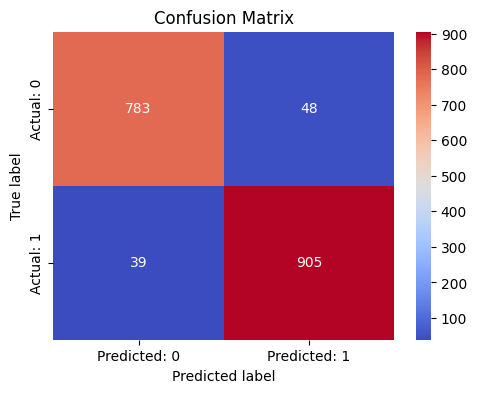

Area under ROC is 0.9897152705541618


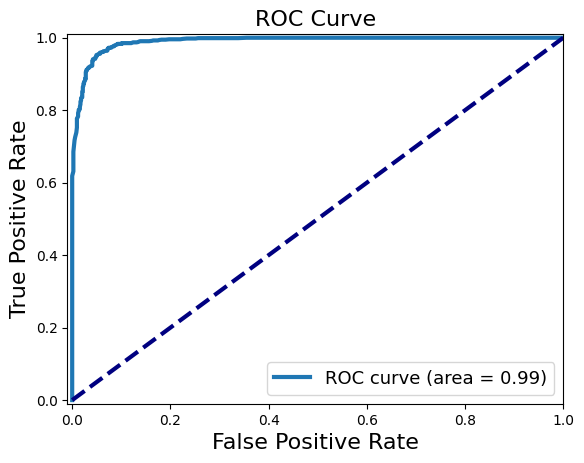

In [36]:
# Use the best parameters found by GridSearchCV

best_params = { 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}

pipeline = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('classifier', RandomForestClassifier(random_state=25, **best_params))
])

pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

y_pred_prob = pipeline.predict_proba(X_test)[:, 1]

print("\nBalanced Dataset (2:1) Evaluation")
evaluate(y_test, y_pred, y_pred_prob)

#### Under Sampling

In [ ]:
# Separate the majority and minority classes
data_majority = df[df.Churn == 0]
data_minority = df[df.Churn == 1]

# 1. Balance dataset with equal number of 0 and 1 samples
data_majority_balanced = resample(data_majority,
                                  replace=False,   
                                  n_samples=len(data_minority), 
                                  random_state=42)

data_balanced = pd.concat([data_majority_balanced, data_minority])

X_balanced = data_balanced.drop('Churn', axis=1)
y_balanced = data_balanced['Churn']


Training Logistic Regression...
Results for Logistic Regression:
Accuracy is  0.7713903743315508
Recall is 0.8162729658792651
Precision is 0.7548543689320388
F1 score is 0.7843631778058008
              precision    recall  f1-score   support

           0       0.79      0.72      0.76       367
           1       0.75      0.82      0.78       381

    accuracy                           0.77       748
   macro avg       0.77      0.77      0.77       748
weighted avg       0.77      0.77      0.77       748



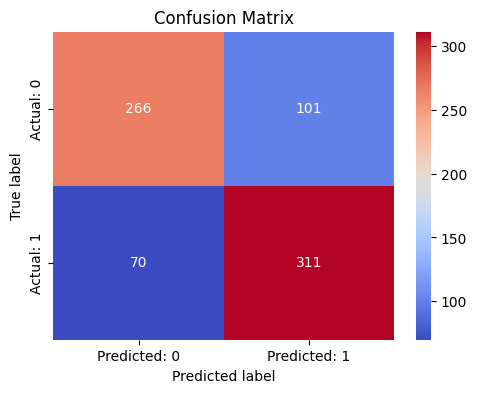

Area under ROC is 0.8612857316541154


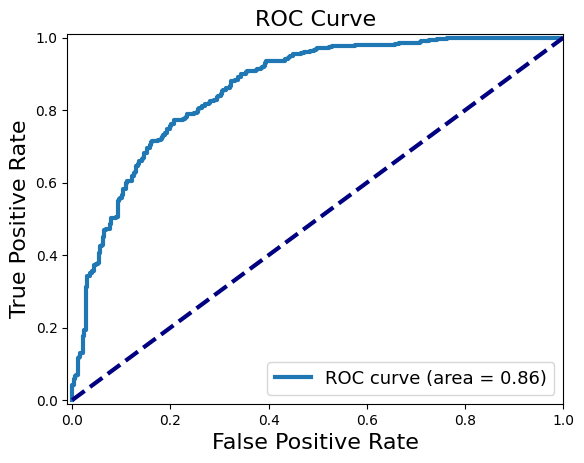



Training Decision Tree...
Results for Decision Tree:
Accuracy is  0.7072192513368984
Recall is 0.7139107611548556
Precision is 0.7120418848167539
F1 score is 0.7129750982961991
              precision    recall  f1-score   support

           0       0.70      0.70      0.70       367
           1       0.71      0.71      0.71       381

    accuracy                           0.71       748
   macro avg       0.71      0.71      0.71       748
weighted avg       0.71      0.71      0.71       748



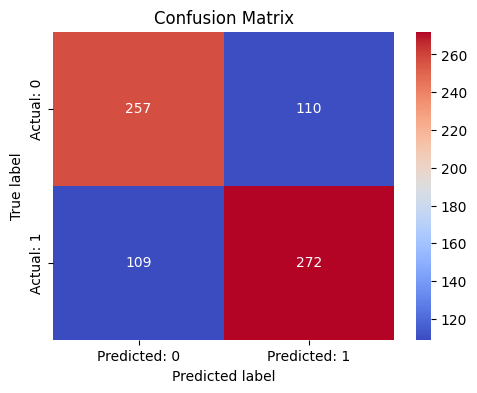

Area under ROC is 0.7070916203594442


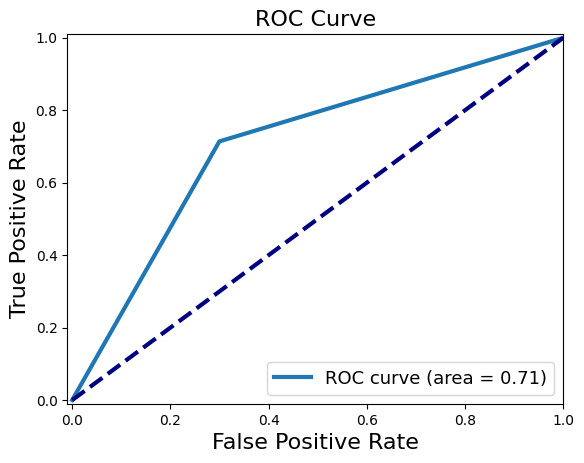



Training Random Forest...
Results for Random Forest:
Accuracy is  0.7887700534759359
Recall is 0.7926509186351706
Precision is 0.7926509186351706
F1 score is 0.7926509186351706
              precision    recall  f1-score   support

           0       0.78      0.78      0.78       367
           1       0.79      0.79      0.79       381

    accuracy                           0.79       748
   macro avg       0.79      0.79      0.79       748
weighted avg       0.79      0.79      0.79       748



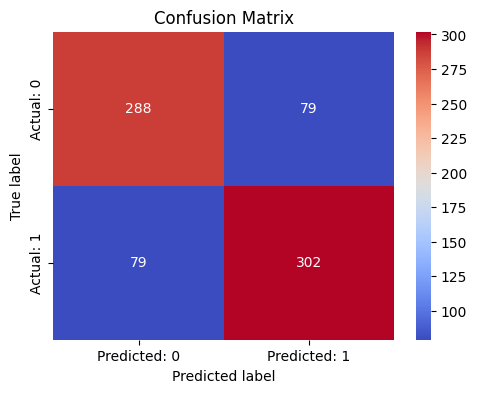

Area under ROC is 0.8557610475802241


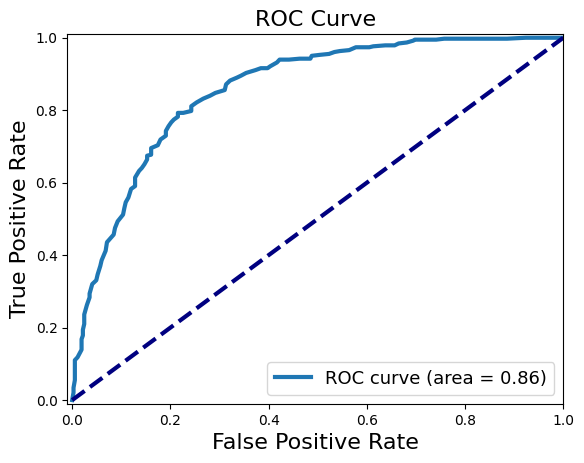



Training Gradient Boosting...
Results for Gradient Boosting:
Accuracy is  0.7994652406417112
Recall is 0.821522309711286
Precision is 0.7924050632911392
F1 score is 0.806701030927835
              precision    recall  f1-score   support

           0       0.81      0.78      0.79       367
           1       0.79      0.82      0.81       381

    accuracy                           0.80       748
   macro avg       0.80      0.80      0.80       748
weighted avg       0.80      0.80      0.80       748



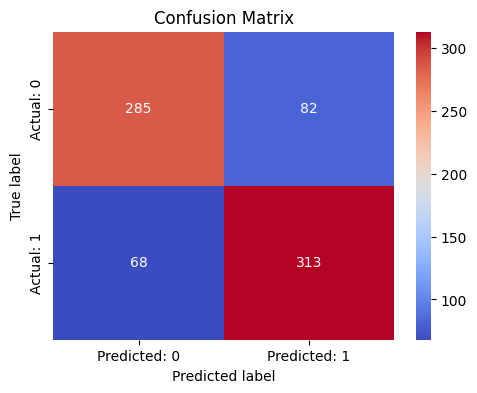

Area under ROC is 0.8685232465832778


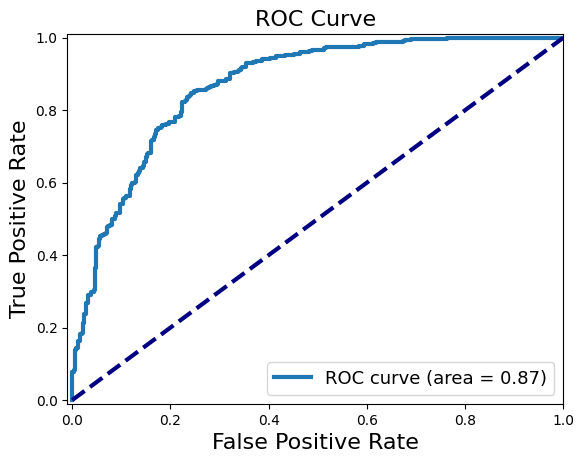



Training SVM...
Results for SVM:
Accuracy is  0.7780748663101604
Recall is 0.7821522309711286
Precision is 0.7821522309711286
F1 score is 0.7821522309711286
              precision    recall  f1-score   support

           0       0.77      0.77      0.77       367
           1       0.78      0.78      0.78       381

    accuracy                           0.78       748
   macro avg       0.78      0.78      0.78       748
weighted avg       0.78      0.78      0.78       748



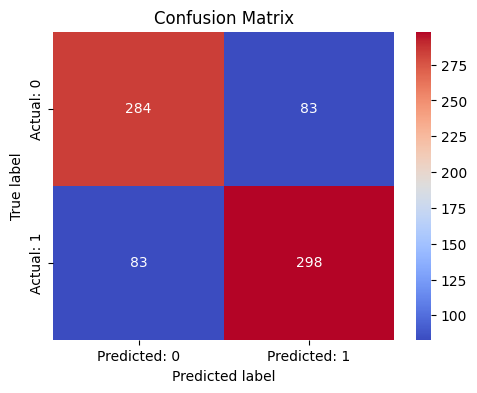

Area under ROC is 0.8472469551660265


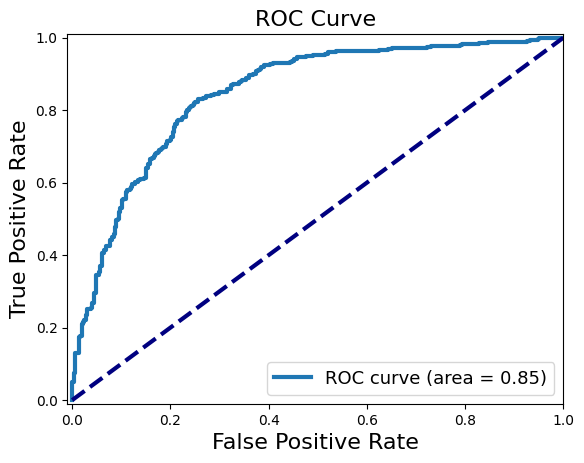



Training KNN...
Results for KNN:
Accuracy is  0.7459893048128342
Recall is 0.8320209973753281
Precision is 0.7155756207674944
F1 score is 0.7694174757281553
              precision    recall  f1-score   support

           0       0.79      0.66      0.72       367
           1       0.72      0.83      0.77       381

    accuracy                           0.75       748
   macro avg       0.75      0.74      0.74       748
weighted avg       0.75      0.75      0.74       748



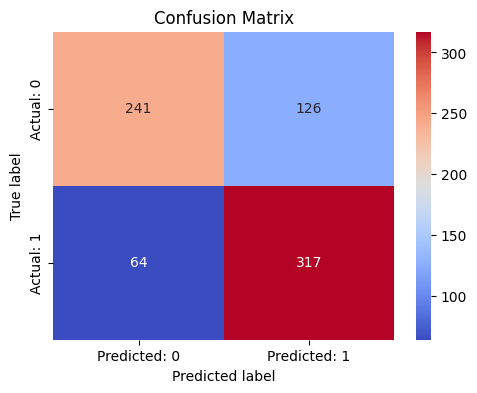

Area under ROC is 0.8112989622891145


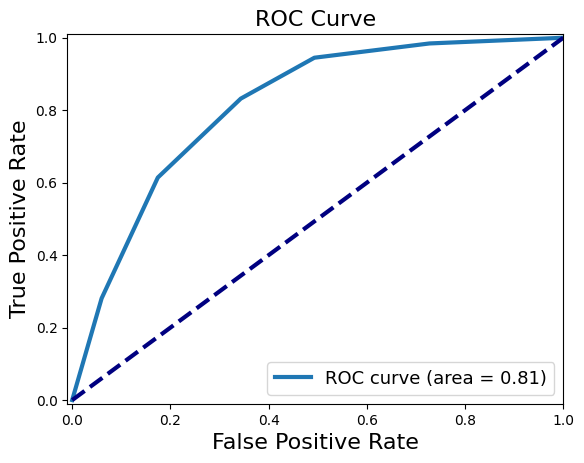



Training Naive Bayes...
Results for Naive Bayes:
Accuracy is  0.7700534759358288
Recall is 0.8083989501312336
Precision is 0.7567567567567568
F1 score is 0.7817258883248731
              precision    recall  f1-score   support

           0       0.79      0.73      0.76       367
           1       0.76      0.81      0.78       381

    accuracy                           0.77       748
   macro avg       0.77      0.77      0.77       748
weighted avg       0.77      0.77      0.77       748



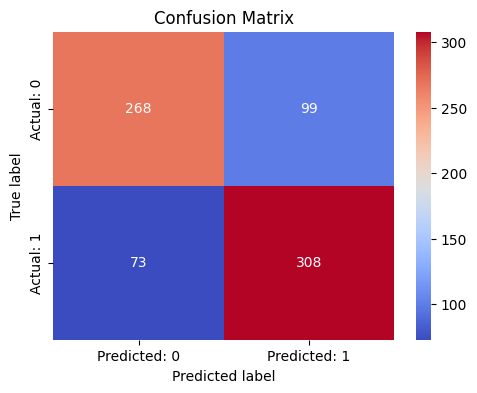

Area under ROC is 0.8356826650074736


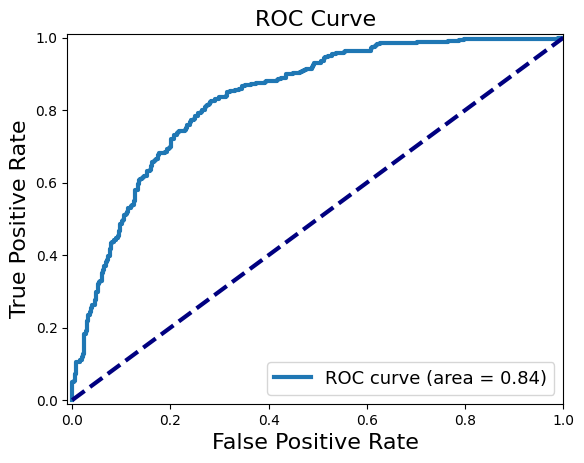



Training Neural Network...
Results for Neural Network:
Accuracy is  0.7553475935828877
Recall is 0.7716535433070866
Precision is 0.7538461538461538
F1 score is 0.7626459143968871
              precision    recall  f1-score   support

           0       0.76      0.74      0.75       367
           1       0.75      0.77      0.76       381

    accuracy                           0.76       748
   macro avg       0.76      0.76      0.76       748
weighted avg       0.76      0.76      0.76       748



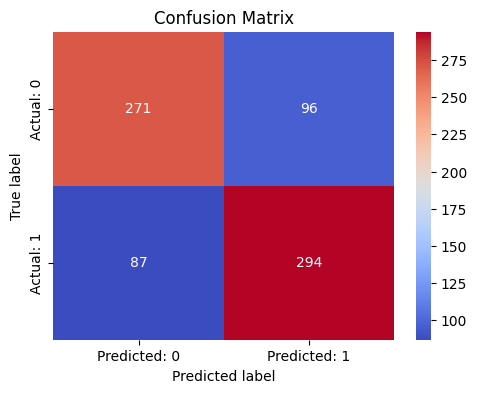

Area under ROC is 0.8319494804293878


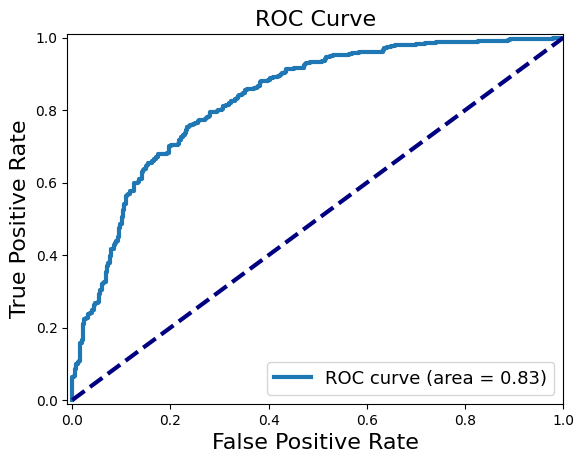



Training LightGBM...
[LightGBM] [Info] Number of positive: 1488, number of negative: 1502
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 999
[LightGBM] [Info] Number of data points in the train set: 2990, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.497659 -> initscore=-0.009365
[LightGBM] [Info] Start training from score -0.009365
Results for LightGBM:
Accuracy is  0.7927807486631016
Recall is 0.8083989501312336
Precision is 0.7897435897435897
F1 score is 0.7989623865110247
              precision    recall  f1-score   support

           0       0.80      0.78      0.79       367
           1       0.79      0.81      0.80       381

    accuracy                           0.79       748
   macro avg       0.79      0.79      0.79       748
weigh

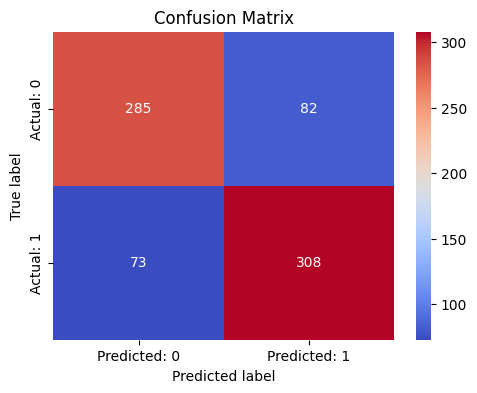

Area under ROC is 0.857852918248979


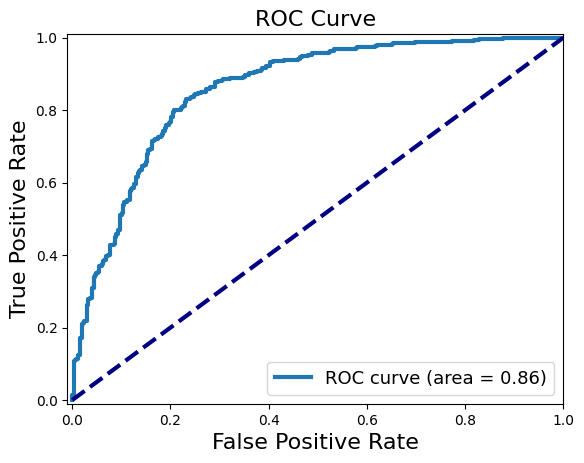



Training XGBoost...
Results for XGBoost:
Accuracy is  0.7700534759358288
Recall is 0.7979002624671916
Precision is 0.7619047619047619
F1 score is 0.7794871794871795
              precision    recall  f1-score   support

           0       0.78      0.74      0.76       367
           1       0.76      0.80      0.78       381

    accuracy                           0.77       748
   macro avg       0.77      0.77      0.77       748
weighted avg       0.77      0.77      0.77       748



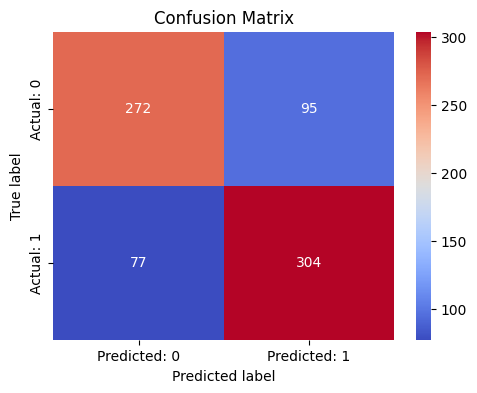

Area under ROC is 0.8360187946533931


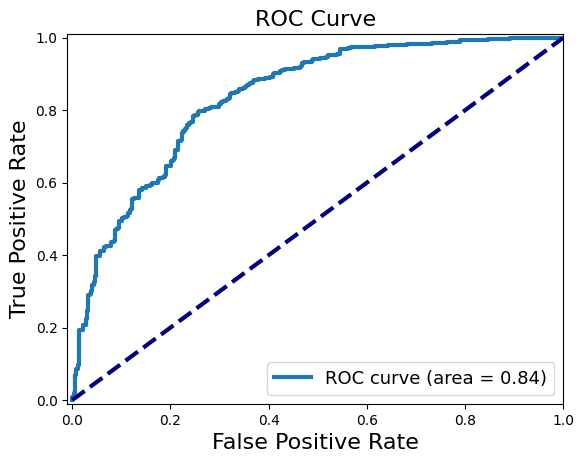



Training Cat Boost...
Results for Cat Boost:
Accuracy is  0.7874331550802139
Recall is 0.8057742782152231
Precision is 0.7831632653061225
F1 score is 0.7943078913324708
              precision    recall  f1-score   support

           0       0.79      0.77      0.78       367
           1       0.78      0.81      0.79       381

    accuracy                           0.79       748
   macro avg       0.79      0.79      0.79       748
weighted avg       0.79      0.79      0.79       748



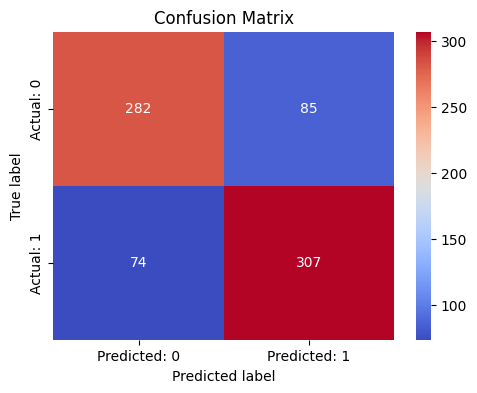

Area under ROC is 0.8666924127672051


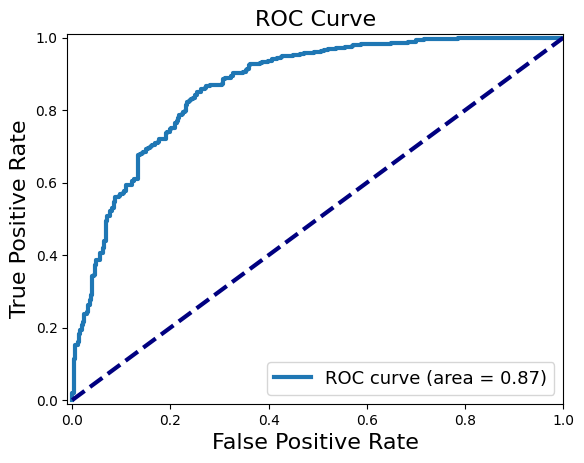

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced, test_size=0.2, random_state=25)

pipeline = Pipeline(steps=[('scaler', StandardScaler())])
X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

for name, classifier in classifiers.items():
    print(f"Training {name}...")
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_test)
    y_pred_prob = classifier.predict_proba(X_test)[:, 1]
    print(f"Results for {name}:")
    evaluate(y_test, y_pred, y_pred_prob)
    print("\n" + "="*60 + "\n")

best model is Gradient Boosting acc 79.9 roc 87

##### Voting Classifier

[LightGBM] [Info] Number of positive: 1488, number of negative: 1502
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 999
[LightGBM] [Info] Number of data points in the train set: 2990, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.497659 -> initscore=-0.009365
[LightGBM] [Info] Start training from score -0.009365
Accuracy is  0.7927807486631016
Recall is 0.8136482939632546
Precision is 0.7868020304568528
F1 score is 0.8
              precision    recall  f1-score   support

           0       0.80      0.77      0.79       367
           1       0.79      0.81      0.80       381

    accuracy                           0.79       748
   macro avg       0.79      0.79      0.79       748
weighted avg       0.79      0.79      0.79       748



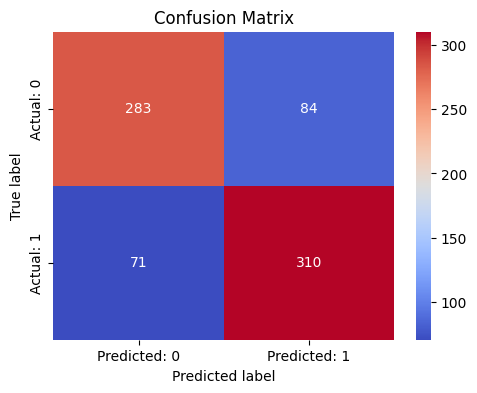

Area under ROC is 0.8666924127672051


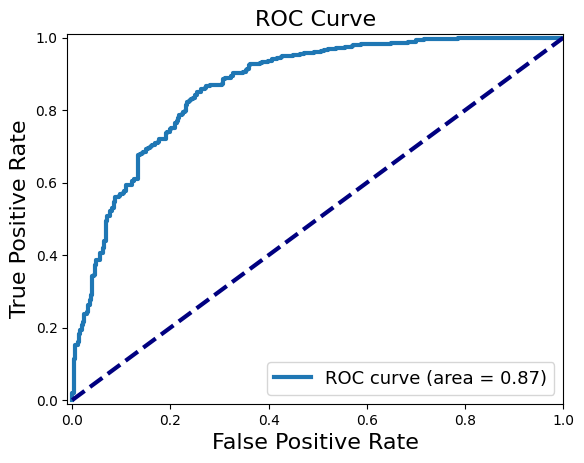

In [ ]:
# Voting Classifier

classifiers2 = [
    # ('Logistic Regression', LogisticRegression(random_state=25)),
    # ('Decision Tree', DecisionTreeClassifier(random_state=25)),
    # ('Random Forest', RandomForestClassifier(random_state=25)),
    ('Gradient Boosting', GradientBoostingClassifier(random_state=25)),
    # ('SVM', SVC(random_state=25, probability=True)),
    # ('KNN', KNeighborsClassifier()),
    # ('Naive Bayes', GaussianNB()),
    # ('Neural Network', MLPClassifier(random_state=25)),
    # ('XGBoost', XGBClassifier(random_state=25)),
    ('LightGBM', LGBMClassifier(random_state=25)),
    ('Cat Boost', CatBoostClassifier(verbose=False,random_state=42, iterations= 2000))
]

voting_regressor = VotingClassifier(estimators=classifiers2)
voting_pipeline = Pipeline([
    ('model', voting_regressor)
])
voting_pipeline.fit(X_train, y_train)
y_pred = voting_pipeline.predict(X_test)
y_pred_prob = classifier.predict_proba(X_test)[:, 1]
evaluate(y_test, y_pred,y_pred_prob)

#####  Feature Engineering

In [ ]:
# increase ROC by creating features

def create_feature_interaction(df):
    df['tenure_times_monthlycharges'] = df['tenure'] * df['MonthlyCharges']
    return df

def apply_feature_transformations(df):
    df['tenure_squared'] = df['tenure'] ** 2
    return df

categorical_features = ['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines',
                        'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
                        'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod']
numerical_features = ['tenure', 'MonthlyCharges', 'TotalCharges']

numerical_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')), 
    ('scaler', StandardScaler())  
])

categorical_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),  
    ('onehot', OneHotEncoder(handle_unknown='ignore'))  
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_pipeline, numerical_features),
        ('cat', categorical_pipeline, categorical_features)
    ])

pipeline = Pipeline(steps=[
    ('interaction', FunctionTransformer(create_feature_interaction)),
    ('transformation', FunctionTransformer(apply_feature_transformations)),
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(random_state=25))
])


In [ ]:
pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'ROC AUC: {roc_auc}')

Accuracy: 0.8062455642299503
ROC AUC: 0.7205095709974094


##### GridSearch

In [ ]:
# Use the best parameters found by GridSearchCV
best_params = {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 300}

pipeline = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('classifier', RandomForestClassifier(random_state=25))
])

param_grid = {
    'classifier__n_estimators': [100, 200, 300], 
    'classifier__max_depth': [None, 10, 20],  
    'classifier__min_samples_split': [2, 5, 10], 
    'classifier__min_samples_leaf': [1, 2, 4],  
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='roc_auc')
grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)
print("Best ROC AUC score found: ", grid_search.best_score_)

y_pred = grid_search.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'ROC AUC: {roc_auc}')

Best parameters found:  {'classifier__max_depth': 10, 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200}
Best ROC AUC score found:  0.8406595893506456
Accuracy: 0.8005677785663591
ROC AUC: 0.6994297100453484


In [ ]:
# Use the best parameters found by GridSearchCV
best_params = {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 300}

pipeline = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('classifier', RandomForestClassifier(random_state=25, **best_params))
])

pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'ROC AUC: {roc_auc}')

Accuracy: 0.8041163946061036
ROC AUC: 0.7018663572188377


##### features selection

In [ ]:
X_selected = X_balanced[selected_features]
y = y_balanced

X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced, test_size=0.2, random_state=25)
# using only selected features
X_train_selected, X_test_selected = X_train[selected_features], X_test[selected_features]


Training Logistic Regression...
Results for Logistic Regression:
Accuracy is  0.7687165775401069
Recall is 0.821522309711286
Precision is 0.7488038277511961
F1 score is 0.7834793491864831
              precision    recall  f1-score   support

           0       0.79      0.71      0.75       367
           1       0.75      0.82      0.78       381

    accuracy                           0.77       748
   macro avg       0.77      0.77      0.77       748
weighted avg       0.77      0.77      0.77       748



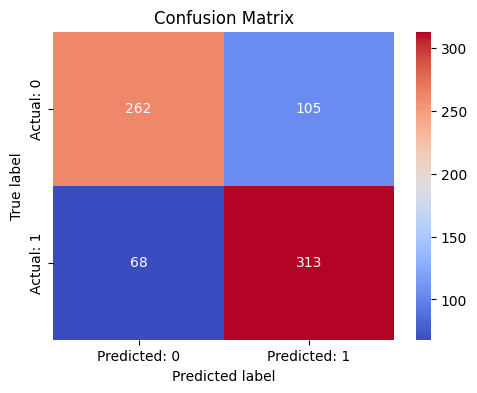

Area under ROC is 0.8596980554542399


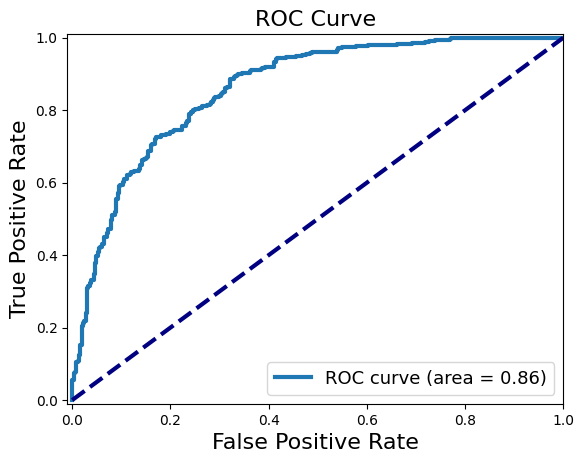



Training Decision Tree...
Results for Decision Tree:
Accuracy is  0.6911764705882353
Recall is 0.7112860892388452
Precision is 0.6913265306122449
F1 score is 0.701164294954722
              precision    recall  f1-score   support

           0       0.69      0.67      0.68       367
           1       0.69      0.71      0.70       381

    accuracy                           0.69       748
   macro avg       0.69      0.69      0.69       748
weighted avg       0.69      0.69      0.69       748



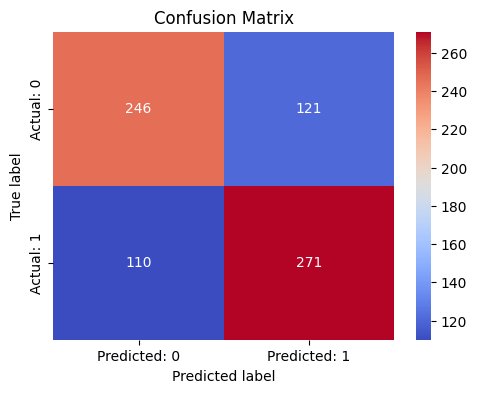

Area under ROC is 0.6903995651769687


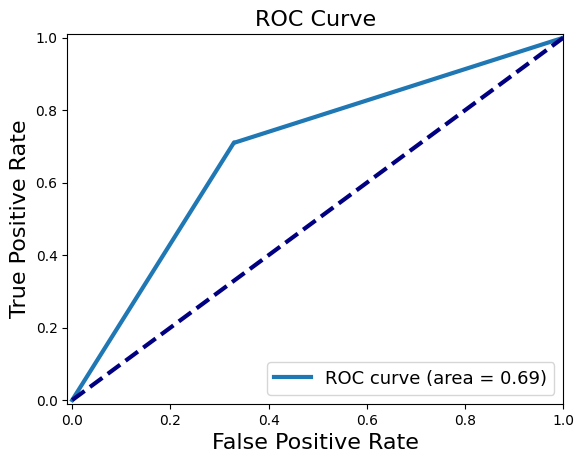



Training Random Forest...
Results for Random Forest:
Accuracy is  0.7847593582887701
Recall is 0.7926509186351706
Precision is 0.7864583333333334
F1 score is 0.7895424836601308
              precision    recall  f1-score   support

           0       0.78      0.78      0.78       367
           1       0.79      0.79      0.79       381

    accuracy                           0.78       748
   macro avg       0.78      0.78      0.78       748
weighted avg       0.78      0.78      0.78       748



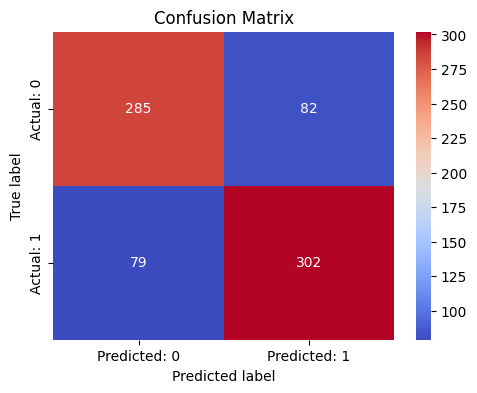

Area under ROC is 0.8557717751221151


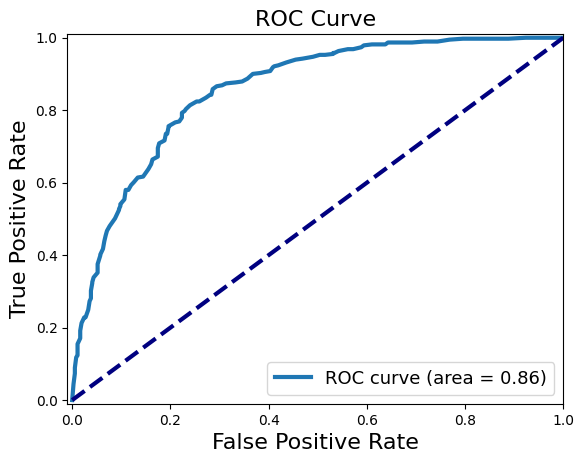



Training Gradient Boosting...
Results for Gradient Boosting:
Accuracy is  0.7941176470588235
Recall is 0.8241469816272966
Precision is 0.7830423940149626
F1 score is 0.80306905370844
              precision    recall  f1-score   support

           0       0.81      0.76      0.78       367
           1       0.78      0.82      0.80       381

    accuracy                           0.79       748
   macro avg       0.79      0.79      0.79       748
weighted avg       0.79      0.79      0.79       748



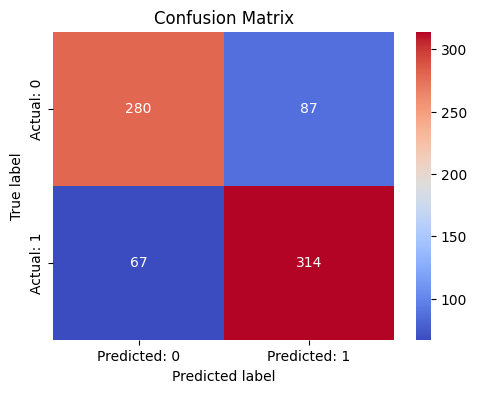

Area under ROC is 0.8706937858925672


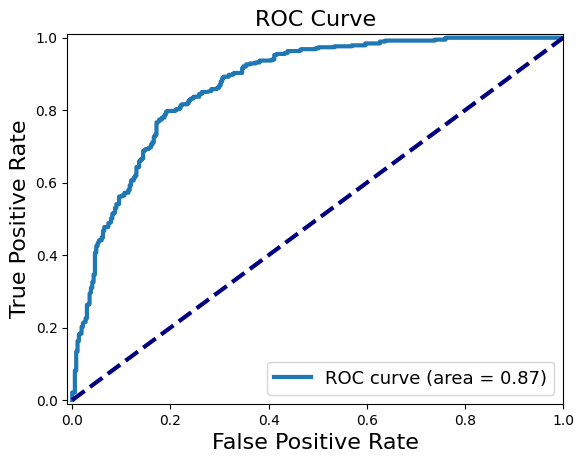



Training SVM...
Results for SVM:
Accuracy is  0.7740641711229946
Recall is 0.800524934383202
Precision is 0.7663316582914573
F1 score is 0.7830551989730423
              precision    recall  f1-score   support

           0       0.78      0.75      0.76       367
           1       0.77      0.80      0.78       381

    accuracy                           0.77       748
   macro avg       0.77      0.77      0.77       748
weighted avg       0.77      0.77      0.77       748



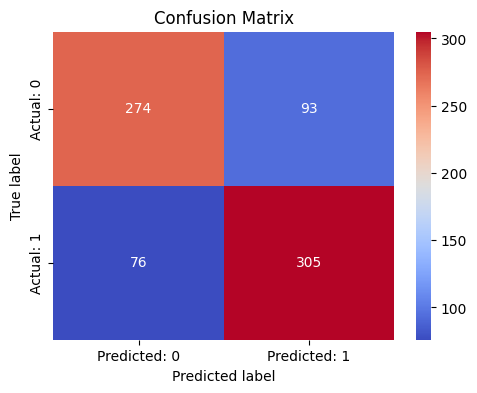

Area under ROC is 0.8401095639611805


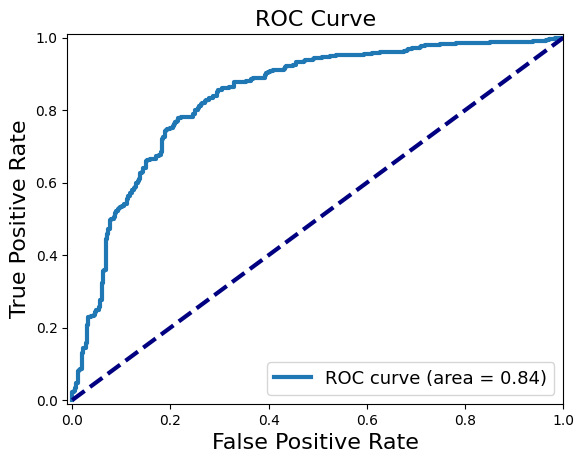



Training KNN...
Results for KNN:
Accuracy is  0.7486631016042781
Recall is 0.7926509186351706
Precision is 0.7347931873479319
F1 score is 0.7626262626262627
              precision    recall  f1-score   support

           0       0.77      0.70      0.73       367
           1       0.73      0.79      0.76       381

    accuracy                           0.75       748
   macro avg       0.75      0.75      0.75       748
weighted avg       0.75      0.75      0.75       748



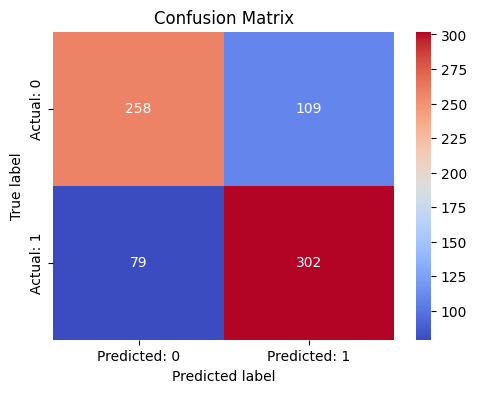

Area under ROC is 0.7996524276427299


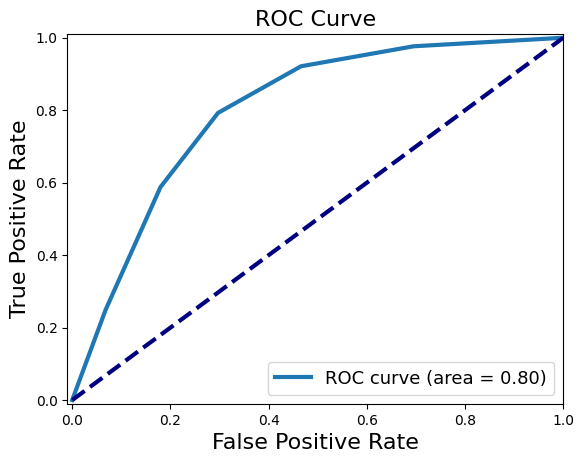



Training Naive Bayes...
Results for Naive Bayes:
Accuracy is  0.7727272727272727
Recall is 0.821522309711286
Precision is 0.7542168674698795
F1 score is 0.78643216080402
              precision    recall  f1-score   support

           0       0.80      0.72      0.76       367
           1       0.75      0.82      0.79       381

    accuracy                           0.77       748
   macro avg       0.78      0.77      0.77       748
weighted avg       0.77      0.77      0.77       748



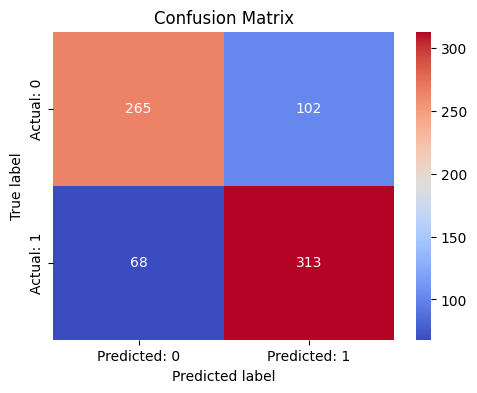

Area under ROC is 0.8433778883906542


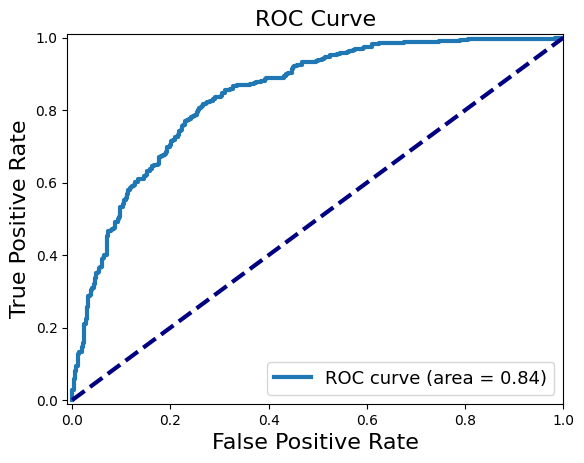



Training Neural Network...
Results for Neural Network:
Accuracy is  0.7566844919786097
Recall is 0.7874015748031497
Precision is 0.7481296758104738
F1 score is 0.7672634271099745
              precision    recall  f1-score   support

           0       0.77      0.72      0.75       367
           1       0.75      0.79      0.77       381

    accuracy                           0.76       748
   macro avg       0.76      0.76      0.76       748
weighted avg       0.76      0.76      0.76       748



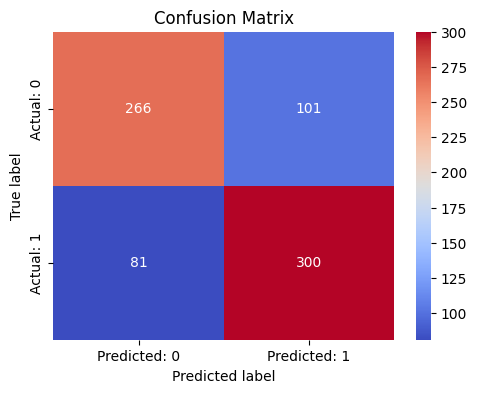

Area under ROC is 0.8518383430953965


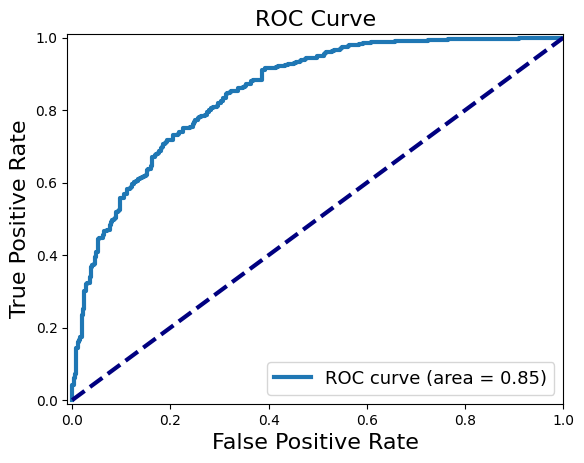



Training LightGBM...
[LightGBM] [Info] Number of positive: 1488, number of negative: 1502
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 710
[LightGBM] [Info] Number of data points in the train set: 2990, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.497659 -> initscore=-0.009365
[LightGBM] [Info] Start training from score -0.009365
Results for LightGBM:
Accuracy is  0.7847593582887701
Recall is 0.8110236220472441
Precision is 0.7763819095477387
F1 score is 0.7933247753530167
              precision    recall  f1-score   support

           0       0.79      0.76      0.78       367
           1       0.78      0.81      0.79       381

    accuracy                           0.78       748
   macro avg       0.79      0.78      0.78       748
weigh

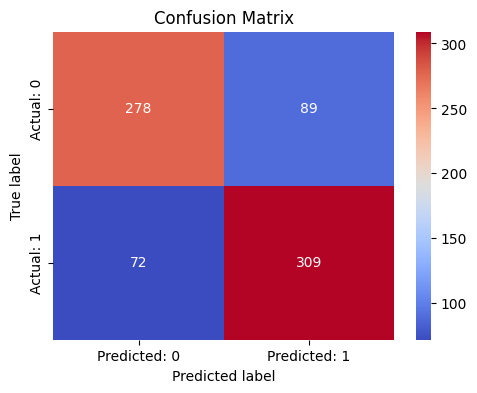

Area under ROC is 0.8604847418595837


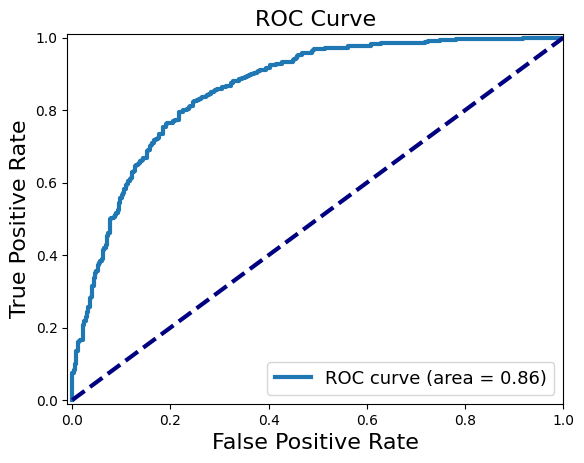



Training XGBoost...
Results for XGBoost:
Accuracy is  0.7606951871657754
Recall is 0.7926509186351706
Precision is 0.7512437810945274
F1 score is 0.7713920817369092
              precision    recall  f1-score   support

           0       0.77      0.73      0.75       367
           1       0.75      0.79      0.77       381

    accuracy                           0.76       748
   macro avg       0.76      0.76      0.76       748
weighted avg       0.76      0.76      0.76       748



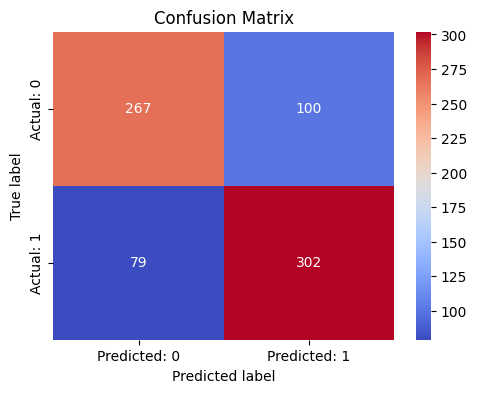

Area under ROC is 0.8455412760053493


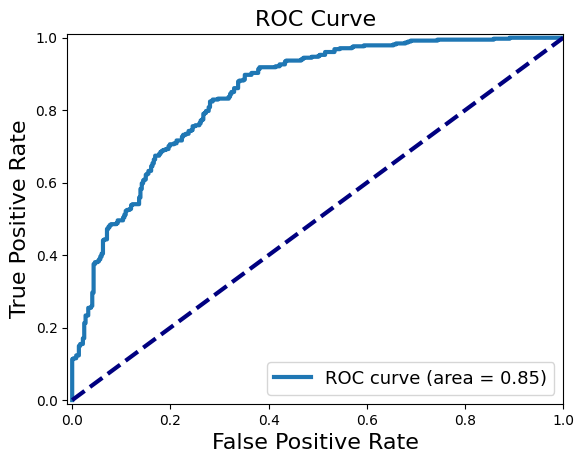



Training Cat Boost...
Results for Cat Boost:
Accuracy is  0.8048128342245989
Recall is 0.8372703412073491
Precision is 0.7915632754342432
F1 score is 0.8137755102040817
              precision    recall  f1-score   support

           0       0.82      0.77      0.79       367
           1       0.79      0.84      0.81       381

    accuracy                           0.80       748
   macro avg       0.81      0.80      0.80       748
weighted avg       0.81      0.80      0.80       748



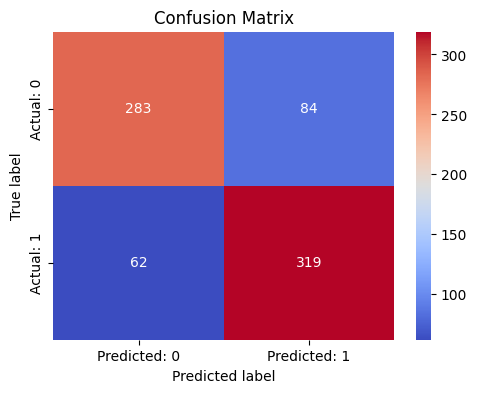

Area under ROC is 0.8657948750956539


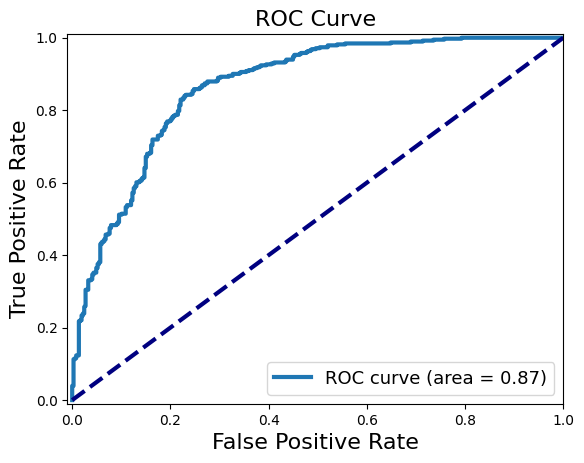

In [ ]:
pipeline = Pipeline(steps=[('scaler', StandardScaler())])
X_train_selected = pipeline.fit_transform(X_train_selected)
X_test_selected = pipeline.transform(X_test_selected)

for name, classifier in classifiers.items():
    print(f"Training {name}...")
    classifier.fit(X_train_selected, y_train)
    y_pred = classifier.predict(X_test_selected)
    y_pred_prob = classifier.predict_proba(X_test_selected)[:, 1]
    print(f"Results for {name}:")
    evaluate(y_test, y_pred,y_pred_prob)
    print("\n" + "="*60 + "\n")

best model is cat boost acc 80.4 , roc 87

#### Over Sampling

In [ ]:
# 2. Balance dataset with 2:1 ratio of majority to minority samples
data_majority_double = resample(data_majority,
                                replace=False,    
                                n_samples=len(data_minority) * 2,  
                                random_state=42)

data_double_balanced = pd.concat([data_majority_double, data_minority])

X_double_balanced = data_double_balanced.drop('Churn', axis=1)
y_double_balanced = data_double_balanced['Churn']



Balanced Dataset (2:1) Evaluation
Accuracy is  0.7789661319073083
Recall is 0.653211009174312
Precision is 0.660482374768089
F1 score is 0.6568265682656826
              precision    recall  f1-score   support

           0       0.83      0.84      0.84      1138
           1       0.66      0.65      0.66       545

    accuracy                           0.78      1683
   macro avg       0.75      0.75      0.75      1683
weighted avg       0.78      0.78      0.78      1683



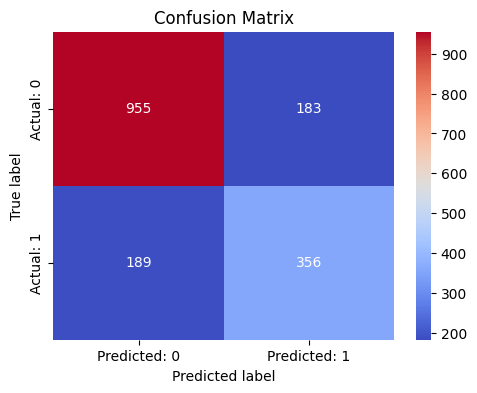

Area under ROC is 0.8495219361184114


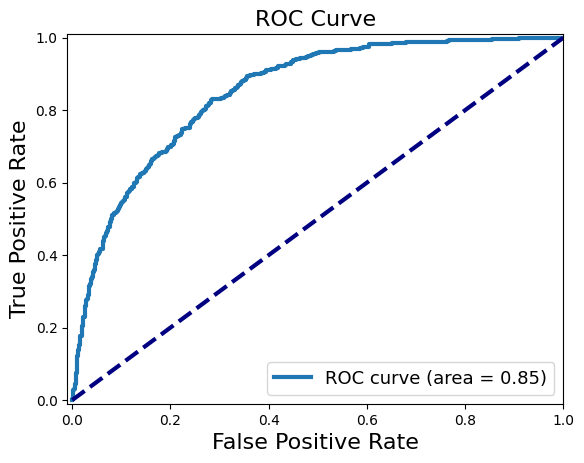

In [ ]:
X_train_dbal, X_test_dbal, y_train_dbal, y_test_dbal = train_test_split(X_double_balanced, y_double_balanced, test_size=0.3, random_state=42)

scaler = StandardScaler()
X_train_dbal = scaler.fit_transform(X_train_dbal)
X_test_dbal = scaler.transform(X_test_dbal)

model_dbal = LogisticRegression(random_state=42)
model_dbal.fit(X_train_dbal, y_train_dbal)

y_pred_dbal = model_dbal.predict(X_test_dbal)
y_pred_prob_dbal = model_dbal.predict_proba(X_test_dbal)[:, 1]

print("\nBalanced Dataset (2:1) Evaluation")
evaluate(y_test_dbal, y_pred_dbal, y_pred_prob_dbal)

Training Logistic Regression...
Results for Logistic Regression:
Accuracy is  0.7887700534759359
Recall is 0.6243243243243243
Precision is 0.7021276595744681
F1 score is 0.6609442060085837
              precision    recall  f1-score   support

           0       0.82      0.87      0.85       752
           1       0.70      0.62      0.66       370

    accuracy                           0.79      1122
   macro avg       0.76      0.75      0.75      1122
weighted avg       0.78      0.79      0.79      1122



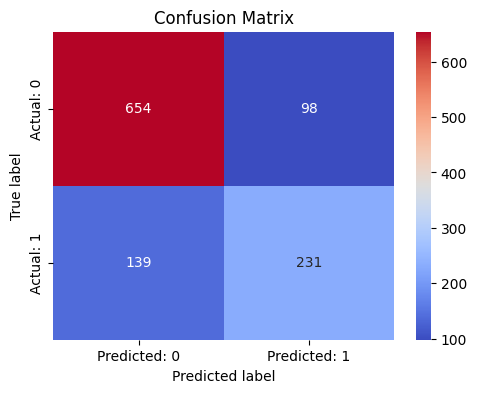

Area under ROC is 0.8580613858539392


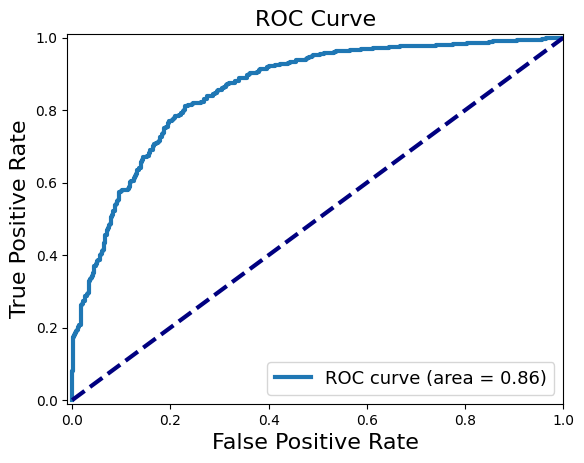



Training Decision Tree...
Results for Decision Tree:
Accuracy is  0.6880570409982175
Recall is 0.5405405405405406
Precision is 0.5263157894736842
F1 score is 0.5333333333333333
              precision    recall  f1-score   support

           0       0.77      0.76      0.77       752
           1       0.53      0.54      0.53       370

    accuracy                           0.69      1122
   macro avg       0.65      0.65      0.65      1122
weighted avg       0.69      0.69      0.69      1122



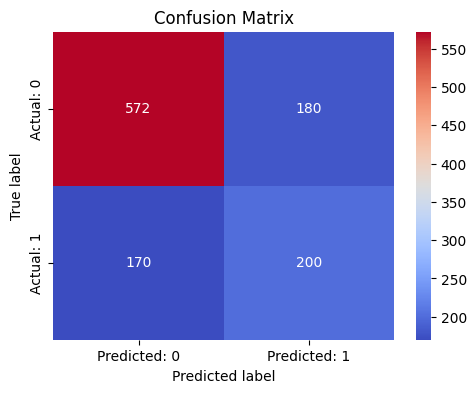

Area under ROC is 0.6505894192064404


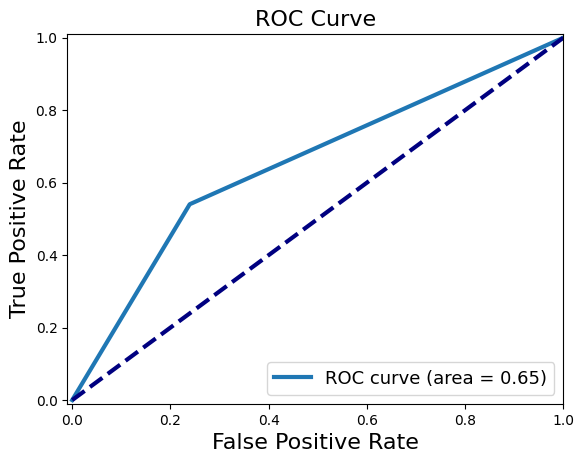



Training Random Forest...
Results for Random Forest:
Accuracy is  0.7887700534759359
Recall is 0.5945945945945946
Precision is 0.7166123778501629
F1 score is 0.6499261447562777
              precision    recall  f1-score   support

           0       0.82      0.88      0.85       752
           1       0.72      0.59      0.65       370

    accuracy                           0.79      1122
   macro avg       0.77      0.74      0.75      1122
weighted avg       0.78      0.79      0.78      1122



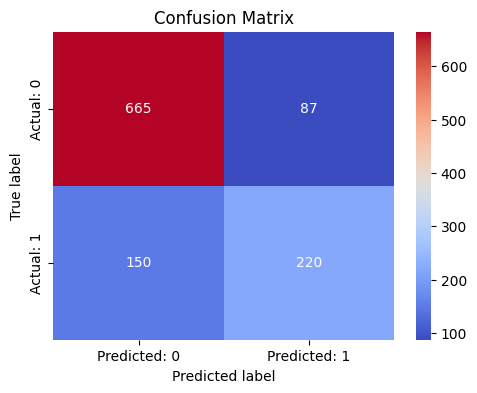

Area under ROC is 0.8560109976998276


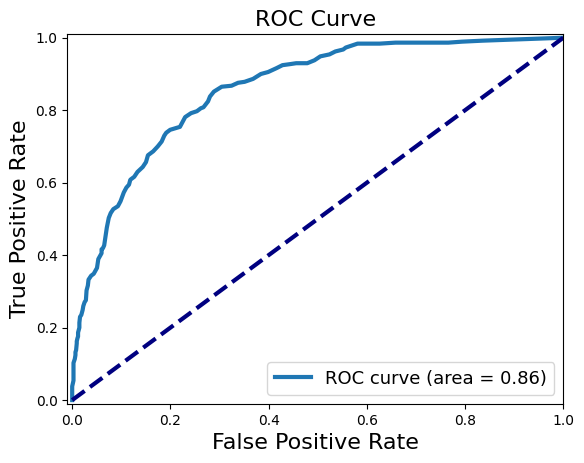



Training Gradient Boosting...
Results for Gradient Boosting:
Accuracy is  0.7932263814616756
Recall is 0.6081081081081081
Precision is 0.7211538461538461
F1 score is 0.6598240469208211
              precision    recall  f1-score   support

           0       0.82      0.88      0.85       752
           1       0.72      0.61      0.66       370

    accuracy                           0.79      1122
   macro avg       0.77      0.75      0.76      1122
weighted avg       0.79      0.79      0.79      1122



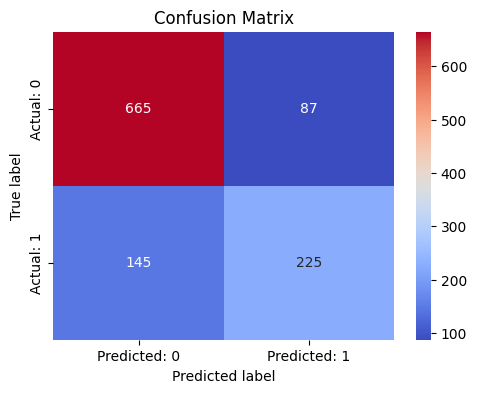

Area under ROC is 0.8608737061529614


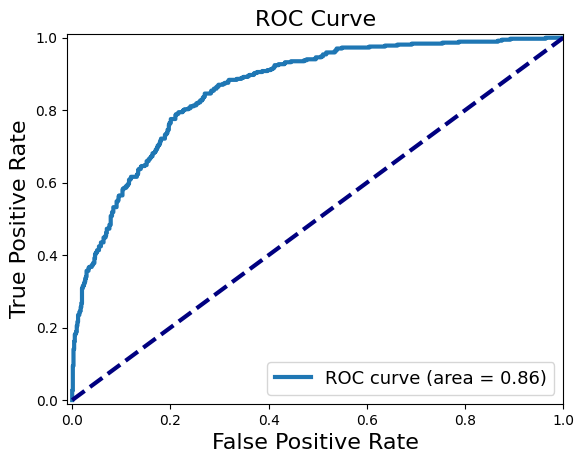



Training SVM...
Results for SVM:
Accuracy is  0.7807486631016043
Recall is 0.5864864864864865
Precision is 0.7
F1 score is 0.638235294117647
              precision    recall  f1-score   support

           0       0.81      0.88      0.84       752
           1       0.70      0.59      0.64       370

    accuracy                           0.78      1122
   macro avg       0.76      0.73      0.74      1122
weighted avg       0.77      0.78      0.78      1122



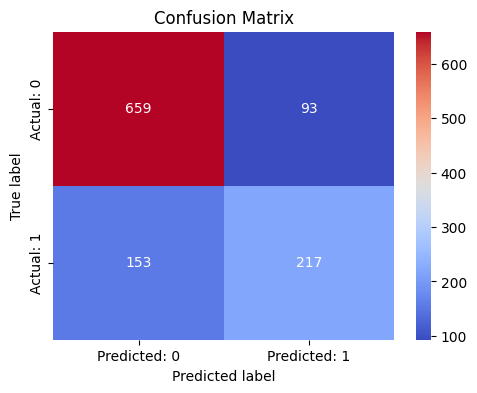

Area under ROC is 0.8376293847038528


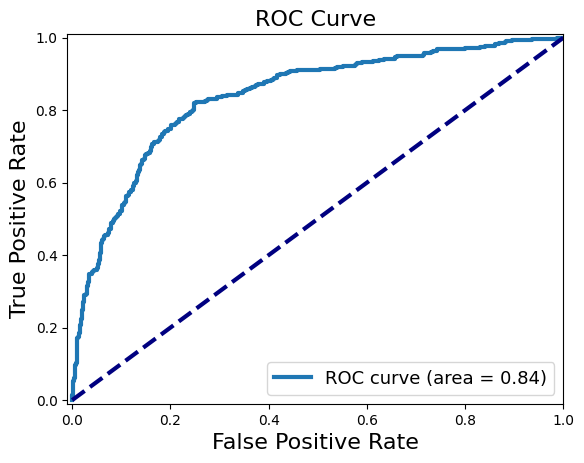



Training KNN...
Results for KNN:
Accuracy is  0.7459893048128342
Recall is 0.6297297297297297
Precision is 0.6115485564304461
F1 score is 0.6205059920106525
              precision    recall  f1-score   support

           0       0.82      0.80      0.81       752
           1       0.61      0.63      0.62       370

    accuracy                           0.75      1122
   macro avg       0.71      0.72      0.71      1122
weighted avg       0.75      0.75      0.75      1122



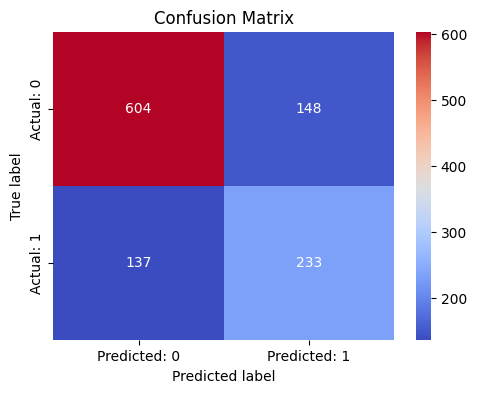

Area under ROC is 0.7951678407130535


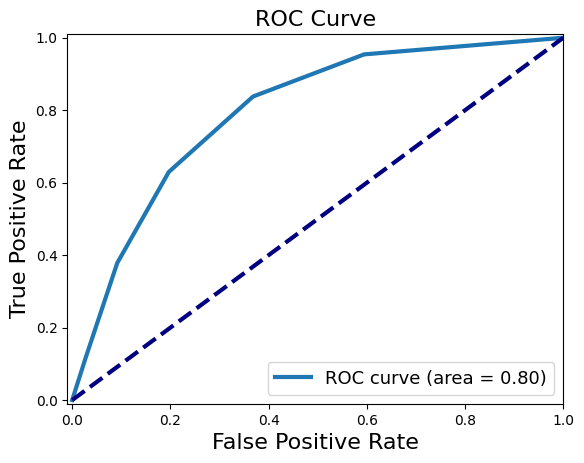



Training Naive Bayes...
Results for Naive Bayes:
Accuracy is  0.7611408199643493
Recall is 0.7810810810810811
Precision is 0.6071428571428571
F1 score is 0.6832151300236406
              precision    recall  f1-score   support

           0       0.87      0.75      0.81       752
           1       0.61      0.78      0.68       370

    accuracy                           0.76      1122
   macro avg       0.74      0.77      0.75      1122
weighted avg       0.79      0.76      0.77      1122



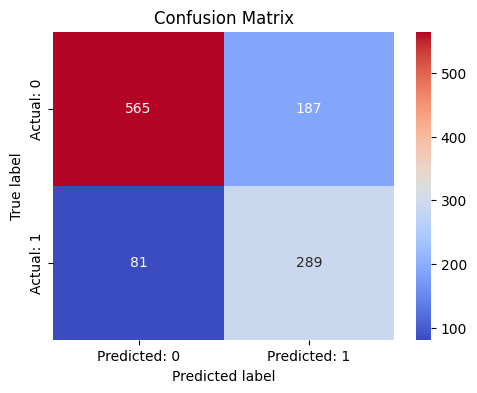

Area under ROC is 0.8376042265669924


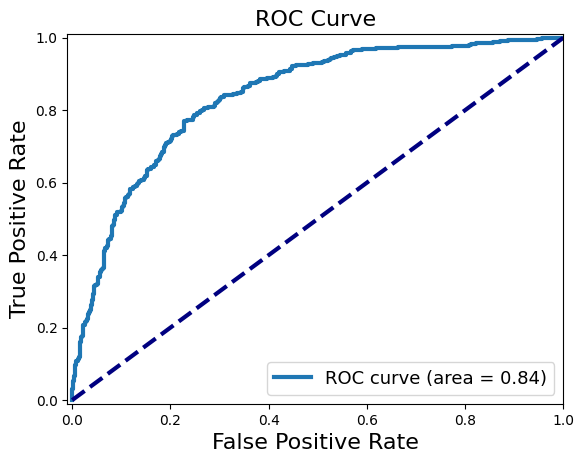



Training Neural Network...
Results for Neural Network:
Accuracy is  0.7593582887700535
Recall is 0.5837837837837838
Precision is 0.6506024096385542
F1 score is 0.6153846153846154
              precision    recall  f1-score   support

           0       0.81      0.85      0.82       752
           1       0.65      0.58      0.62       370

    accuracy                           0.76      1122
   macro avg       0.73      0.71      0.72      1122
weighted avg       0.75      0.76      0.76      1122



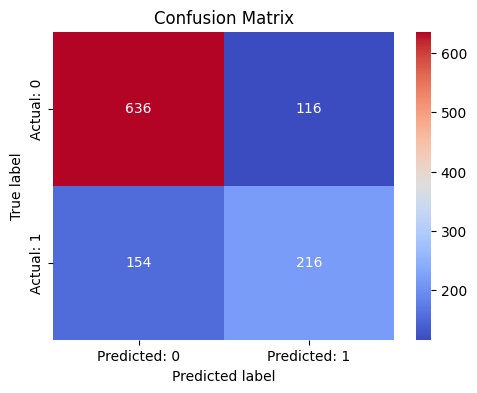

Area under ROC is 0.8291834387579069


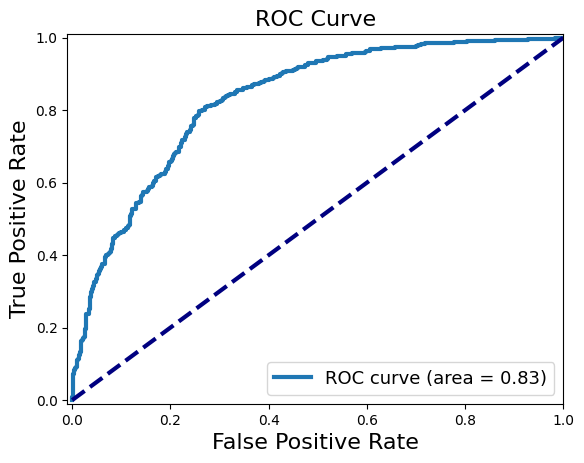



Training LightGBM...
[LightGBM] [Info] Number of positive: 1499, number of negative: 2986
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001123 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 999
[LightGBM] [Info] Number of data points in the train set: 4485, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.334225 -> initscore=-0.689136
[LightGBM] [Info] Start training from score -0.689136
Results for LightGBM:
Accuracy is  0.7754010695187166
Recall is 0.6135135135135135
Precision is 0.6755952380952381
F1 score is 0.6430594900849859
              precision    recall  f1-score   support

           0       0.82      0.86      0.84       752
           1       0.68      0.61      0.64       370

    accuracy                           0.78      1122
   macro avg       0.75      0.73      0.74      1122
weigh

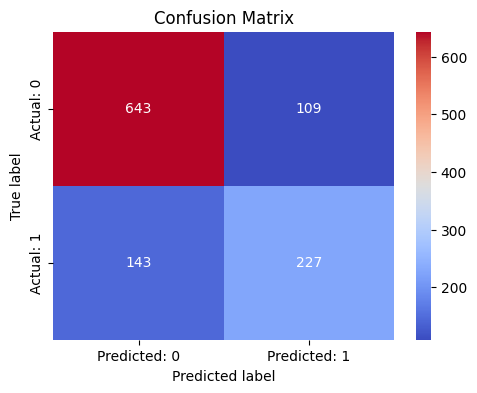

Area under ROC is 0.8550280333525013


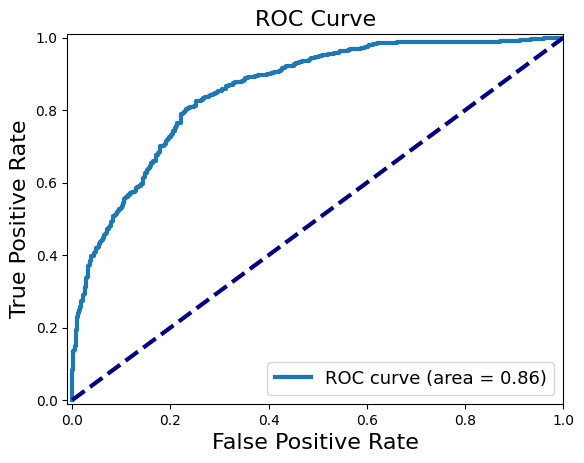



Training XGBoost...
Results for XGBoost:
Accuracy is  0.7611408199643493
Recall is 0.5918918918918918
Precision is 0.6517857142857143
F1 score is 0.6203966005665721
              precision    recall  f1-score   support

           0       0.81      0.84      0.83       752
           1       0.65      0.59      0.62       370

    accuracy                           0.76      1122
   macro avg       0.73      0.72      0.72      1122
weighted avg       0.76      0.76      0.76      1122



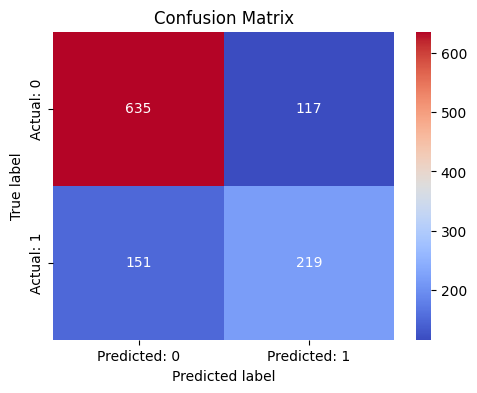

Area under ROC is 0.8314836112708454


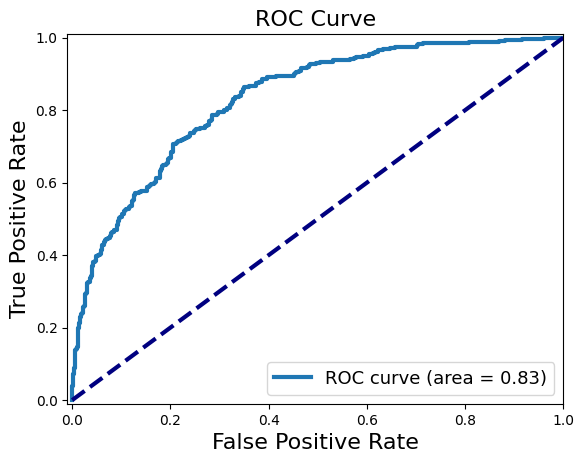



Training Cat Boost...
Results for Cat Boost:
Accuracy is  0.7914438502673797
Recall is 0.6189189189189189
Precision is 0.7111801242236024
F1 score is 0.661849710982659
              precision    recall  f1-score   support

           0       0.82      0.88      0.85       752
           1       0.71      0.62      0.66       370

    accuracy                           0.79      1122
   macro avg       0.77      0.75      0.76      1122
weighted avg       0.79      0.79      0.79      1122



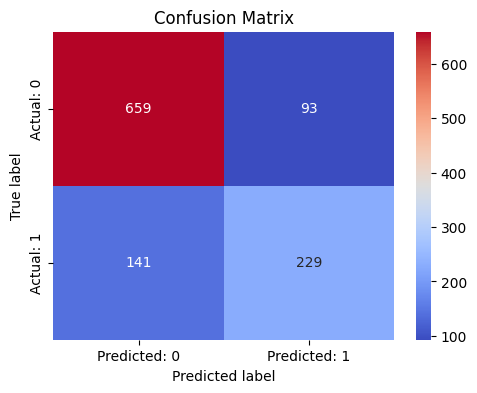

Area under ROC is 0.8583309373202992


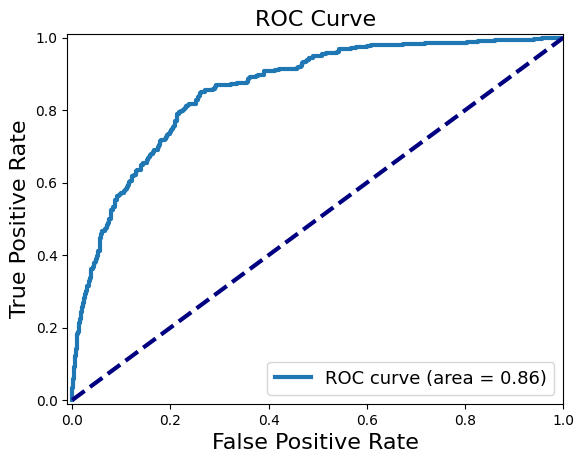

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_double_balanced, y_double_balanced, test_size=0.2, random_state=25)

pipeline = Pipeline(steps=[('scaler', StandardScaler())])
X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

for name, classifier in classifiers.items():
    print(f"Training {name}...")
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_test)
    y_pred_prob = classifier.predict_proba(X_test)[:, 1]
    print(f"Results for {name}:")
    evaluate(y_test, y_pred, y_pred_prob)
    print("\n" + "="*60 + "\n")

best model is Gradient Boosting acc 79.3 , roc *86*

##### Voting Classifier

Accuracy is  0.7941176470588235
Recall is 0.5702702702702702
Precision is 0.7455830388692579
F1 score is 0.6462480857580397
              precision    recall  f1-score   support

           0       0.81      0.90      0.85       752
           1       0.75      0.57      0.65       370

    accuracy                           0.79      1122
   macro avg       0.78      0.74      0.75      1122
weighted avg       0.79      0.79      0.79      1122



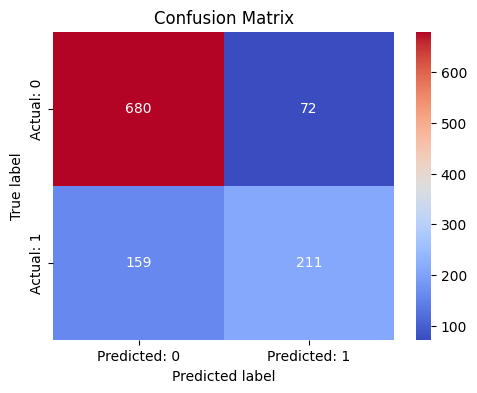

Area under ROC is 0.8583309373202992


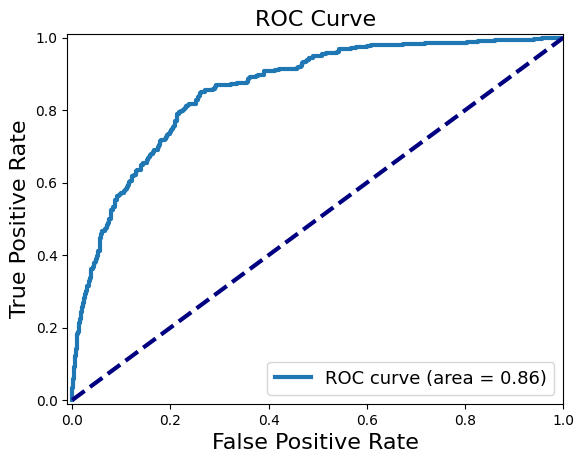

In [ ]:
# Voting Classifier

classifiers2 = [
    # ('Logistic Regression', LogisticRegression(random_state=25)),
    # ('Decision Tree', DecisionTreeClassifier(random_state=25)),
    # ('Random Forest', RandomForestClassifier(random_state=25)),
    ('Gradient Boosting', GradientBoostingClassifier(random_state=25)),
    # ('SVM', SVC(random_state=25, probability=True)),
    # ('KNN', KNeighborsClassifier()),
    # ('Naive Bayes', GaussianNB()),
    # ('Neural Network', MLPClassifier(random_state=25)),
    # ('XGBoost', XGBClassifier(random_state=25)),
    # ('LightGBM', LGBMClassifier(random_state=25)),
    ('Cat Boost', CatBoostClassifier(verbose=False,random_state=42, iterations= 2000))
]

voting_regressor = VotingClassifier(estimators=classifiers2)
voting_pipeline = Pipeline([
    ('model', voting_regressor)
])
voting_pipeline.fit(X_train, y_train)
y_pred = voting_pipeline.predict(X_test)
y_pred_prob = classifier.predict_proba(X_test)[:, 1]
evaluate(y_test, y_pred,y_pred_prob)

##### GridSearch

In [ ]:
# Use the best parameters found by GridSearchCV
best_params = {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 300}

pipeline = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('classifier', RandomForestClassifier(random_state=25))
])

param_grid = {
    'classifier__n_estimators': [100, 200, 300], 
    'classifier__max_depth': [None, 10, 20], 
    'classifier__min_samples_split': [2, 5, 10],  
    'classifier__min_samples_leaf': [1, 2, 4],  
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='roc_auc')
grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)
print("Best ROC AUC score found: ", grid_search.best_score_)

y_pred = grid_search.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'ROC AUC: {roc_auc}')

Best parameters found:  {'classifier__max_depth': 10, 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 200}
Best ROC AUC score found:  0.8405373456495374
Accuracy: 0.7905525846702317
ROC AUC: 0.7483323749281197


In [ ]:
# Use the best parameters found by GridSearchCV
best_params = {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 300}

pipeline = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('classifier', RandomForestClassifier(random_state=25, **best_params))
])

pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'ROC AUC: {roc_auc}')

Accuracy: 0.7914438502673797
ROC AUC: 0.749683726279471


##### features selection

In [ ]:
X_selected = X_double_balanced[selected_features]
y = y_double_balanced

X_train, X_test, y_train, y_test = train_test_split(X_double_balanced, y_double_balanced, test_size=0.2, random_state=25)

X_train_selected, X_test_selected = X_train[selected_features], X_test[selected_features]


Training Logistic Regression...
Results for Logistic Regression:
Accuracy is  0.7869875222816399
Recall is 0.6405405405405405
Precision is 0.6909620991253644
F1 score is 0.6647966339410939
              precision    recall  f1-score   support

           0       0.83      0.86      0.84       752
           1       0.69      0.64      0.66       370

    accuracy                           0.79      1122
   macro avg       0.76      0.75      0.75      1122
weighted avg       0.78      0.79      0.78      1122



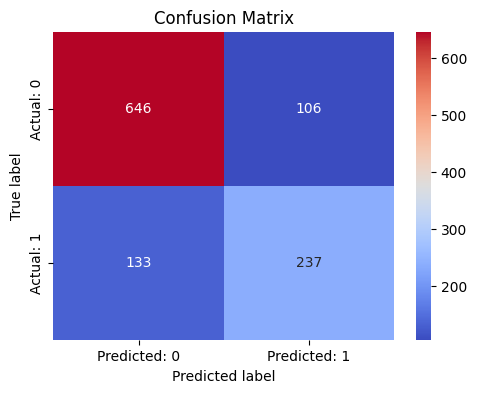

Area under ROC is 0.8564925963197241


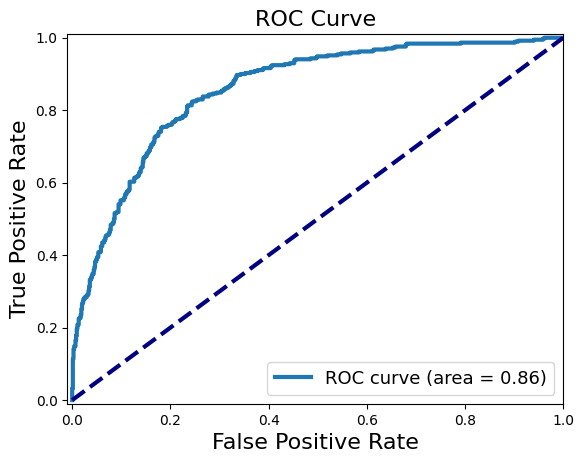



Training Decision Tree...
Results for Decision Tree:
Accuracy is  0.7085561497326203
Recall is 0.5567567567567567
Precision is 0.5582655826558266
F1 score is 0.5575101488497971
              precision    recall  f1-score   support

           0       0.78      0.78      0.78       752
           1       0.56      0.56      0.56       370

    accuracy                           0.71      1122
   macro avg       0.67      0.67      0.67      1122
weighted avg       0.71      0.71      0.71      1122



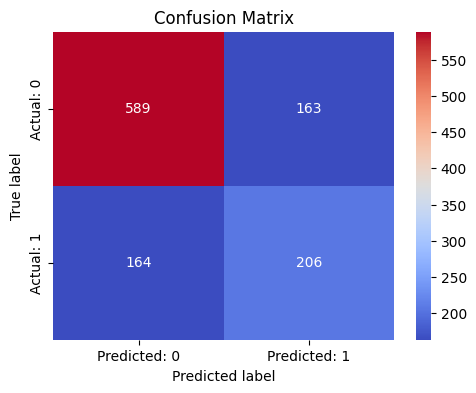

Area under ROC is 0.6697060092006901


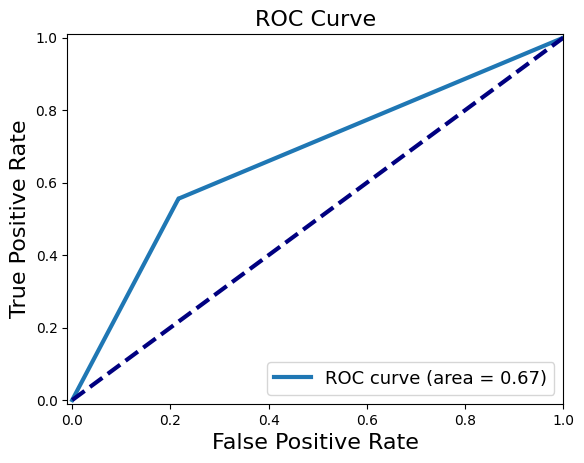



Training Random Forest...
Results for Random Forest:
Accuracy is  0.7771836007130125
Recall is 0.5756756756756757
Precision is 0.696078431372549
F1 score is 0.6301775147928994
              precision    recall  f1-score   support

           0       0.81      0.88      0.84       752
           1       0.70      0.58      0.63       370

    accuracy                           0.78      1122
   macro avg       0.75      0.73      0.74      1122
weighted avg       0.77      0.78      0.77      1122



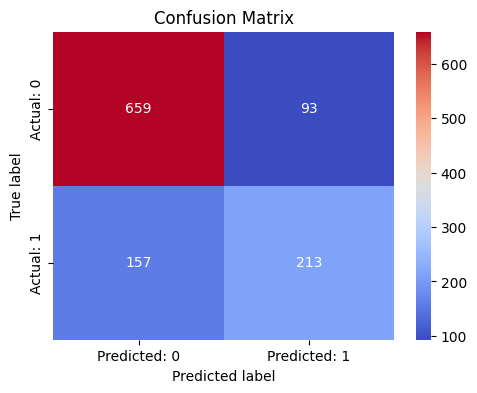

Area under ROC is 0.8430653392754457


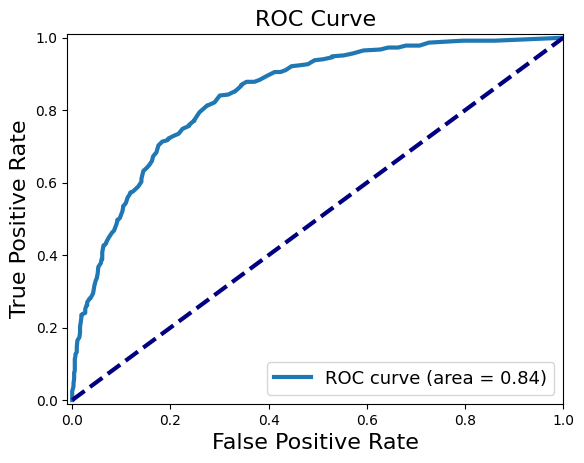



Training Gradient Boosting...
Results for Gradient Boosting:
Accuracy is  0.7950089126559715
Recall is 0.6216216216216216
Precision is 0.71875
F1 score is 0.6666666666666667
              precision    recall  f1-score   support

           0       0.83      0.88      0.85       752
           1       0.72      0.62      0.67       370

    accuracy                           0.80      1122
   macro avg       0.77      0.75      0.76      1122
weighted avg       0.79      0.80      0.79      1122



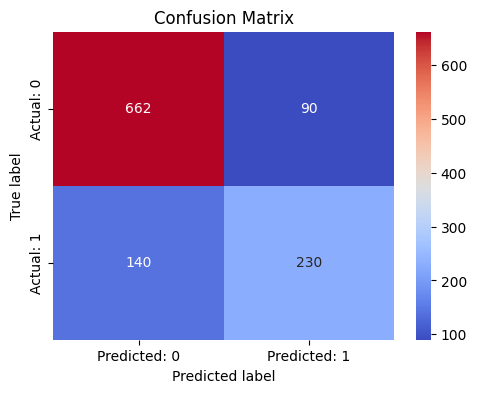

Area under ROC is 0.8621729442208165


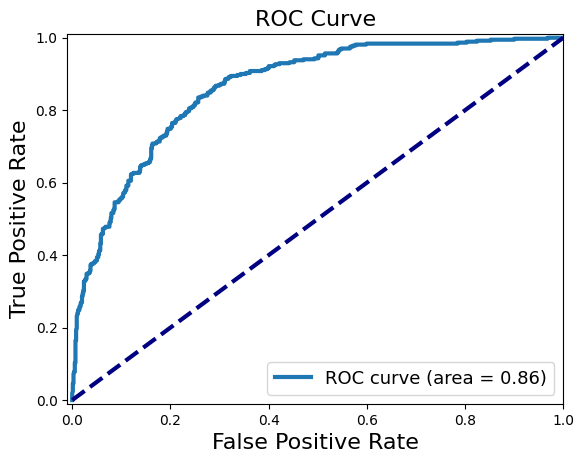



Training SVM...
Results for SVM:
Accuracy is  0.785204991087344
Recall is 0.5972972972972973
Precision is 0.7060702875399361
F1 score is 0.6471449487554904
              precision    recall  f1-score   support

           0       0.82      0.88      0.85       752
           1       0.71      0.60      0.65       370

    accuracy                           0.79      1122
   macro avg       0.76      0.74      0.75      1122
weighted avg       0.78      0.79      0.78      1122



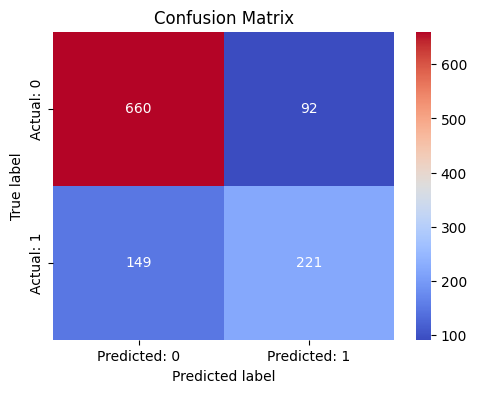

Area under ROC is 0.8321503018976423


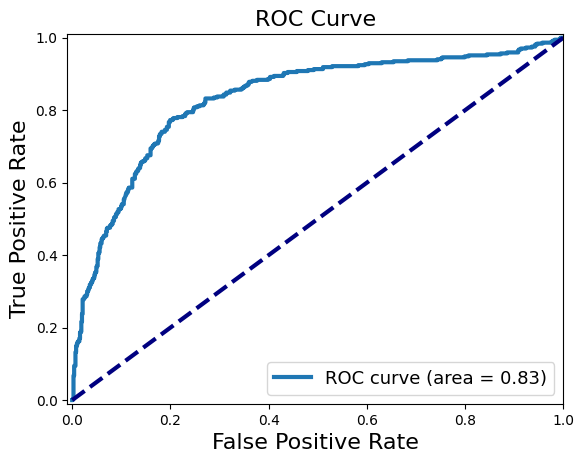



Training KNN...
Results for KNN:
Accuracy is  0.7647058823529411
Recall is 0.6351351351351351
Precision is 0.6456043956043956
F1 score is 0.6403269754768393
              precision    recall  f1-score   support

           0       0.82      0.83      0.83       752
           1       0.65      0.64      0.64       370

    accuracy                           0.76      1122
   macro avg       0.73      0.73      0.73      1122
weighted avg       0.76      0.76      0.76      1122



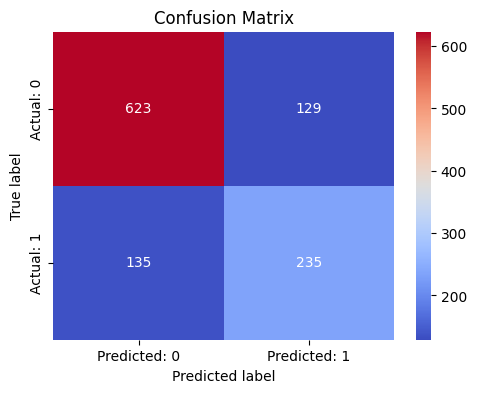

Area under ROC is 0.8044080649798735


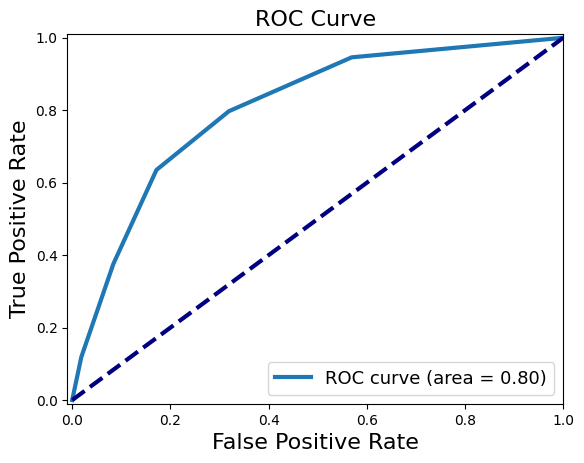



Training Naive Bayes...
Results for Naive Bayes:
Accuracy is  0.7638146167557932
Recall is 0.7756756756756756
Precision is 0.6119402985074627
F1 score is 0.6841477949940404
              precision    recall  f1-score   support

           0       0.87      0.76      0.81       752
           1       0.61      0.78      0.68       370

    accuracy                           0.76      1122
   macro avg       0.74      0.77      0.75      1122
weighted avg       0.79      0.76      0.77      1122



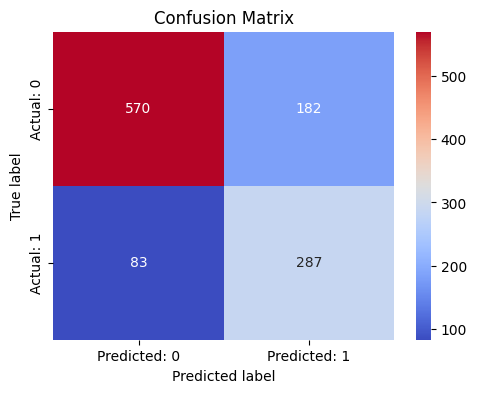

Area under ROC is 0.8440213484761356


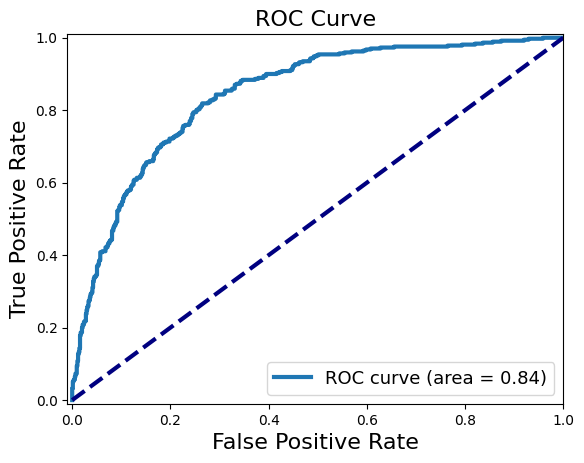



Training Neural Network...
Results for Neural Network:
Accuracy is  0.785204991087344
Recall is 0.6135135135135135
Precision is 0.6984615384615385
F1 score is 0.6532374100719424
              precision    recall  f1-score   support

           0       0.82      0.87      0.84       752
           1       0.70      0.61      0.65       370

    accuracy                           0.79      1122
   macro avg       0.76      0.74      0.75      1122
weighted avg       0.78      0.79      0.78      1122



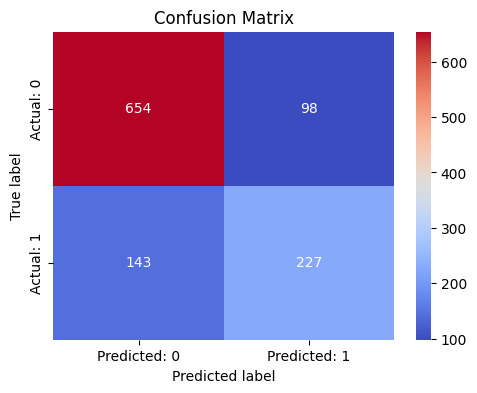

Area under ROC is 0.8495022282921219


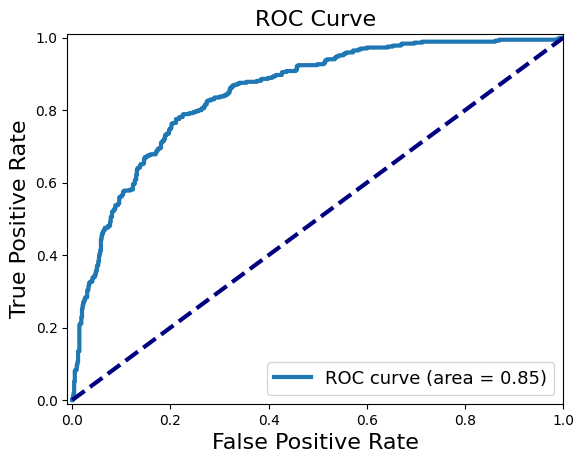



Training LightGBM...
[LightGBM] [Info] Number of positive: 1499, number of negative: 2986
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006194 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 710
[LightGBM] [Info] Number of data points in the train set: 4485, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.334225 -> initscore=-0.689136
[LightGBM] [Info] Start training from score -0.689136
Results for LightGBM:
Accuracy is  0.7825311942959001
Recall is 0.6135135135135135
Precision is 0.6920731707317073
F1 score is 0.650429799426934
              precision    recall  f1-score   support

           0       0.82      0.87      0.84       752
           1       0.69      0.61      0.65       370

    accuracy                           0.78      1122
   macro avg       0.76      0.74      0.75      1122
weight

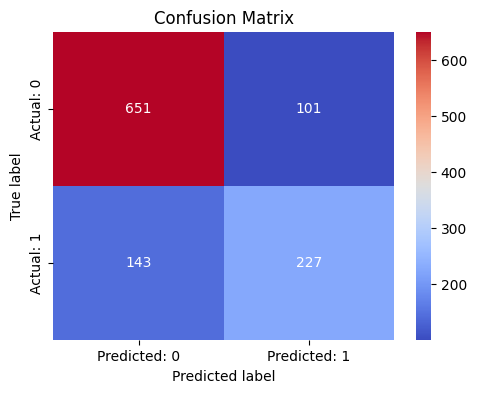

Area under ROC is 0.8469504744105808


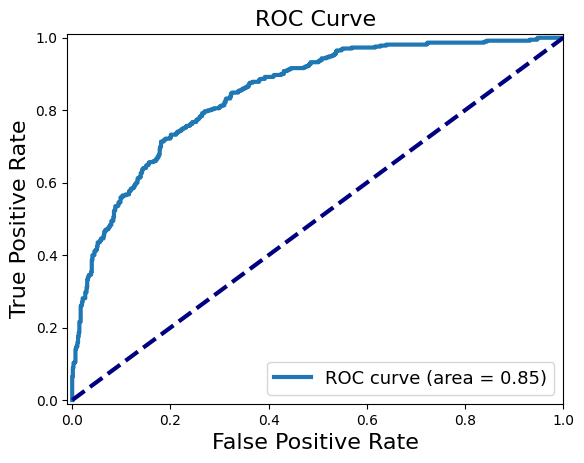



Training XGBoost...
Results for XGBoost:
Accuracy is  0.7691622103386809
Recall is 0.5945945945945946
Precision is 0.668693009118541
F1 score is 0.6294706723891274
              precision    recall  f1-score   support

           0       0.81      0.86      0.83       752
           1       0.67      0.59      0.63       370

    accuracy                           0.77      1122
   macro avg       0.74      0.72      0.73      1122
weighted avg       0.76      0.77      0.77      1122



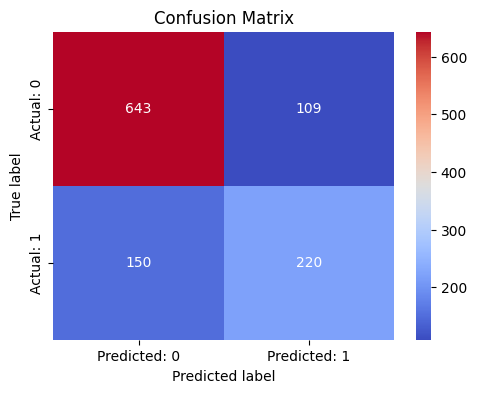

Area under ROC is 0.8385584387579069


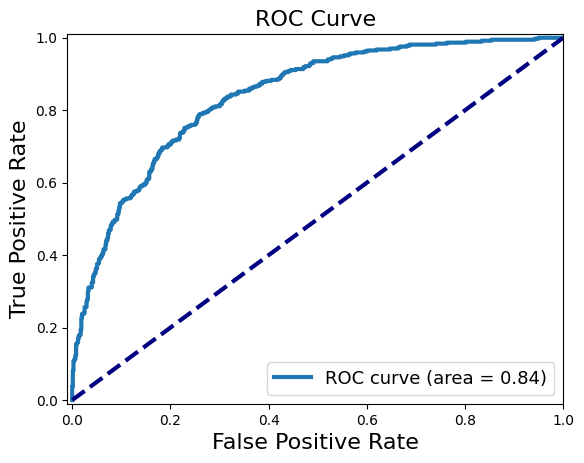



Training Cat Boost...
Results for Cat Boost:
Accuracy is  0.7843137254901961
Recall is 0.6243243243243243
Precision is 0.6916167664670658
F1 score is 0.65625
              precision    recall  f1-score   support

           0       0.82      0.86      0.84       752
           1       0.69      0.62      0.66       370

    accuracy                           0.78      1122
   macro avg       0.76      0.74      0.75      1122
weighted avg       0.78      0.78      0.78      1122



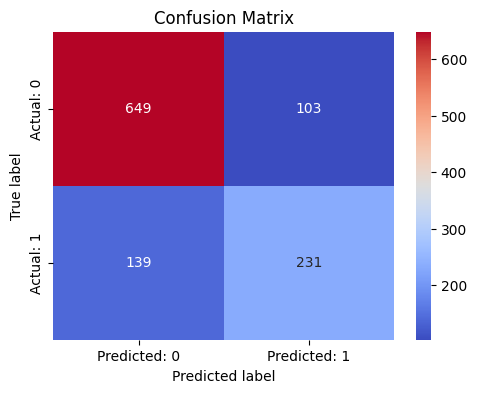

Area under ROC is 0.8582680419781483


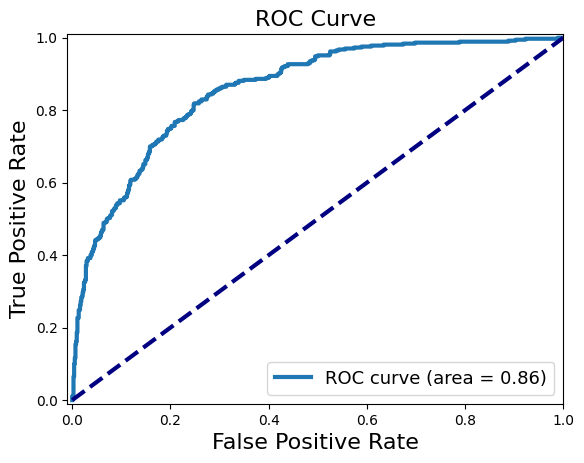

In [ ]:
pipeline = Pipeline(steps=[('scaler', StandardScaler())])
X_train_selected = pipeline.fit_transform(X_train_selected)
X_test_selected = pipeline.transform(X_test_selected)

for name, classifier in classifiers.items():
    print(f"Training {name}...")
    classifier.fit(X_train_selected, y_train)
    y_pred = classifier.predict(X_test_selected)
    y_pred_prob = classifier.predict_proba(X_test_selected)[:, 1]
    print(f"Results for {name}:")
    evaluate(y_test, y_pred,y_pred_prob)
    print("\n" + "="*60 + "\n")

best model is Gradient Boosting acc 79.5 , roc 86

#### before balance Data

Training Logistic Regression...
Results for Logistic Regression:
Accuracy is  0.8126330731014905
Recall is 0.5352480417754569
Precision is 0.7044673539518901
F1 score is 0.6083086053412463
              precision    recall  f1-score   support

           0       0.84      0.92      0.88      1026
           1       0.70      0.54      0.61       383

    accuracy                           0.81      1409
   macro avg       0.77      0.73      0.74      1409
weighted avg       0.80      0.81      0.80      1409



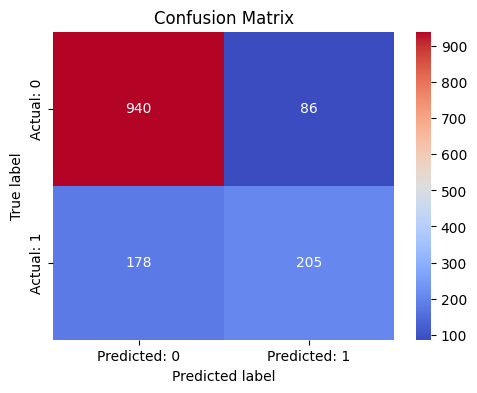

Area under ROC is 0.860066470208012


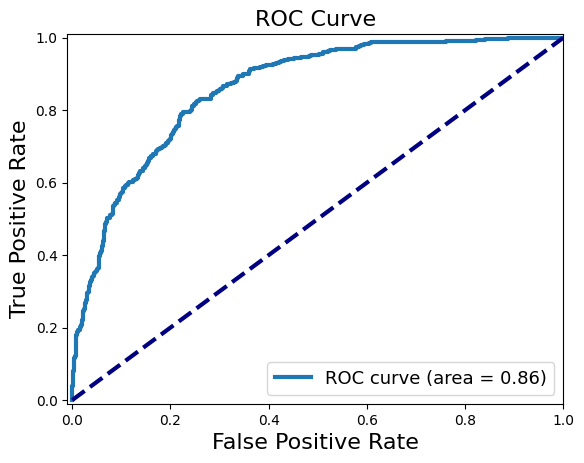



Training Decision Tree...
Results for Decision Tree:
Accuracy is  0.7310149041873669
Recall is 0.5013054830287206
Precision is 0.5052631578947369
F1 score is 0.5032765399737875
              precision    recall  f1-score   support

           0       0.81      0.82      0.82      1026
           1       0.51      0.50      0.50       383

    accuracy                           0.73      1409
   macro avg       0.66      0.66      0.66      1409
weighted avg       0.73      0.73      0.73      1409



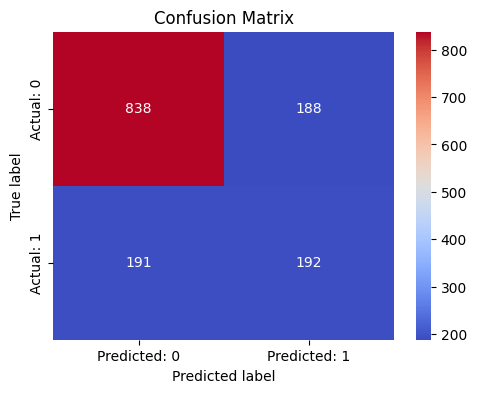

Area under ROC is 0.6590348077911634


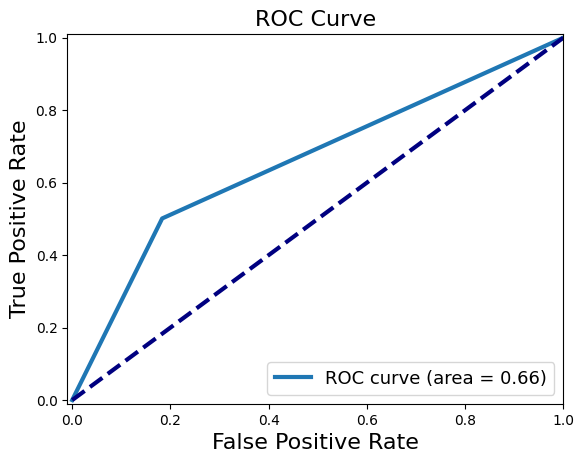



Training Random Forest...
Results for Random Forest:
Accuracy is  0.7927608232789212
Recall is 0.4751958224543081
Precision is 0.6666666666666666
F1 score is 0.5548780487804877
              precision    recall  f1-score   support

           0       0.82      0.91      0.86      1026
           1       0.67      0.48      0.55       383

    accuracy                           0.79      1409
   macro avg       0.74      0.69      0.71      1409
weighted avg       0.78      0.79      0.78      1409



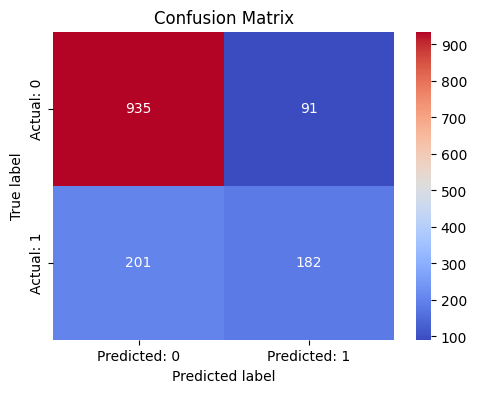

Area under ROC is 0.8439158892298924


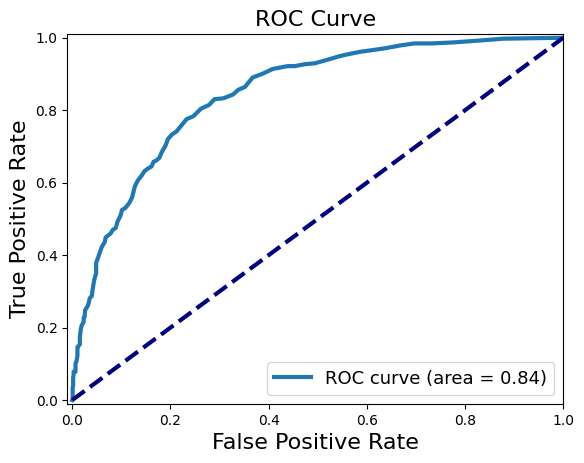



Training Gradient Boosting...
Results for Gradient Boosting:
Accuracy is  0.801277501774308
Recall is 0.4830287206266319
Precision is 0.6928838951310862
F1 score is 0.5692307692307692
              precision    recall  f1-score   support

           0       0.83      0.92      0.87      1026
           1       0.69      0.48      0.57       383

    accuracy                           0.80      1409
   macro avg       0.76      0.70      0.72      1409
weighted avg       0.79      0.80      0.79      1409



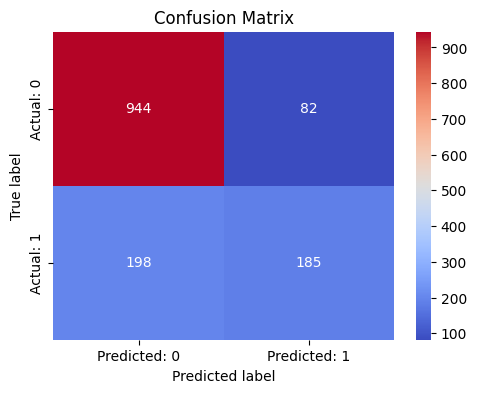

Area under ROC is 0.8567073325902514


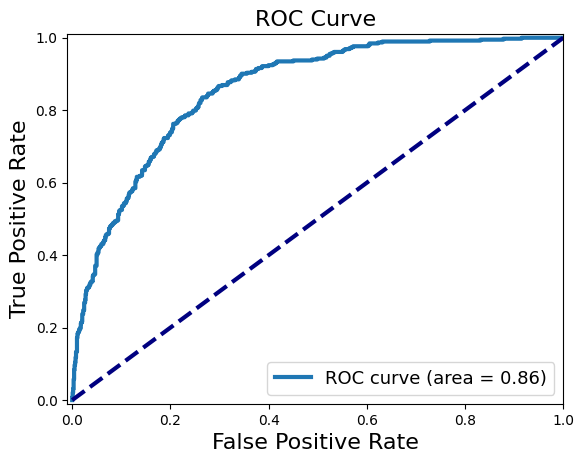



Training SVM...
Results for SVM:
Accuracy is  0.8005677785663591
Recall is 0.4699738903394256
Precision is 0.6976744186046512
F1 score is 0.561622464898596
              precision    recall  f1-score   support

           0       0.82      0.92      0.87      1026
           1       0.70      0.47      0.56       383

    accuracy                           0.80      1409
   macro avg       0.76      0.70      0.72      1409
weighted avg       0.79      0.80      0.79      1409



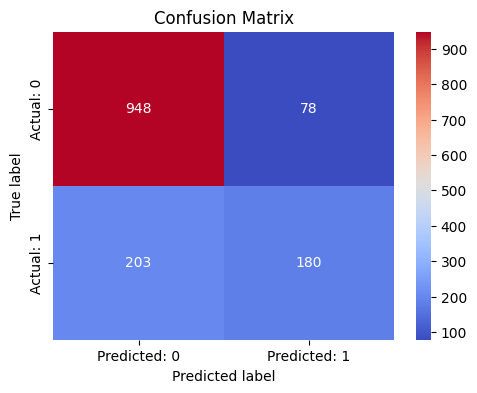

Area under ROC is 0.8054601255095963


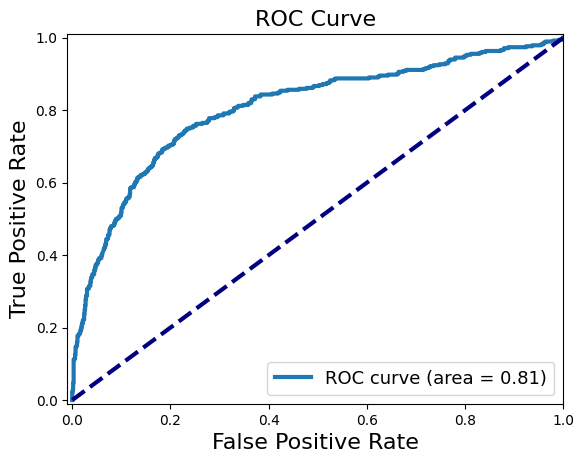



Training KNN...
Results for KNN:
Accuracy is  0.7735982966643009
Recall is 0.5404699738903395
Precision is 0.5914285714285714
F1 score is 0.5648021828103683
              precision    recall  f1-score   support

           0       0.83      0.86      0.85      1026
           1       0.59      0.54      0.56       383

    accuracy                           0.77      1409
   macro avg       0.71      0.70      0.71      1409
weighted avg       0.77      0.77      0.77      1409



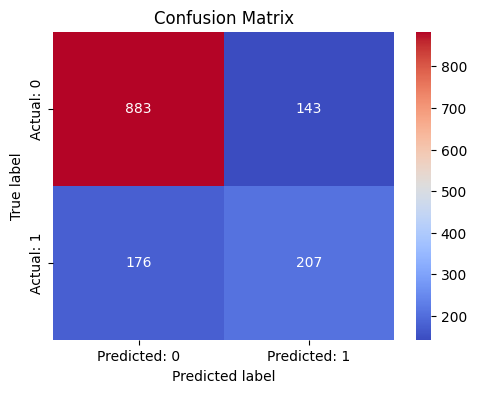

Area under ROC is 0.7918288977447971


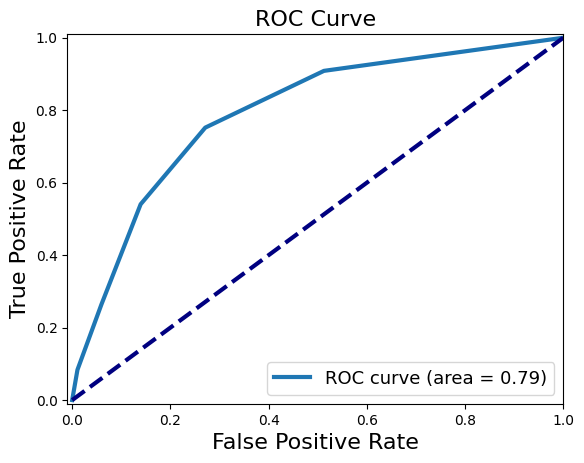



Training Naive Bayes...
Results for Naive Bayes:
Accuracy is  0.758694109297374
Recall is 0.7650130548302873
Precision is 0.5395948434622467
F1 score is 0.6328293736501079
              precision    recall  f1-score   support

           0       0.90      0.76      0.82      1026
           1       0.54      0.77      0.63       383

    accuracy                           0.76      1409
   macro avg       0.72      0.76      0.73      1409
weighted avg       0.80      0.76      0.77      1409



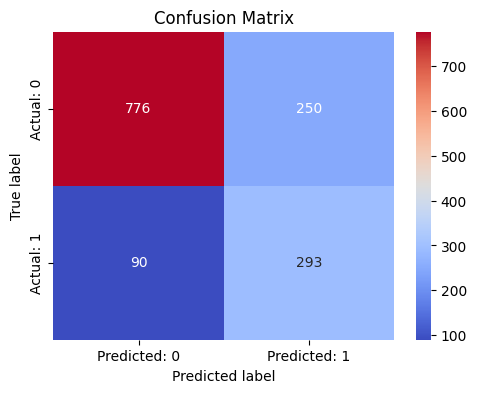

Area under ROC is 0.838626519882532


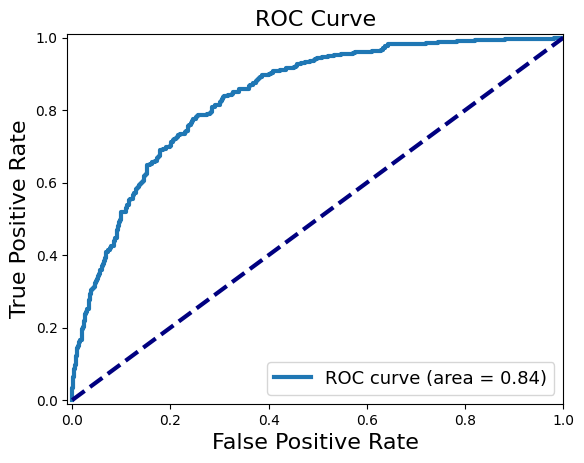



Training Neural Network...
Results for Neural Network:
Accuracy is  0.7906316536550745
Recall is 0.5274151436031331
Precision is 0.6392405063291139
F1 score is 0.5779685264663804
              precision    recall  f1-score   support

           0       0.83      0.89      0.86      1026
           1       0.64      0.53      0.58       383

    accuracy                           0.79      1409
   macro avg       0.74      0.71      0.72      1409
weighted avg       0.78      0.79      0.78      1409



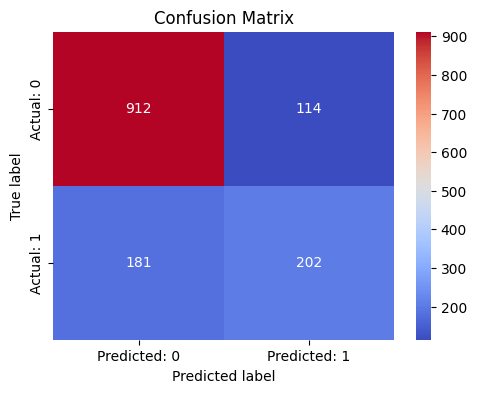

Area under ROC is 0.8240066368415963


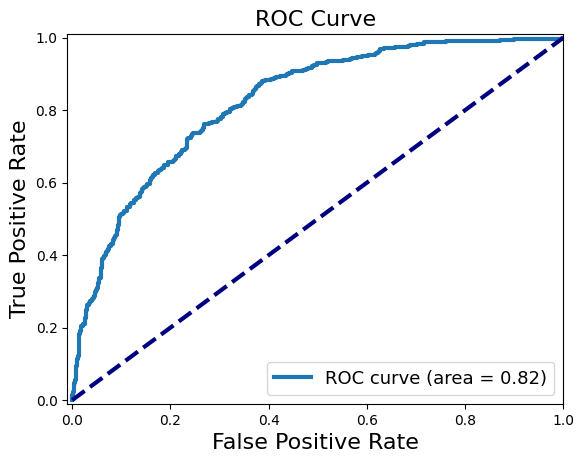



Training LightGBM...
[LightGBM] [Info] Number of positive: 1486, number of negative: 4148
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1000
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.263756 -> initscore=-1.026538
[LightGBM] [Info] Start training from score -1.026538
Results for LightGBM:
Accuracy is  0.8048261178140526
Recall is 0.5143603133159269
Precision is 0.6888111888111889
F1 score is 0.5889387144992527
              precision    recall  f1-score   support

           0       0.83      0.91      0.87      1026
           1       0.69      0.51      0.59       383

    accuracy                           0.80      1409
   macro avg       0.76      0.71      0.73      1409
weig

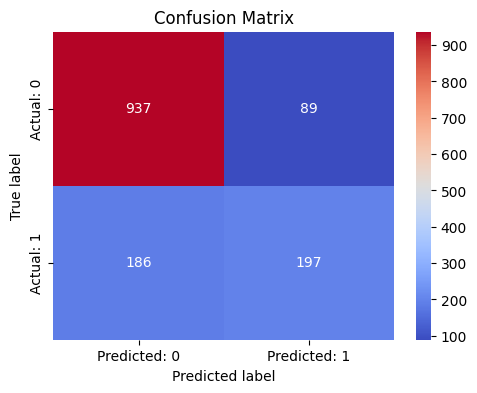

Area under ROC is 0.8539233200494709


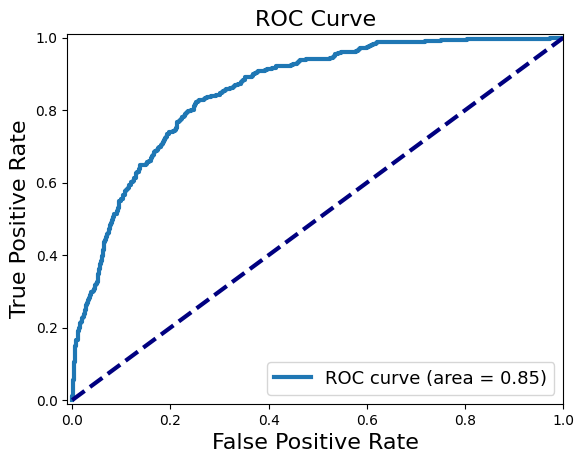



Training XGBoost...
Results for XGBoost:
Accuracy is  0.7885024840312278
Recall is 0.5039164490861618
Precision is 0.6411960132890365
F1 score is 0.564327485380117
              precision    recall  f1-score   support

           0       0.83      0.89      0.86      1026
           1       0.64      0.50      0.56       383

    accuracy                           0.79      1409
   macro avg       0.73      0.70      0.71      1409
weighted avg       0.78      0.79      0.78      1409



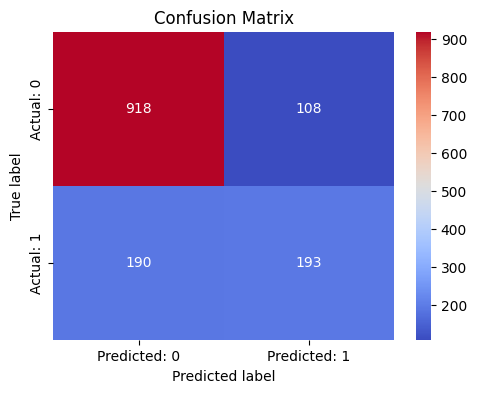

Area under ROC is 0.8317021157477389


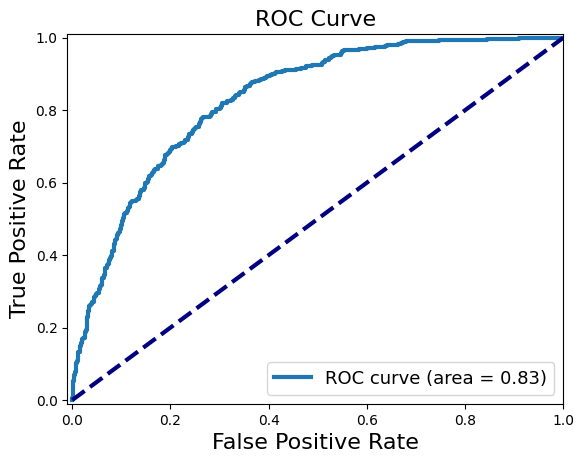



Training Cat Boost...
Results for Cat Boost:
Accuracy is  0.7963094393186657
Recall is 0.5013054830287206
Precision is 0.6666666666666666
F1 score is 0.5722801788375559
              precision    recall  f1-score   support

           0       0.83      0.91      0.87      1026
           1       0.67      0.50      0.57       383

    accuracy                           0.80      1409
   macro avg       0.75      0.70      0.72      1409
weighted avg       0.79      0.80      0.79      1409



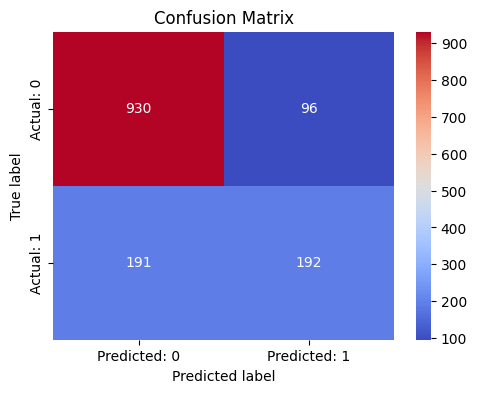

Area under ROC is 0.8523811705067719


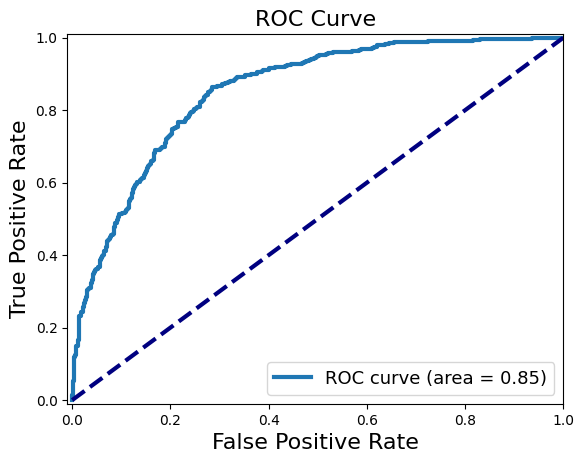

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=25)

pipeline = Pipeline(steps=[('scaler', StandardScaler())])
X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

for name, classifier in classifiers.items():
    print(f"Training {name}...")
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_test)
    y_pred_prob = classifier.predict_proba(X_test)[:, 1]
    print(f"Results for {name}:")
    evaluate(y_test, y_pred,y_pred_prob)
    print("\n" + "="*60 + "\n")

##### Voting Classifier

[LightGBM] [Info] Number of positive: 1486, number of negative: 4148
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1000
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.263756 -> initscore=-1.026538
[LightGBM] [Info] Start training from score -1.026538
Accuracy is  0.8041163946061036
Recall is 0.45691906005221933
Precision is 0.720164609053498
F1 score is 0.5591054313099042
              precision    recall  f1-score   support

           0       0.82      0.93      0.87      1026
           1       0.72      0.46      0.56       383

    accuracy                           0.80      1409
   macro avg       0.77      0.70      0.72      1409
weighted avg       0.79      0.80      0.79      

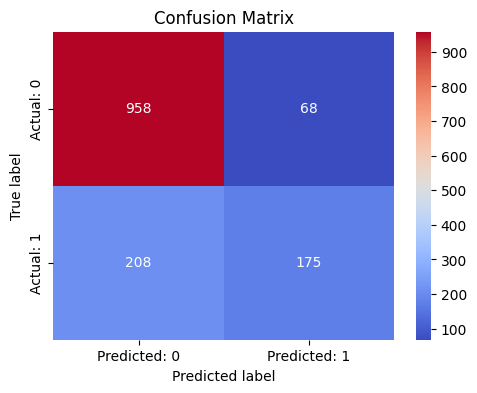

Area under ROC is 0.8523811705067719


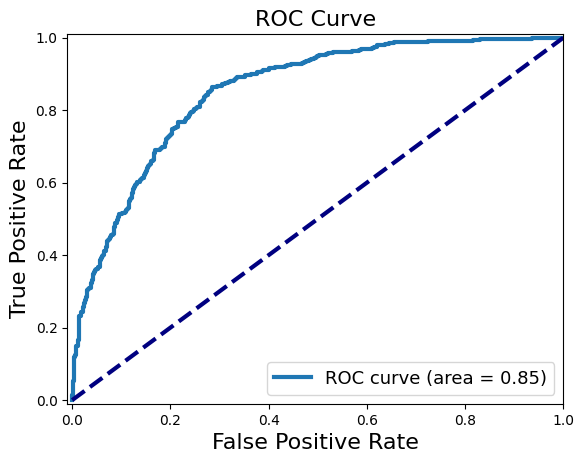

In [ ]:
# Voting Classifier

classifiers2 = [
    ('Logistic Regression', LogisticRegression(random_state=25)),
    # ('Decision Tree', DecisionTreeClassifier(random_state=25)),
    # ('Random Forest', RandomForestClassifier(random_state=25)),
    ('Gradient Boosting', GradientBoostingClassifier(random_state=25)),
    ('SVM', SVC(random_state=25, probability=True)),
    # ('KNN', KNeighborsClassifier()),
    # ('Naive Bayes', GaussianNB()),
    # ('Neural Network', MLPClassifier(random_state=25)),
    # ('XGBoost', XGBClassifier(random_state=25)),
    ('LightGBM', LGBMClassifier(random_state=25)),
    # ('Cat Boost', CatBoostClassifier(verbose=False,random_state=42, iterations= 2000))
]

voting_regressor = VotingClassifier(estimators=classifiers2)
voting_pipeline = Pipeline([
    ('model', voting_regressor)
])
voting_pipeline.fit(X_train, y_train)
y_pred = voting_pipeline.predict(X_test)
y_pred_prob = classifier.predict_proba(X_test)[:, 1]
evaluate(y_test, y_pred,y_pred_prob)

#####  Feature Engineering:

1.1 Identify and create new features that might have predictive power.
    1.2 Explore interactions between features that could be influential.
    1.3 Investigate if there are any transformations of the existing features that could improve model performance.

In [ ]:
# increase ROC by creating features

def create_feature_interaction(df):
    df['tenure_times_monthlycharges'] = df['tenure'] * df['MonthlyCharges']
    return df

def apply_feature_transformations(df):
    df['tenure_squared'] = df['tenure'] ** 2
    return df

categorical_features = ['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines',
                        'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
                        'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod']
numerical_features = ['tenure', 'MonthlyCharges', 'TotalCharges']

numerical_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')), 
    ('scaler', StandardScaler())
])

categorical_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),  
    ('onehot', OneHotEncoder(handle_unknown='ignore'))  
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_pipeline, numerical_features),
        ('cat', categorical_pipeline, categorical_features)
    ])

pipeline = Pipeline(steps=[
    ('interaction', FunctionTransformer(create_feature_interaction)),
    ('transformation', FunctionTransformer(apply_feature_transformations)),
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(random_state=25))
])


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=25)

pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'ROC AUC: {roc_auc}')

Accuracy: 0.8062455642299503
ROC AUC: 0.7205095709974094


##### GridSearch

In [ ]:
# Use the best parameters found by GridSearchCV
best_params = {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 300}

pipeline = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('classifier', RandomForestClassifier(random_state=25))
])

param_grid = {
    'classifier__n_estimators': [100, 200, 300],  
    'classifier__max_depth': [None, 10, 20],  
    'classifier__min_samples_split': [2, 5, 10],  
    'classifier__min_samples_leaf': [1, 2, 4],
}

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=25)

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='roc_auc')
grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)
print("Best ROC AUC score found: ", grid_search.best_score_)

y_pred = grid_search.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'ROC AUC: {roc_auc}')

Best parameters found:  {'classifier__max_depth': 10, 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 200}
Best ROC AUC score found:  0.8418555481999179
Accuracy: 0.7998580553584103
ROC AUC: 0.6997605342046733


In [ ]:
# Use the best parameters found by GridSearchCV
best_params = {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 300}

pipeline = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('classifier', RandomForestClassifier(random_state=25, **best_params))
])

pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'ROC AUC: {roc_auc}')

Accuracy: 0.7955997161107168
ROC AUC: 0.6968365575964861


##### features selection

In [ ]:
X_selected = X[selected_features]
y = df['Churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=25)
# using only selected features
X_train_selected, X_test_selected = X_train[selected_features], X_test[selected_features]


Training Logistic Regression...
Results for Logistic Regression:
Accuracy is  0.801277501774308
Recall is 0.5091383812010444
Precision is 0.6794425087108014
F1 score is 0.582089552238806
              precision    recall  f1-score   support

           0       0.83      0.91      0.87      1026
           1       0.68      0.51      0.58       383

    accuracy                           0.80      1409
   macro avg       0.76      0.71      0.73      1409
weighted avg       0.79      0.80      0.79      1409



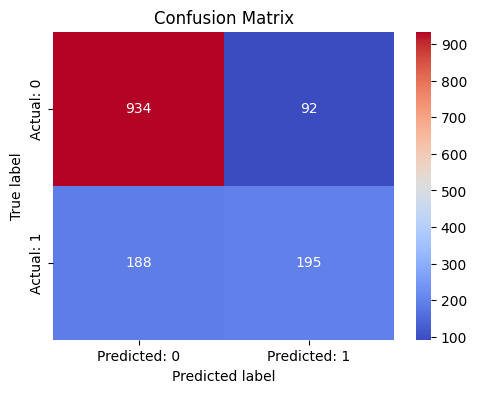

Area under ROC is 0.853406725400679


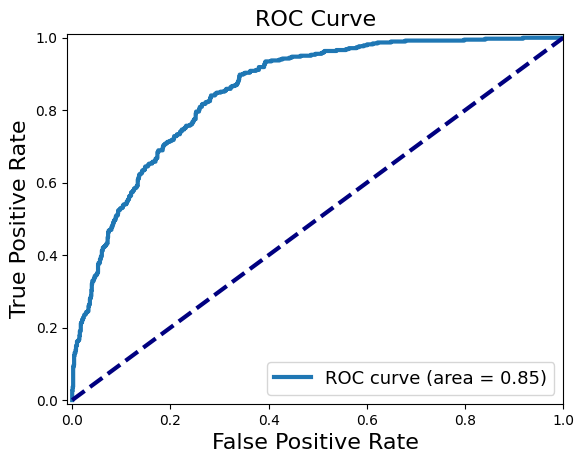



Training Gradient Boosting...
Results for Gradient Boosting:
Accuracy is  0.8069552874378992
Recall is 0.5065274151436031
Precision is 0.7003610108303249
F1 score is 0.5878787878787879
              precision    recall  f1-score   support

           0       0.83      0.92      0.87      1026
           1       0.70      0.51      0.59       383

    accuracy                           0.81      1409
   macro avg       0.77      0.71      0.73      1409
weighted avg       0.80      0.81      0.80      1409



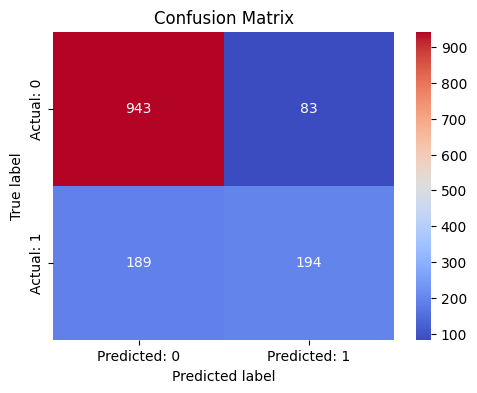

Area under ROC is 0.8565190172995587


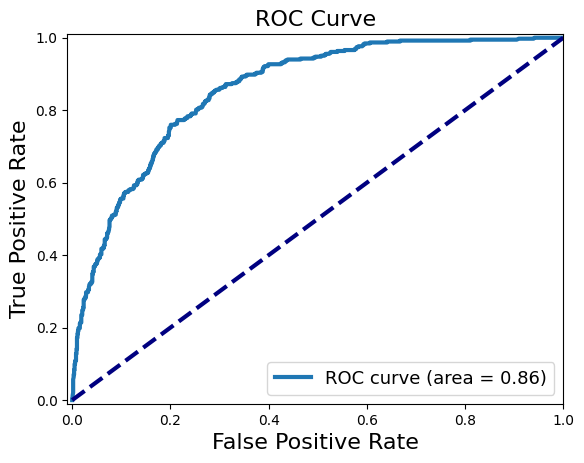



Training SVM...
Results for SVM:
Accuracy is  0.8026969481902059
Recall is 0.4595300261096606
Precision is 0.7125506072874493
F1 score is 0.5587301587301587
              precision    recall  f1-score   support

           0       0.82      0.93      0.87      1026
           1       0.71      0.46      0.56       383

    accuracy                           0.80      1409
   macro avg       0.77      0.70      0.72      1409
weighted avg       0.79      0.80      0.79      1409



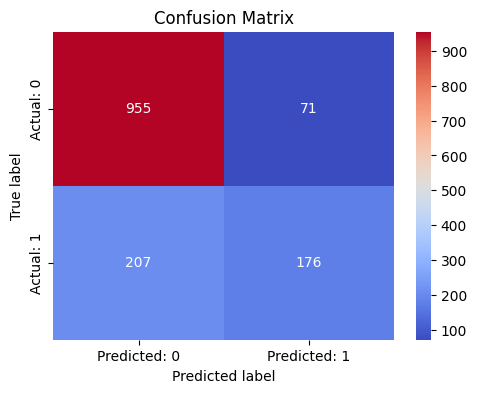

Area under ROC is 0.7994760254276538


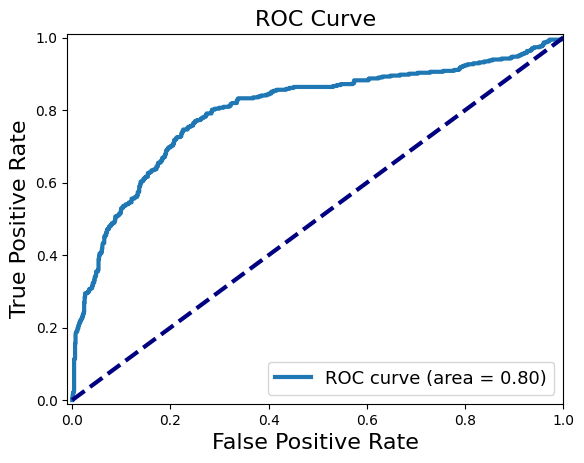



Training LightGBM...
[LightGBM] [Info] Number of positive: 1486, number of negative: 4148
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 711
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.263756 -> initscore=-1.026538
[LightGBM] [Info] Start training from score -1.026538
Results for LightGBM:
Accuracy is  0.7970191625266146
Recall is 0.5065274151436031
Precision is 0.6666666666666666
F1 score is 0.5756676557863502
              precision    recall  f1-score   support

           0       0.83      0.91      0.87      1026
           1       0.67      0.51      0.58       383

    accuracy                           0.80      1409
   macro avg       0.75      0.71      0.72      1409
weigh

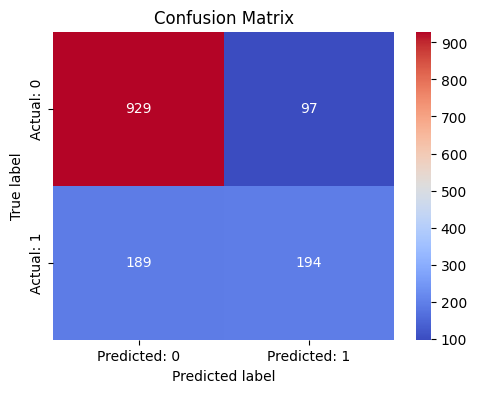

Area under ROC is 0.8537108291471353


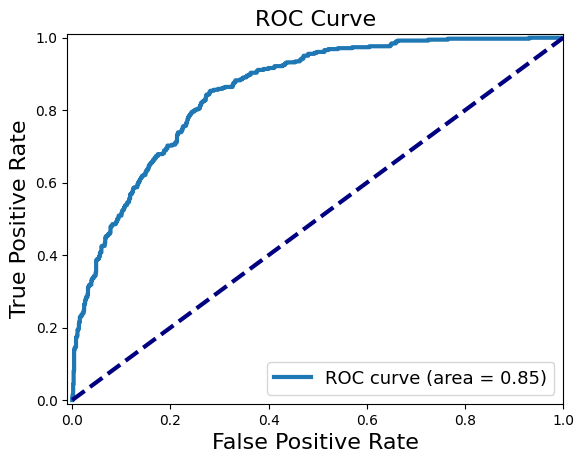

In [ ]:
pipeline = Pipeline(steps=[('scaler', StandardScaler())])
X_train_selected = pipeline.fit_transform(X_train_selected)
X_test_selected = pipeline.transform(X_test_selected)

for name, classifier in classifiers.items():
    print(f"Training {name}...")
    classifier.fit(X_train_selected, y_train)
    y_pred = classifier.predict(X_test_selected)
    y_pred_prob = classifier.predict_proba(X_test_selected)[:, 1]
    print(f"Results for {name}:")
    evaluate(y_test, y_pred,y_pred_prob)
    print("\n" + "="*60 + "\n")